In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


# Install Module

In [ ]:
# !pip install --upgrade tensorflow keras
# !pip install openpyxl

In [ ]:
import sys
print ('sys version : ' + sys.version)
import tensorflow as tf
print('tensorflow version : ' +tf.__version__)
import keras
print('keras version : ' +keras.__version__)

sys version : 3.11.11 (main, Dec  4 2024, 08:55:07) [GCC 11.4.0]
tensorflow version : 2.18.0
keras version : 3.8.0


# Setting Machine

In [ ]:
!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2024 NVIDIA Corporation
Built on Thu_Jun__6_02:18:23_PDT_2024
Cuda compilation tools, release 12.5, V12.5.82
Build cuda_12.5.r12.5/compiler.34385749_0


In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 54.8 gigabytes of available RAM

You are using a high-RAM runtime!


In [ ]:
import shutil
import subprocess
from tensorflow.python.client import device_lib

def get_available_devices():
    local_device_protos = device_lib.list_local_devices()
    return [x.name for x in local_device_protos]
print(get_available_devices())

# Cek apakah nvidia-smi tersedia
if shutil.which("nvidia-smi") is None:
    print(f"\033[93mWarning: The program continues to run with the CPU.\033[0m")
else:
    # Jalankan perintah nvidia-smi
    gpu_info = subprocess.run(["nvidia-smi"], capture_output=True, text=True)
    print(gpu_info.stdout)

['/device:CPU:0', '/device:GPU:0']
Wed Jul  2 14:35:10 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   43C    P0             12W /   70W |     102MiB /  15360MiB |      2%      Default |
|                                         |                        |                  N/A |
+------------

# Declaration of constants and import of modules

1. Mengimpor library untuk manipulasi data, visualisasi, dan pemrosesan gambar.
2. Menentukan path untuk dataset, model, dan output lainnya.
3. Membuat folder yang dibutuhkan jika belum ada.
4. Menentukan parameter gambar dan daftar penyakit yang akan diklasifikasikan.

In [ ]:
# Mengimpor Library
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import errno  # Impor modul errno
sns.set_theme()
import cv2

# Mendefinisikan Konstanta dan Path Direktori
ROOT_PATH = '/content/drive/MyDrive/SKRIPSI/PROJECT/'

CSV_OUTPUT_PATH = ROOT_PATH + '/csv_output'
MODEL_OUTPUT_RESNET_PATH = ROOT_PATH + '/model/RESNET'
MODEL_OUTPUT_VGG_PATH = ROOT_PATH + '/model/VGG'
TESTING_IMAGE_PATH = ROOT_PATH+'/Testing Images'
TRAINING_IMAGE_PATH = ROOT_PATH+'/Training Images'
TRAINING_IMAGE_CROPPED_PATH = ROOT_PATH+'/Training_Dataset_Cropped'
TRAINING_IMAGE_AUGMENTED_PATH = ROOT_PATH+'/Training_Dataset_Augmented'
TRAINING_IMAGE_UNIQUE_CLASS_AUGMENTED_PATH = ROOT_PATH+'/Training_Dataset_Unique_Class_Augmented'
CSV_FILE_PATH = ROOT_PATH + '/data.xlsx'


# Membuat Direktori Jika Belum Ada
def mkdir_if_not(folder):
  if not os.path.exists(folder):
    try:
      os.makedirs(folder)  # Gunakan os.makedirs untuk membuat direktori bertingkat jika diperlukan
    except OSError as e:
      if e.errno != errno.EEXIST:  # Abaikan error "File exists"
        raise

# Membuat Folder yang Diperlukan
def create_folders():
  mkdir_if_not(CSV_OUTPUT_PATH)
  mkdir_if_not(MODEL_OUTPUT_VGG_PATH)
  mkdir_if_not(MODEL_OUTPUT_RESNET_PATH)
  mkdir_if_not(TRAINING_IMAGE_CROPPED_PATH)
  # mkdir_if_not(TRAINING_IMAGE_AUGMENTED_PATH)
  # mkdir_if_not(TRAINING_IMAGE_UNIQUE_CLASS_AUGMENTED_PATH)

create_folders()

# Mengatur Parameter Gambar
KEEP_ASPECT_RATIO  = False
QUALITY = 100 # set the quality of the resultant jpg to 100%
IMAGE_WIDTH = 224
IMAGE_HEIGHT = 224
IMAGE_SIZE = 224 # image produces output of the same size, image_size x image_size

# Dictionary untuk Klasifikasi
DIAGNOSIS_DICO = {
    '10000000': 'Normal (N)',
    '01000000': 'Diabletes (D)',
    '00100000': 'Glaucoma (G)',
    '00010000': 'Cataract (C)',
    '00001000': 'Age related Mac. Degen. (A)',
    '00000100': 'Hypertension (H)',
    '00000010': 'Pathological Myopia (M)',
    '00000001': 'Other diseases/abnormalities (O)'
}
DISEASE_CLASSES = ['Normal', 'Diabetes', 'Glaucoma', 'Cataract', 'AMD', 'Hypertension', 'Myopia', 'Others'] # List Kelas Penyakit

## Loading Dataset

In [ ]:
df = pd.read_excel(CSV_FILE_PATH)
df.head()

,ID,Patient Age,Patient Sex,Left-Fundus,Right-Fundus,Left-Diagnostic Keywords,Right-Diagnostic Keywords,N,D,G,C,A,H,M,O
0,0,69,Female,0_left.jpg,0_right.jpg,cataract,normal fundus,0,0,0,1,0,0,0,0
1,1,57,Male,1_left.jpg,1_right.jpg,normal fundus,normal fundus,1,0,0,0,0,0,0,0
2,2,42,Male,2_left.jpg,2_right.jpg,laser spot，moderate non proliferative retinopathy,moderate non proliferative retinopathy,0,1,0,0,0,0,0,1
3,3,66,Male,3_left.jpg,3_right.jpg,normal fundus,branch retinal artery occlusion,0,0,0,0,0,0,0,1
4,4,53,Male,4_left.jpg,4_right.jpg,macular epiretinal membrane,mild nonproliferative retinopathy,0,1,0,0,0,0,0,1


# Preprocessing

1. Menghapus area hitam di sekitar gambar (remove_black_pixels).
2. Mengubah ukuran gambar dengan mempertahankan rasio aspek (resize_image).
3. Memproses semua gambar dalam folder (crop_all_images, resize_all_images).

## Image Cropping and resizing

---



In [ ]:
# Mengimpor Library
import cv2
import numpy as np
import PIL
from PIL import Image
from tqdm import tqdm

class ImageUtils:

    @staticmethod
    def remove_black_pixels(source_folder, destination_folder, file_name): # Menghapus Piksel Hitam di Sekitar Gambar
        if not os.path.exists(destination_folder):
            os.mkdir(destination_folder)

        # path gambar
        file = os.path.join(source_folder, file_name)

        #Gambar
        image = cv2.imread(file)

        # Mask untuk semua piksel berwarna
        mask = image > 0

        # Koordinat piksel berwarna.
        coordinates = np.argwhere(mask)

        # Mencari bounding box piksel yang tidak hitam
        x0, y0, s0 = coordinates.min(axis=0)
        x1, y1, s1 = coordinates.max(axis=0) + 1

        # Bounding box yang dipotong
        cropped = image[x0:x1, y0:y1]

        # gambar yang dipotong
        file_cropped = os.path.join(destination_folder, file_name)
        cv2.imwrite(file_cropped, cropped)

    @staticmethod
    def resize_image(source_folder, destination_folder, image_width, image_height, quality, keep_aspect_ratio, file_name): # Mengubah Ukuran Gambar
        file = os.path.join(source_folder, file_name)
        img = Image.open(file)
        if keep_aspect_ratio:
            # mempertahankan rasio lebar-tinggi gambar asli
            width_percentage = (image_width / float(img.size[0]))
            height_size = int((float(img.size[1]) * float(width_percentage)))
            img = img.resize((image_width, height_size), PIL.Image.Resampling.LANCZOS)
        else:
            img = img.resize((image_width, image_height), PIL.Image.Resampling.LANCZOS)

        img.save(os.path.join(destination_folder, file_name), optimize=True, quality=quality)


    @staticmethod
    def crop_all_images(source_folder, destination_folder): # Memotong Semua Gambar dalam Folder
        files = [f for f in os.listdir(source_folder) if os.path.isfile(os.path.join(source_folder, f))]
        pbar = tqdm(files)
        for file in pbar:
            pbar.set_description('Cropping images: ' + file)
            ImageUtils.remove_black_pixels(source_folder, destination_folder, file)

    @staticmethod
    def resize_all_images(source_folder, destination_folder, image_width, image_height, quality, keep_aspect_ratio): # Mengubah Ukuran Semua Gambar dalam Folder
        if not os.path.exists(destination_folder):
            os.mkdir(destination_folder)
        files = [f for f in os.listdir(source_folder) if os.path.isfile(os.path.join(source_folder, f))]
        pbar = tqdm(files)
        for file in tqdm(files):
            pbar.set_description('Resize image: ' + file)
            ImageUtils.resize_image(source_folder, destination_folder, image_width, image_height, quality, keep_aspect_ratio, file_name=file)

### **Crop and resize  all Trainning images**

In [ ]:
# Fungsi untuk Memproses Gambar
def crop_all_images(source_folder, destination_folder):
    ImageUtils.crop_all_images(source_folder, destination_folder)

def resize_all_images(source_folder, destination_folder, image_width, image_height, quality, keep_aspect_ratio):
    ImageUtils.resize_all_images(source_folder, destination_folder, image_width, image_height, quality, keep_aspect_ratio)

# Menjalankan Proses Pemrosesan Gambar
source_folder = TRAINING_IMAGE_PATH
destination_folder = TRAINING_IMAGE_CROPPED_PATH
# crop_all_images(source_folder, destination_folder)

source_folder = TRAINING_IMAGE_CROPPED_PATH
destination_folder = TRAINING_IMAGE_CROPPED_PATH + '_' + str(IMAGE_SIZE)
keep_aspect_ratio = KEEP_ASPECT_RATIO
quality = QUALITY
# resize_all_images(source_folder, destination_folder, IMAGE_WIDTH, IMAGE_HEIGHT, quality, keep_aspect_ratio)

# Dataset Reconstitution

### Diagnosis Class

---  

1. Memeriksa pengecualian gambar diagnosis berdasarkan kata kunci.
2. Mencocokkan kata kunci dengan daftar penyakit menggunakan kamus yang telah didefinisikan.
3. Mengonversi kata kunci menjadi vektor diagnosis biner untuk pemrosesan lebih lanjut.
4. Menggabungkan diagnosis dari mata kiri dan kanan untuk mendapatkan diagnosis keseluruhan pasien.
5. Menyimpan hasil diagnosis ke dalam file CSV untuk analisis lebih lanjut.
6. Menentukan kelas penyakit utama dalam gambar fundus, asalkan hanya satu penyakit yang terdeteksi.

In [ ]:
import functools # for split

class Diagnostic:
    #  Vektor Daftar Penyakit
    # '10000000': 'Normal (N)',
    # '01000000': 'Diabletes (D)',
    # '00100000': 'Glaucoma (G)',
    # '00010000': 'Cataract (C)',
    # '00001000': 'Age related Mac. Degen. (A)',
    # '00000100': 'Hypertension (H)',
    # '00000010': 'Pathological Myopia (M)',
    # '00000001': 'Other diseases/abnormalities (O)'

    # Daftar kata kunci yang digunakan untuk mendeteksi penyakit mata
    DIAGNOSIS_KEYWORD_DICT = {
            0: ['normal fundus'],
            1: ['diabetic retinopathy', 'proliferative retinopathy'],
            2: ['glaucoma'],
            3: ['cataract'],
            4: ['macular degeneration'],
            5: ['hypertensive retinopathy'],
            6: ['myopi']
        }

    DISEASE_CLASSES = ['Normal', 'Diabetes', 'Glaucoma', 'Cataract', 'AMD', 'Hypertension', 'Myopia', 'Others'] # Daftar nama penyakit yang digunakan sebagai label dalam klasifikasi.
    DIAGNOSTIC_ZERO_VECTOR = [0, 0, 0, 0, 0, 0, 0, 0] # digunakan untuk kasus di mana tidak ada diagnosis yang dapat dipastikan.

    def __init__(self):
      pass

    @staticmethod
    def is_decisive(diagnostic_keyword): # Memeriksa apakah kata kunci diagnosis termasuk dalam daftar kata kunci yang tidak menentukan.
        not_decisive_keywords = ["lens dust", "optic disk photographically invisible", "low image quality", "image offset"]
        return not (diagnostic_keyword in not_decisive_keywords)

    @staticmethod
    def is_blacklisted_keyword(diagnostic_keyword): # Memeriksa apakah kata kunci termasuk dalam daftar kata kunci yang dilarang.
        blacklist_keywords = ["anterior segment image", "no fundus image"]
        return diagnostic_keyword in blacklist_keywords

    @staticmethod
    def is_blacklisted_image(image_name): # Memeriksa apakah suatu gambar ada dalam daftar gambar yang dikecualikan.
        blacklist_images = {'2174_right.jpg', '2175_left.jpg', '2176_left.jpg', '2177_left.jpg', '2177_right.jpg',
                     '2178_right.jpg', '2179_left.jpg', '2179_right.jpg', '2180_left.jpg', '2180_right.jpg',
                     '2181_left.jpg', '2181_right.jpg', '2182_left.jpg', '2182_right.jpg', '2957_left.jpg',
                     '2957_right.jpg'}
        return image_name in blacklist_images

    @staticmethod
    def is_in_keyword(keywords, keyword): # Memeriksa apakah kata kunci tertentu ada dalam daftar kata kunci diagnosis.
        for k in keywords:
            if k in keyword:
                return True
        return False

    def match_diagnosis_patient_label(self, keyword): # Mencari kecocokan antara kata kunci yang diberikan dengan daftar penyakit dalam DIAGNOSIS_KEYWORD_DICT, kemudian mengembalikan indeks penyakit yang sesuai.
        for key in Diagnostic.DIAGNOSIS_KEYWORD_DICT:
            keywords = Diagnostic.DIAGNOSIS_KEYWORD_DICT[key]
            if Diagnostic.is_in_keyword(keywords, keyword):
              return key
        return -1


    # Mengonversi daftar kata kunci menjadi vektor diagnosis biner, di mana setiap elemen dalam vektor mewakili keberadaan suatu penyakit (1 jika ada, 0 jika tidak).
    # Jika sebuah gambar memiliki diagnosis Glaukoma, maka vektor diagnosisnya adalah [0, 0, 1, 0, 0, 0, 0, 0]. dan Jika sebuah gambar memiliki diagnosis Diabetes dan Katarak, maka vektor diagnosisnya adalah [0, 1, 0, 1, 0, 0, 0, 0].
    def compute_diagnosis_vector(self, keywords):
        replacements = ('，', ',')
        keywords = functools.reduce(lambda s, sep: s.replace(sep, ';'), replacements, keywords)
        diagnostic_keywords = [x.strip() for x in keywords.split(';')]
        diagnostic_vector = [0, 0, 0, 0, 0, 0, 0, 0]

        for diagnostic_keyword in diagnostic_keywords:
            if self.is_blacklisted_keyword(diagnostic_keyword) or not self.is_decisive(diagnostic_keyword):
              return Diagnostic.DIAGNOSTIC_ZERO_VECTOR
            patient_label = self.match_diagnosis_patient_label(diagnostic_keyword)
            if patient_label >= 0:
                diagnostic_vector[patient_label] = 1
            else:
                diagnostic_vector[7] = 1
        return diagnostic_vector

    def get_diagnosis_labels(self, diagnosis_vector): #  Mengambil nilai dari vektor diagnosis dan mengembalikan setiap label penyakit secara individual.
        normal = diagnosis_vector[0]
        diabetes = diagnosis_vector[1]
        glaucoma = diagnosis_vector[2]
        cataract = diagnosis_vector[3]
        amd = diagnosis_vector[4]
        hypertension = diagnosis_vector[5]
        myopia = diagnosis_vector[6]
        others = diagnosis_vector[7]
        return normal, diabetes, glaucoma, cataract, amd, hypertension, myopia, others, normal + diabetes + glaucoma + cataract + amd + hypertension + myopia + others

    def get_combined_diagnosis_vector(self, left_vector, right_vector): # Menggabungkan diagnosis dari mata kiri dan mata kanan untuk menghasilkan satu vektor diagnosis keseluruhan pasien.
        diagnostic_vector = [0, 0, 0, 0, 0, 0, 0, 0]
        if left_vector[0] and right_vector[0]:
            diagnostic_vector[0] = 1
        diagnostic_vector[1] = left_vector[1] or right_vector[1]
        diagnostic_vector[2] = left_vector[2] or right_vector[2]
        diagnostic_vector[3] = left_vector[3] or right_vector[3]
        diagnostic_vector[4] = left_vector[4] or right_vector[4]
        diagnostic_vector[5] = left_vector[5] or right_vector[5]
        diagnostic_vector[6] = left_vector[6] or right_vector[6]
        diagnostic_vector[7] = left_vector[7] or right_vector[7]
        return diagnostic_vector

    def write_diagnostic_csv_row(self, csv_file_writer, fundus, age, sex, diagnosis_vector): # Menulis informasi diagnosis ke dalam file CSV, termasuk informasi gambar fundus, usia, jenis kelamin, dan penyakit yang terdeteksi.

        normal, diabetes, glaucoma, cataract, amd, hypertension, myopia, others, _ =  self.get_diagnosis_labels(diagnosis_vector)
        if age is not None and sex is not None:
          csv_file_writer.writerow([fundus, age, sex, normal, diabetes, glaucoma, cataract, amd, hypertension, myopia,
                                  others])
        else:
          csv_file_writer.writerow([fundus, normal, diabetes, glaucoma, cataract, amd, hypertension, myopia,
                                  others])

    def compute_class_name(self, diagnosis_vector): # menentukan kelas penyakit utama pada gambar berdasarkan vektor diagnostiknya. Jika vektor menunjukkan beberapa penyakit, gambar akan diabaikan.
        normal, diabetes, glaucoma, cataract, amd, hypertension, myopia, others, sum_disease =  self.get_diagnosis_labels(diagnosis_vector)
        disease_class = -1
        if sum_disease == 1:
            if normal == 1:
                disease_class = Diagnostic.DISEASE_CLASSES.index('Normal')
            elif diabetes == 1:
                 disease_class = Diagnostic.DISEASE_CLASSES.index('Diabetes')
            elif glaucoma == 1:
                disease_class = Diagnostic.DISEASE_CLASSES.index('Glaucoma')
            elif cataract == 1:
                disease_class = Diagnostic.DISEASE_CLASSES.index('Cataract')
            elif amd == 1:
                disease_class = Diagnostic.DISEASE_CLASSES.index('AMD')
            elif hypertension == 1:
                disease_class = Diagnostic.DISEASE_CLASSES.index('Hypertension')
            elif myopia == 1:
                disease_class = Diagnostic.DISEASE_CLASSES.index('Myopia')
            elif others == 1:
                disease_class = Diagnostic.DISEASE_CLASSES.index('Others')
        return normal, diabetes, glaucoma, cataract, amd, hypertension, myopia, others, disease_class

    def write_diagnostic_class_csv(self, csv_file_writer, fundus, diagnosis_vector): # Menulis hanya diagnosis yang unik (jika hanya ada satu penyakit dalam vektor diagnosis) ke dalam CSV.
        normal, diabetes, glaucoma, cataract, amd, hypertension, myopia, others, disease_class = self.compute_class_name(diagnosis_vector)
        if disease_class != -1:
            csv_file_writer.writerow([fundus, normal, diabetes, glaucoma, cataract, amd, hypertension, myopia, others, disease_class])
            return True
        return False

### Patient Class
---

1. Mengolah diagnosis berdasarkan kata kunci.
2. Menyimpan informasi dalam format yang terstruktur agar Menampilkan data pasien dengan mudah dibaca.

In [ ]:
class Patient:

    def __init__(self, patient_id, age, sex, eye_side, eye_fundus_image_path, keywords, diagnosis_original_vector):
        self.id = patient_id # ID unik
        self.age = age # Usia
        self.sex = sex # Kata kunci diagnosis
        self.eye_side = eye_side # 'left' or 'right'
        self.eye_fundus_image_path = eye_fundus_image_path # Path file gambar
        self.diagnostic_keywords = keywords # Kata kunci diagnosis
        self.diagnosis_original_vector = diagnosis_original_vector # Vektor diagnosis asli
        self.diagnosis_computed_vector = [] # Vektor diagnosis yang dihitung berdasarkan analisis (default kosong)

    def set_diagnosis_computed_vector(self, diagnosis_vector): # Metode ini digunakan untuk menyimpan hasil diagnosis yang telah dihitung ke dalam atribut
        self.diagnosis_computed_vector = diagnosis_vector

    def __str__(self) -> str: # Metode ini mengatur bagaimana objek Patient ditampilkan dalam bentuk string ketika dipanggil dengan patient
      s = r'id {}'.format(self.id)
      s += '\n'
      s += r'age {}'.format(self.age)
      s += '\n'
      s += r'sex {}'.format(self.sex)
      s += '\n'
      s += r'eye {}'.format(self.eye_side)
      s += '\n'
      s += r'image  {}'.format(self.eye_fundus_image_path)
      s += '\n'
      s += r'diagnostic {}'.format(self.diagnostic_keywords)
      s += '\n'
      s += r'diagnosis_original_vector {}'.format(self.diagnosis_original_vector)
      s += '\n'
      s += r'diagnosis_computed_vector {}'.format(self.diagnosis_computed_vector)
      s += '\n'
      return s

### Odirdataset Class
---

1. Kelas ini memproses dataset ODIR, mengubah data pasien menjadi objek Patient, dan menyimpan hasilnya ke CSV.
2. Struktur diagnosis didasarkan pada vektor diagnosis biner.
3. Mekanisme filtrasi memastikan hanya gambar yang valid masuk ke dataset.
4. Fitur tambahan seperti jumlah penyakit per pasien (Label) membantu dalam analisis data.

In [ ]:
import csv
from tqdm import tqdm

class ODIRDataset:
    def __init__(self, dataset, diagnostic):
        self.dataset = dataset
        self.diagnostic = diagnostic
        self.patients = {}


    @staticmethod
    def create_diagnosis_vector(dataset, index): # Membuat Vektor Diagnosis
        diagnosis_vector = [0, 0, 0, 0, 0, 0, 0, 0]
        diagnosis_vector[0] = dataset['N'][index]
        diagnosis_vector[1] = dataset['D'][index]
        diagnosis_vector[2] = dataset['G'][index]
        diagnosis_vector[3] = dataset['C'][index]
        diagnosis_vector[4] = dataset['A'][index]
        diagnosis_vector[5] = dataset['H'][index]
        diagnosis_vector[6] = dataset['M'][index]
        diagnosis_vector[7] = dataset['O'][index]
        return  diagnosis_vector


    def create_patient(self, patient_id, age, sex, eye_side, eye_fundus_image_path, keywords, diagnosis_original_vector): # membuat objek Pasien. Metode ini mengambil informasi tentang pasien sebagai argumen (ID, usia, jenis kelamin, dll.)

        diagnosis_computed_vector = self.diagnostic.compute_diagnosis_vector(keywords) # Menghitung diagnosis_computed_vector dari kata kunci.

        # Jika vektor terhitung tidak hanya Nol dan gambar tidak masuk daftar hitam maka Tambahkan pasien ke kamus pasien Jika tidak, kembalikan Tidak Ada
        if (np.count_nonzero(diagnosis_computed_vector) > 0) and not self.diagnostic.is_blacklisted_image(eye_fundus_image_path):
            patient = Patient(patient_id, age, sex, eye_side, eye_fundus_image_path, keywords, diagnosis_original_vector)
            patient.set_diagnosis_computed_vector(diagnosis_computed_vector)
            return patient
        return None


    def generate_patient(self, dataset, index, eye_side): # membuat objek Pasien untuk mata tertentu (kiri atau kanan) pasien. Metode ini mengambil dataset, indeks baris, dan sisi mata sebagai argumen.
        patient_id = dataset['ID'][index]
        age = dataset['Patient Age'][index]
        sex = dataset['Patient Sex'][index]
        fundus = None
        keywords = None
        if eye_side == 'right':
          fundus = dataset['Right-Fundus'][index]
          keywords = dataset['Right-Diagnostic Keywords'][index]
        else:
          fundus = dataset['Left-Fundus'][index]
          keywords = dataset['Left-Diagnostic Keywords'][index]

        diagnosis_original_vector = ODIRDataset.create_diagnosis_vector(dataset, index)

        patient = self.create_patient(patient_id, age, sex, eye_side, fundus, keywords, diagnosis_original_vector)
        return patient


    def generate_patients(self): # mengulangi kumpulan data dan membuat objek Pasien untuk mata kiri dan kanan setiap pasien.
        for index in self.dataset.index:
          left_eye = self.generate_patient(self.dataset, index, 'left')
          if left_eye is not None:
              self.patients[left_eye.eye_fundus_image_path] = left_eye
          right_eye = self.generate_patient(self.dataset, index, 'right')
          if right_eye is not None:
              self.patients[right_eye.eye_fundus_image_path] = right_eye
        return self.patients


    def reconstruct_patient_eye_disease_csv(self, destination_folder, file_name='odir_multilabel'):   #  Metode ini membuat berkas CSV yang berisi informasi diagnostik untuk setiap mata setiap pasien.
        # Merekonstruksi CSV pasien dengan anotasi untuk setiap mata
        if not os.path.exists(destination_folder):
            os.mkdir(destination_folder)
        csv_file = os.path.join(destination_folder, file_name+'.csv')
        with open(csv_file, 'w', newline='') as csv_file:
            file_writer = csv.writer(csv_file, delimiter=',', quotechar='|', quoting=csv.QUOTE_MINIMAL)
            file_writer.writerow(['ID', 'Normal', 'Diabetes', 'Glaucoma', 'Cataract', 'AMD', 'Hypertension',
                                  'Myopia', 'Others'])
            for index in self.dataset.index:
                left_fundus = self.dataset['Left-Fundus'][index]
                right_fundus = self.dataset['Right-Fundus'][index]

                if left_fundus in self.patients: # Periksa apakah mata kiri ada
                    self.diagnostic.write_diagnostic_csv_row(file_writer, left_fundus, None, None, self.patients[left_fundus].diagnosis_computed_vector)

                if right_fundus in self.patients: # Periksa apakah mata kanan ada
                    self.diagnostic.write_diagnostic_csv_row(file_writer, right_fundus, None, None, self.patients[right_fundus].diagnosis_computed_vector)


    def reconstruct_odir_csv(self, destination_folder, file_name='odir_full'):
        # Reconstructing the patient CSV with the annotations for each eye
        if not os.path.exists(destination_folder):
            os.mkdir(destination_folder)
        csv_file = os.path.join(destination_folder, file_name+'.csv')

        with open(csv_file, 'w', newline='') as csv_file:
            file_writer = csv.writer(csv_file, delimiter=',', quotechar='|', quoting=csv.QUOTE_MINIMAL)

            # Menambahkan header kolom, dengan tambahan 'Label' di akhir
            file_writer.writerow(['ID', 'Age', 'Sex', 'Normal', 'Diabetes', 'Glaucoma', 'Cataract', 'AMD',
                                  'Hypertension', 'Myopia', 'Others', 'Total_Label'])

            for index in self.dataset.index:
                left_fundus = self.dataset['Left-Fundus'][index]
                right_fundus = self.dataset['Right-Fundus'][index]

                # Cek apakah mata kiri ada dalam dataset pasien
                if left_fundus in self.patients:
                    patient = self.patients[left_fundus]
                    label_count = sum(patient.diagnosis_computed_vector)  # Hitung jumlah diagnosis aktif
                    file_writer.writerow([left_fundus, patient.age, patient.sex] +
                                        patient.diagnosis_computed_vector + [label_count])  # Tambahkan Label

                # Cek apakah mata kanan ada dalam dataset pasien
                if right_fundus in self.patients:
                    patient = self.patients[right_fundus]
                    label_count = sum(patient.diagnosis_computed_vector)  # Hitung jumlah diagnosis aktif
                    file_writer.writerow([right_fundus, patient.age, patient.sex] +
                                        patient.diagnosis_computed_vector + [label_count])  # Tambahkan Label

    def generate_patient_eye_disease_unique_class_csv(self, destination_folder, file_name='odir_singlelabel'): # membuat berkas CSV yang berisi informasi tentang gambar yang memiliki satu diagnosis unik. Ia menyaring gambar dengan beberapa diagnosis.
        if not os.path.exists(destination_folder):
            os.mkdir(destination_folder)
        csv_file = os.path.join(destination_folder, file_name+'.csv')

        # gambar yang memiliki multi-label
        with open(csv_file, 'w', newline='') as csv_file:
            file_writer = csv.writer(csv_file, delimiter=',', quotechar='|', quoting=csv.QUOTE_MINIMAL)
            file_writer.writerow(['ID', 'Normal', 'Diabetes', 'Glaucoma', 'Cataract', 'AMD', 'Hypertension',
                                  'Myopia', 'Others', 'Label'])
            for index in self.dataset.index:
                left_fundus = self.dataset['Left-Fundus'][index]
                right_fundus = self.dataset['Right-Fundus'][index]

                if left_fundus in self.patients:
                    _ = self.diagnostic.write_diagnostic_class_csv(file_writer, left_fundus, self.patients[left_fundus].diagnosis_computed_vector)

                if right_fundus in self.patients:
                    _ = self.diagnostic.write_diagnostic_class_csv(file_writer, right_fundus, self.patients[right_fundus].diagnosis_computed_vector)


### Generation of CSV files
---

In [ ]:
import time
import logging

logging.config.fileConfig(ROOT_PATH + '/logging.conf')

start = time.time()
print('Generating all patient information (eye fundus) and creating a patient dictionary')

# Assuming ODIRDataset and Diagnostic are already defined
odir = ODIRDataset(df, Diagnostic())
logging.info('Patient generation started')
patients = odir.generate_patients()
logging.info('Patient generation finished')

logging.info('Rebuilding the unique class disease CSV started')
odir.generate_patient_eye_disease_unique_class_csv(CSV_OUTPUT_PATH)
logging.info('Rebuilding the unique class disease CSV finished')

logging.info('Rebuilding the disease CSV started')
odir.reconstruct_patient_eye_disease_csv(CSV_OUTPUT_PATH)
logging.info('Rebuilding the disease CSV finished')

logging.info('Rebuilding the full CSV started')
odir.reconstruct_odir_csv(CSV_OUTPUT_PATH)
logging.info('Rebuilding the full CSV finished')

end = time.time()
logging.info('Done in ' + str(end - start) + ' seconds')


Generating all patient information (eye fundus) and creating a patient dictionary
2025-03-10 04:19:48 - root - INFO - Patient generation started
2025-03-10 04:19:48 - root - INFO - Patient generation finished
2025-03-10 04:19:48 - root - INFO - Rebuilding the unique class disease CSV started
2025-03-10 04:19:49 - root - INFO - Rebuilding the unique class disease CSV finished
2025-03-10 04:19:49 - root - INFO - Rebuilding the disease CSV started
2025-03-10 04:19:49 - root - INFO - Rebuilding the disease CSV finished
2025-03-10 04:19:49 - root - INFO - Rebuilding the full CSV started
2025-03-10 04:19:49 - root - INFO - Rebuilding the full CSV finished
2025-03-10 04:19:49 - root - INFO - Done in 1.804328203201294 seconds


# Data Augmentation

### Imagefx Class
---

In [ ]:
# Import Library
import numpy as np
import tensorflow as tf
from skimage import exposure
import matplotlib.pyplot as plt
import os
import random
import cv2

# Kelas ini digunakan untuk augmentasi gambar
class ImageFx:

    def __init__(self, image_size):
        self.image_size = image_size

    def zooming(self, cv_image, zoom_range=(0.5, 0.5)):
        image = np.asarray(cv_image, dtype=np.float32)
        image = tf.keras.preprocessing.image.random_zoom(image, zoom_range=zoom_range, row_axis=0, col_axis=1, channel_axis=2, fill_mode='constant', cval=0.0, interpolation_order=1)
        image = np.array(image, dtype=np.uint8)
        return image

    def brightness(self, image, delta):
        image = tf.image.adjust_brightness(image, delta)
        image = np.array(image, dtype=np.uint8)
        return image

    def rescale_intensity(self, cv_image, q=(2, 98)):
        p0, pn = np.percentile(cv_image, q)
        image = exposure.rescale_intensity(cv_image, in_range=(p0, pn))
        return image

    def contrast(self, cv_image, contrast_factor=2):
        image = tf.image.adjust_contrast(cv_image, contrast_factor)
        image = np.array(image, dtype=np.uint8)
        return image

    def saturation(self, cv_image, saturation_factor=0.5):
        image = tf.image.adjust_saturation(cv_image, saturation_factor)
        image = np.array(image, dtype=np.uint8)
        return image

    def gamma(self, cv_image, gamma=0.5):
        image = tf.image.adjust_gamma(cv_image, gamma)
        image = np.array(image, dtype=np.uint8)
        return image

    def hue(self, cv_image, delta=0.2):
        image = tf.image.adjust_hue(cv_image, delta)
        image = np.array(image, dtype=np.uint8)
        return image

    def crop_to_bounding_box(self, cv_image, offset_height, offset_width, target_height, target_width):
        image = tf.image.crop_to_bounding_box(cv_image, offset_height, offset_width, target_height, target_width)
        image = tf.image.resize(image, (self.image_size, self.image_size))
        image = np.array(image, dtype=np.uint8)
        return image

    def rot90(self, cv_image, k):
        image = tf.image.rot90(cv_image, k)
        image = np.array(image, dtype=np.uint8)
        return image

    def flip_left_right(self, cv_image):
        image = tf.image.flip_left_right(cv_image)
        image = np.array(image, dtype=np.uint8)
        return image

    def flip_up_down(self, cv_image):
        image = tf.image.flip_up_down(cv_image)
        image = np.array(image, dtype=np.uint8)
        return image

    def central_crop(self, cv_image, central_fraction):
        image = tf.image.central_crop(cv_image, central_fraction)
        image = np.array(image, dtype=np.uint8)
        return image

    def random_crop_and_resize(self, cv_image, resize_image, window_size=150):
        image = self.random_crop(cv_image, window_size)
        if resize_image:
          image = tf.image.resize(image, (self.image_size, self.image_size))
          image = np.array(image, dtype=np.uint8)
        return image


    def random_tranform(self, cv_image, index):
        output_image = None
        tranform_name = ''
        if index == 0:
            image_mid_size = int(self.image_size/2.0)
            output_image = self.crop_to_bounding_box(cv_image, 25, 25, image_mid_size, image_mid_size)
            tranform_name = f'crop_to_bounding_box = {25, 25, image_mid_size, image_mid_size}'
        elif index == 1:
            image_mid_size = int(self.image_size/2.0)
            output_image = self.crop_to_bounding_box(cv_image, image_mid_size-25, 25, image_mid_size, image_mid_size)
            tranform_name = f'crop_to_bounding_box = {image_mid_size-25, 25, image_mid_size, image_mid_size}'
        elif index == 2:
            image_mid_size = int(self.image_size/2.0)
            output_image = self.crop_to_bounding_box(cv_image, 25, image_mid_size, image_mid_size, image_mid_size)
            tranform_name = f'crop_to_bounding_box = {25, image_mid_size-25, image_mid_size, image_mid_size}'
        elif index == 3:
            image_mid_size = int(self.image_size/2.0)
            output_image = self.crop_to_bounding_box(cv_image, image_mid_size-25, image_mid_size-25, image_mid_size, image_mid_size)
            tranform_name = f'crop_to_bounding_box = {image_mid_size-25, image_mid_size-25, image_mid_size, image_mid_size}'
        elif index == 4:
            output_image = self.zooming(cv_image, (0.5, 0.5))
            tranform_name = f'zooming = (0.5, 0.5)'
        elif index == 5:
            output_image = self.zooming(cv_image, (0.7, 0.7))
            tranform_name = f'zooming = (0.7, 0.7)'
        elif index == 6:
            output_image = self.zooming(cv_image, (0.8, 0.8))
            tranform_name = f'zooming = (0.8, 0.8)'
        elif index == 7:
            output_image = self.zooming(cv_image, (0.9, 0.9))
            tranform_name = f'zooming = (0.9, 0.9)'
        elif index == 8:
            output_image = self.rescale_intensity(cv_image)
            tranform_name = f'rescale intensity = (2, 98)'
        elif index == 9:
            output_image = self.contrast(cv_image, 2)
            tranform_name = f'contrast : contrast_factor=2'
        elif index == 10:
            output_image = self.saturation(cv_image, 0.5)
            tranform_name = f'saturation : saturation_factor=0.5'
        elif index == 11:
            output_image = self.gamma(cv_image, 0.5)
            tranform_name = f'gamma : gamma=0.5'
        elif index == 12:
            output_image = self.hue(cv_image, 0.1)
            tranform_name = f'hue : hue=0.2'
        elif index == 13:
            output_image = self.flip_left_right(cv_image)
            tranform_name = f'flip_left_right'
        elif index == 14:
            output_image = self.rot90(cv_image, 1)
            tranform_name = f'rot90'
        elif index > 14:
              # Transformasi pertama: rotasi 90 derajat sebanyak k kali
              k = random.randint(1, 3)
              output_image = self.rot90(cv_image, k)
              tranform_name = f'rot90x{k}'

              # Transformasi kedua: random transform 1
              index1 = random.randint(0, 14)
              output_image, tranform_name1 = self.random_tranform(output_image, index1)
              tranform_name += f'/{tranform_name1}'

              # Transformasi ketiga: random transform 2
              index2 = random.randint(8, 12)
              output_image, tranform_name2 = self.random_tranform(output_image, index2)
              tranform_name += f'/{tranform_name2}'

        return output_image, tranform_name

### ImageAugmentationDisplaySample class

image name to process : 3005_left.jpg
index ke- 0


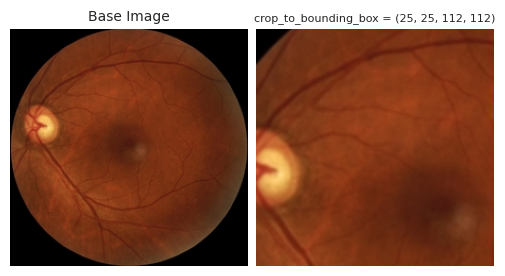

index ke- 1


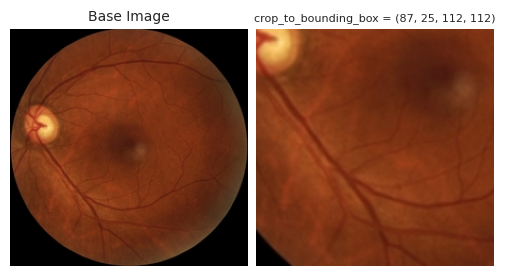

index ke- 2


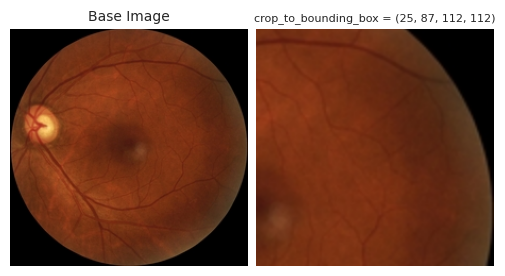

index ke- 3


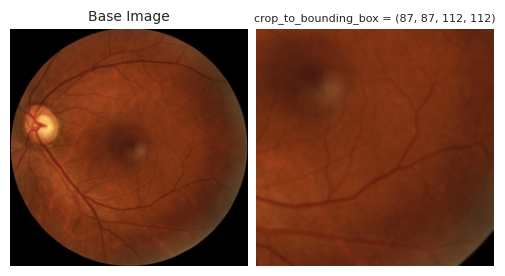

index ke- 4


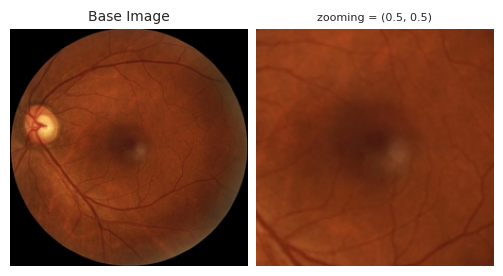

index ke- 5


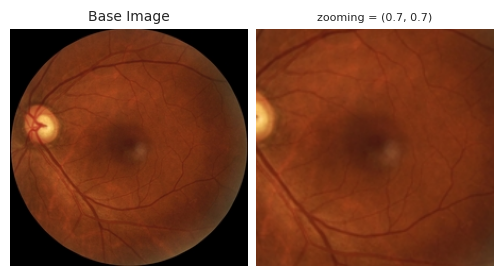

index ke- 6


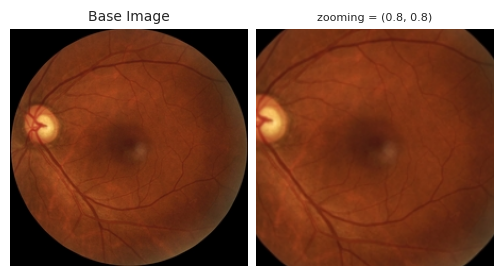

index ke- 7


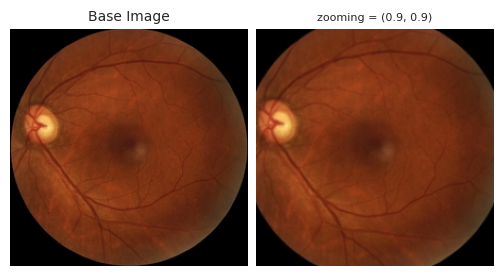

index ke- 8


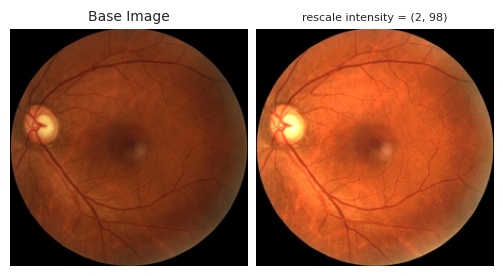

index ke- 9


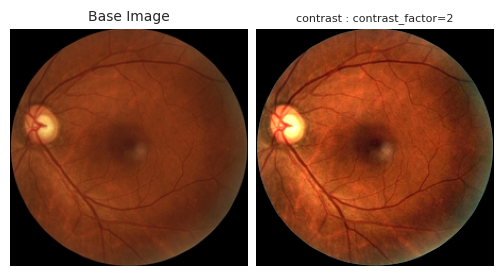

index ke- 10


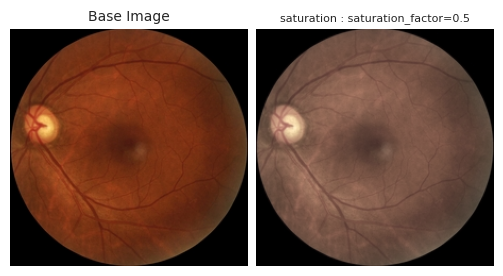

index ke- 11


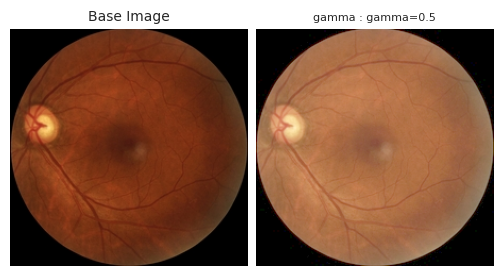

index ke- 12


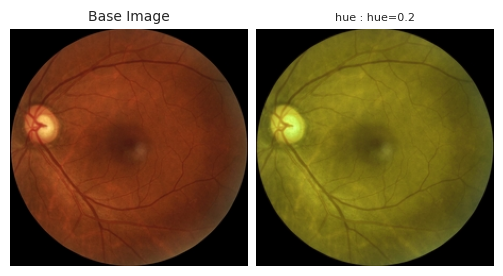

index ke- 13


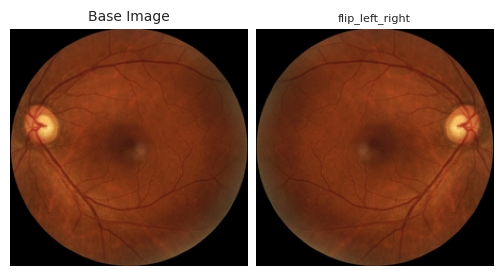

index ke- 14


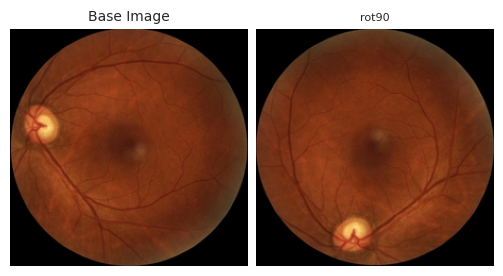

index ke- 15


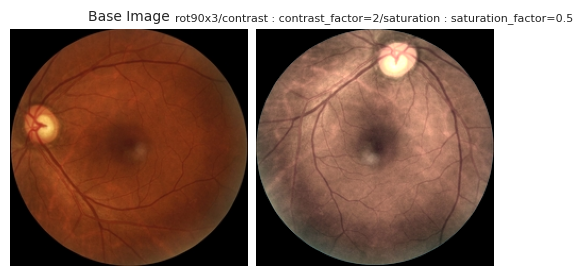

index ke- 16


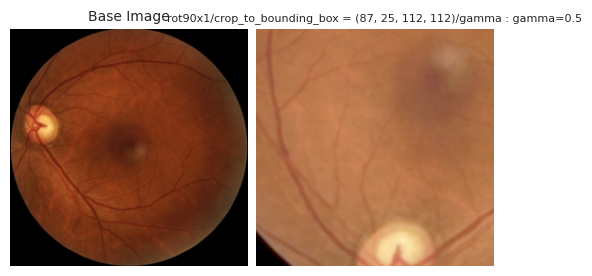

index ke- 17


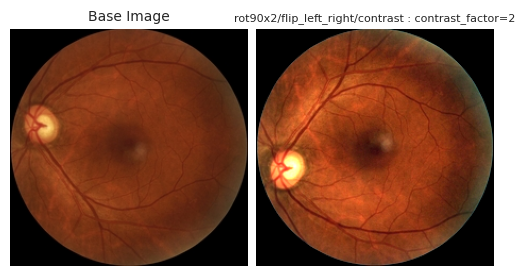

index ke- 18


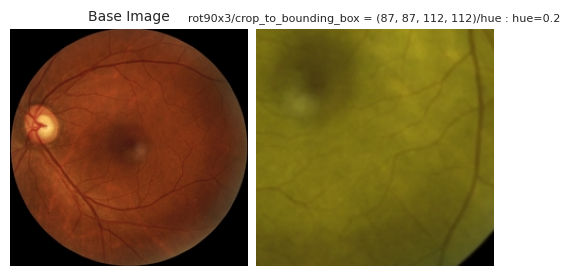

index ke- 19


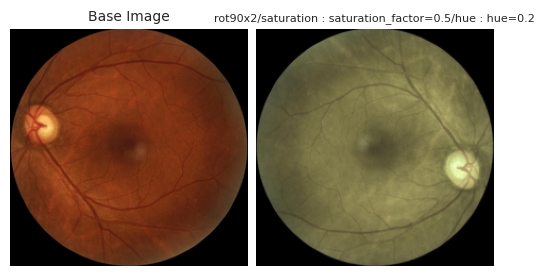

index ke- 20


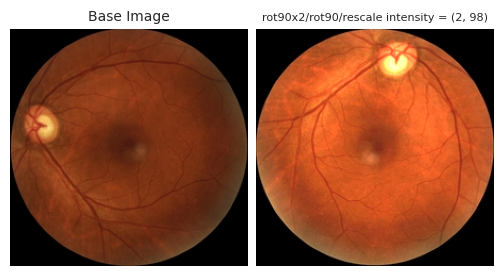

index ke- 21


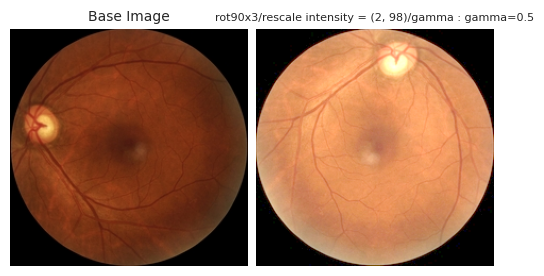

index ke- 22


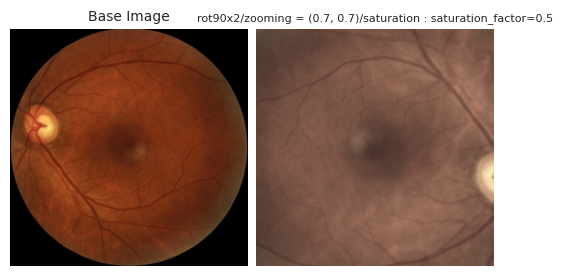

index ke- 23


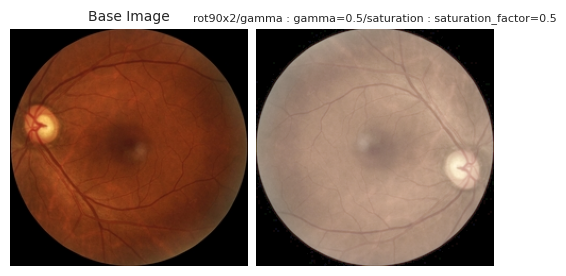

index ke- 24


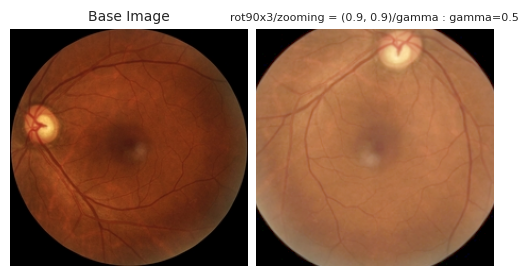

index ke- 25


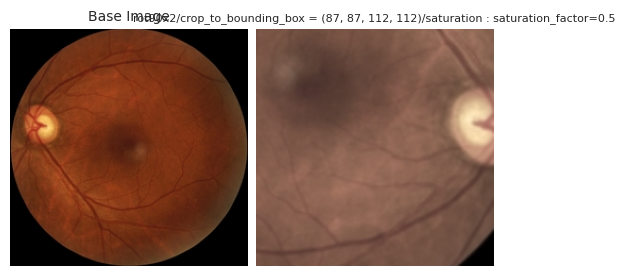

index ke- 26


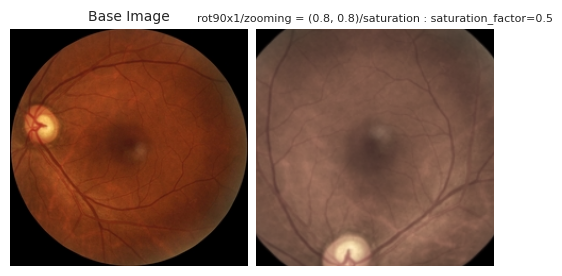

index ke- 27


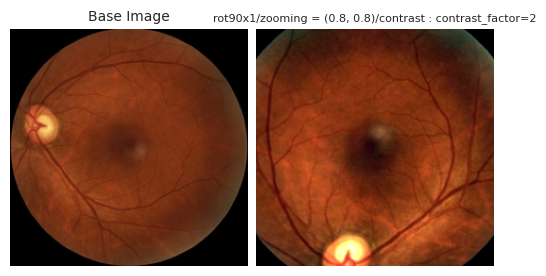

index ke- 28


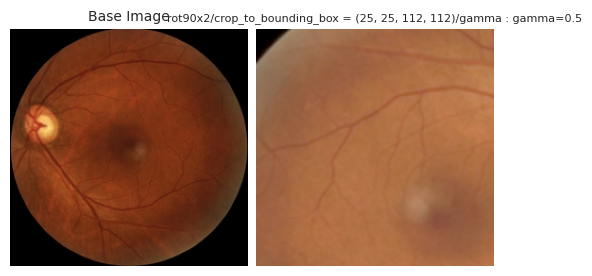

index ke- 29


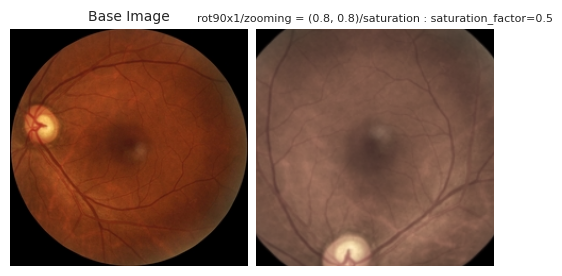

In [ ]:
class ImageAugmentationDisplaySample:
    @staticmethod
    def display_images(original_image, fx_images, title, figsize=(5, 3)): # menampilkan gambar berdampingan untuk perbandingan
        if isinstance(fx_images, np.ndarray) and fx_images.ndim == 4:
            for index, fx_image in enumerate(fx_images):
                fig, axes = plt.subplots(1, 2, figsize=figsize)

                axes[0].imshow(original_image)
                axes[0].set_title('Base Image', fontsize=10)
                axes[0].axis("off")
                axes[1].imshow(fx_image)
                axes[1].set_title(title[index], fontsize=8)
                axes[1].axis("off")
                plt.tight_layout(pad=0.5)
                plt.show()
                plt.close(fig)
        else:
            fig, axes = plt.subplots(1, 2, figsize=figsize)

            axes[0].imshow(original_image)
            axes[0].set_title('Base Image', fontsize=10)
            axes[0].axis("off")
            axes[1].imshow(fx_images)
            axes[1].set_title(title, fontsize=8)
            axes[1].axis("off")
            plt.tight_layout(pad=0.5)
            plt.show()
            plt.close(fig)

    @staticmethod
    def display_random_transforms(index_image, left): # mengambil gambar dari direktori, melakukan augmentasi acak, dan menampilkan hasilnya

        fx = ImageFx(IMAGE_SIZE)

        image_name = f'{index_image}_left.jpg' if left else f'{index_image}_right.jpg'
        print('image name to process :', image_name)
        image_path = os.path.join(TRAINING_IMAGE_CROPPED_PATH+ '_' + str(IMAGE_SIZE), image_name)

        # Check if the image file exists
        if not os.path.exists(image_path):
            print(f"Error: Image file not found at: {image_path}")
            return

        cv_image = cv2.imread(image_path)

        # Check if the image was loaded successfully
        if cv_image is None:
            print(f"Error: Could not read image file at: {image_path}")
            return

        cv_image = cv2.cvtColor(cv_image, cv2.COLOR_BGR2RGB)

        for index in range(30):
          print('index ke-', index)
          image, tranform_name = fx.random_tranform(cv_image, index)
          ImageAugmentationDisplaySample.display_images(cv_image, image, title=tranform_name)

start_index = df.index.min()
stop_index = df.index.max()
index = random.randint(start_index, stop_index)

ImageAugmentationDisplaySample.display_random_transforms(index, True)

### DataAugmentationGenerator
---

1. Membaca data dari file CSV.
2. Mengelompokkan gambar berdasarkan kelas penyakit.
3. Menghitung jumlah augmentasi yang dibutuhkan agar dataset seimbang.
4. Melakukan augmentasi pada gambar menggunakan metode transformasi.
5. Menyimpan gambar yang telah diaugmentasi dan memperbarui file CSV dengan data baru.

In [ ]:
import csv
import os
import cv2
import numpy as np
import shutil # Untuk menghapus file dan direktori
from tqdm import tqdm # Untuk menampilkan progress bar saat melakukan iterasi

class DataAugmentationGenerator:

    def __init__(self, image_size, csv_input_path, csv_output_path, image_source_folder, image_destination_folder):
        self.image_size = image_size
        self.csv_output_path = csv_output_path
        self.image_source_folder = image_source_folder
        self.image_destination_folder = image_destination_folder
        self.image_fx = ImageFx(self.image_size)
        self.disease_class_descriptions =  [{'disease_vectors': [], 'class_name': 'Normal',       'label': '0', 'samples_per_image': 0},
                                            {'disease_vectors': [], 'class_name': 'Diabetes',     'label': '1', 'samples_per_image': 0},
                                            {'disease_vectors': [], 'class_name': 'Glaucoma',     'label': '2', 'samples_per_image': 0},
                                            {'disease_vectors': [], 'class_name': 'Cataract',     'label': '3', 'samples_per_image': 0},
                                            {'disease_vectors': [], 'class_name': 'AMD',          'label': '4', 'samples_per_image': 0},
                                            {'disease_vectors': [], 'class_name': 'Hypertension', 'label': '5', 'samples_per_image': 0},
                                            {'disease_vectors': [], 'class_name': 'Myopia',       'label': '6', 'samples_per_image': 0},
                                            {'disease_vectors': [], 'class_name': 'Others',       'label': '7', 'samples_per_image': 0}]
        self.__populate_disease_vectors(csv_input_path)

    def __populate_disease_vectors(self, csv_path): # Metode ini membaca CSV input dan memisahkan gambar ke dalam beberapa kategori penyakit

        normal_vec = []
        amd_vec = []
        cataract_vec = []
        diabetes_vec = []
        glaucoma_vec = []
        hypertension_vec = []
        myopia_vec = []
        others_vec = []
        label_vec = []
        with open(csv_path) as csvfile:
            csv_reader = csv.reader(csvfile)
            for row in csv_reader:
                column_id = row[0]
                normal = row[1]
                diabetes = row[2]
                glaucoma = row[3]
                cataract = row[4]
                amd = row[5]
                hypertension = row[6]
                myopia = row[7]
                others = row[8]

                if column_id != "ID":
                    if normal == '1':
                      normal_vec.append([column_id, normal, diabetes, glaucoma, cataract, amd, hypertension, myopia, others])
                    if diabetes == '1':
                      diabetes_vec.append([column_id, normal, diabetes, glaucoma, cataract, amd, hypertension, myopia, others])
                    if glaucoma == '1':
                      glaucoma_vec.append([column_id, normal, diabetes, glaucoma, cataract, amd, hypertension, myopia, others])
                    if cataract == '1':
                      cataract_vec.append([column_id, normal, diabetes, glaucoma, cataract, amd, hypertension, myopia, others])
                    if amd == '1':
                      amd_vec.append([column_id, normal, diabetes, glaucoma, cataract, amd, hypertension, myopia, others])
                    if hypertension == '1':
                      hypertension_vec.append([column_id, normal, diabetes, glaucoma, cataract, amd, hypertension, myopia, others])
                    if myopia == '1':
                      myopia_vec.append([column_id, normal, diabetes, glaucoma, cataract, amd, hypertension, myopia, others])
                    if others == '1':
                      others_vec.append([column_id, normal, diabetes, glaucoma, cataract, amd, hypertension, myopia, others])
                    if len(row) > 9:
                      label_vec.append(str(row[9]))

        for v in self.disease_class_descriptions:
            if v['class_name'].lower() == 'normal':
              v['disease_vectors'] = normal_vec
            elif v['class_name'].lower() == 'amd':
              v['disease_vectors'] = amd_vec
            elif v['class_name'].lower() == 'diabetes':
              v['disease_vectors'] = diabetes_vec
            elif v['class_name'].lower() == 'cataract':
              v['disease_vectors'] = cataract_vec
            elif v['class_name'].lower() == 'glaucoma':
              v['disease_vectors'] = glaucoma_vec
            elif v['class_name'].lower() == 'hypertension':
              v['disease_vectors'] = hypertension_vec
            elif v['class_name'].lower() == 'myopia':
              v['disease_vectors'] = myopia_vec
            elif v['class_name'].lower() == 'others':
              v['disease_vectors'] = others_vec

        self.disease_class_descriptions.sort(key=lambda k: len(k['disease_vectors']))
        for index, _ in enumerate(self.disease_class_descriptions):
            max_len = len(self.disease_class_descriptions[-1]['disease_vectors'])
            current_len = len(self.disease_class_descriptions[index]['disease_vectors'])
            sample_per_image = np.floor((float(max_len - current_len)/float(current_len)))
            self.disease_class_descriptions[index]['samples_per_image'] = int(sample_per_image)

    def dump_disease_class_descriptions(self): # Metode ini mencetak ringkasan kelas penyakit dan jumlah gambar di setiap kelas.
        print('order by count size ASC')
        for v in self.disease_class_descriptions:
          DataAugmentationGenerator.print_disease_class_descriptions(v)


    @staticmethod
    def print_disease_class_descriptions(disease_class_description): # mencetak rincian kelas penyakit tertentu, termasuk namanya, label, jumlah gambar asli, dan jumlah gambar tambahan yang akan dihasilkan.
      v = disease_class_description
      print(f'{v["class_name"]} -> fundus count : {len(v["disease_vectors"])}, Augmentation/image : {v["samples_per_image"]}, total images : {(v["samples_per_image"]+1)*len(v["disease_vectors"]) if v["samples_per_image"] != 0 else len(v["disease_vectors"])}')

    def __save_image(self, image, image_name, suffix): # Metode ini menyimpan gambar hasil augmentasi ke dalam folder tujuan.
        image_to_save = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image_file = image_name + '_' + str(suffix)+'.jpg'
        image_file_path = os.path.join(self.image_destination_folder, image_file)
        exists = os.path.isfile(image_file_path)
        if exists:
            print("duplicate file found: " + image_file_path)
        status = cv2.imwrite(image_file_path, image_to_save)

        return image_file

    def __write_header(self): # # menulis baris header ke file CSV. Header berisi nama kolom seperti 'ID', 'Normal', 'Diabetes', dll., yang mewakili informasi dan label gambar
        with open(self.csv_output_path , 'w', newline='') as csvfile:
            file_writer = csv.writer(csvfile, delimiter=',', quotechar='|', quoting=csv.QUOTE_MINIMAL)
            file_writer.writerow(['ID', 'Normal', 'Diabetes', 'Glaucoma', 'Cataract', 'AMD', 'Hypertension',
                                  'Myopia', 'Others', 'Label'])
            return file_writer

    # inti dari proses augmentasi.
    # Membaca gambar asli dari image_source_folder. -> Melakukan transformasi acak pada gambar menggunakan self.image_fx.random_tranform(). -> Menyimpan gambar yang sudah diaugmentasi. -> Menulis informasi gambar baru ke file CSV output.
    def __generate_images(self, image_file_name, samples_number, disease_vector, label, suffix):
        image_base_name = image_file_name[0:-4]
        fundus_image = os.path.join(self.image_source_folder, image_file_name)
        image = cv2.imread(fundus_image)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        original_image = image
        total_image = 0
        with open(self.csv_output_path, 'a', newline='') as csvfile:
            file_writer = csv.writer(csvfile, delimiter=',', quotechar='|', quoting=csv.QUOTE_MINIMAL)
            for index in range(samples_number):
                augmented, _ = self.image_fx.random_tranform(image, index)
                if augmented is not None:
                    suffix_file = suffix +  '_' + str(index)
                    image_file_name = self.__save_image(augmented, image_base_name, suffix_file)
                    if image_file_name is not None:
                        file_writer.writerow([image_file_name, disease_vector[0], disease_vector[1], disease_vector[2], disease_vector[3],
                                   disease_vector[4], disease_vector[5], disease_vector[6], disease_vector[7], str(label)])
                        total_image = total_image + 1
        return total_image

    def __random_generate_images(self, disease_class_description, index_description): # mengulangi gambar kelas penyakit tertentu dan menghasilkan jumlah penambahan yang ditentukan untuk setiap gambar.

        images_to_process = disease_class_description['disease_vectors']
        samples_per_image = disease_class_description['samples_per_image']
        class_name = disease_class_description['class_name']
        label = disease_class_description['label']
        total_augmented_images = 0

        for image_index in tqdm(range(len(images_to_process))):
          disease_vector = images_to_process[image_index]
          image_file_name = disease_vector[0]
          suffix = str(label) + '_' + str(index_description) + '_' + str(image_index)
          total_images = self.__generate_images(image_file_name, samples_per_image, disease_vector[1:], label, suffix)
          total_augmented_images = total_augmented_images + total_images

        return total_augmented_images


    def clear_previous(self): # Metode ini menghapus file CSV keluaran sebelumnya dan folder tujuan untuk gambar yang diaugmentasi agar dapat memulai dari awal.
        if os.path.isfile(self.csv_output_path):
            os.remove(self.csv_output_path)
        if os.path.exists(self.image_destination_folder):
            shutil.rmtree(self.image_destination_folder, ignore_errors=True)

    def generate_augmentations(self):
      self.clear_previous()
      if not os.path.exists(self.image_destination_folder):
          os.mkdir(self.image_destination_folder)
      self.__write_header()
      image_count = 0
      for index_description, _ in enumerate(self.disease_class_descriptions):
        print(f"step {index_description+1}/{len(self.disease_class_descriptions)}")
        disease_class_description = self.disease_class_descriptions[index_description]
        count =  self.__random_generate_images(disease_class_description, index_description)
        image_count = image_count + count
      return image_count

    @staticmethod
    def run(): # Menjalankan augmentasi untuk semua gambar dalam dataset.
      csv_path = os.path.join(CSV_OUTPUT_PATH, 'odir.csv')
      csv_augmente = os.path.join(CSV_OUTPUT_PATH, 'odir_augmentation.csv')
      source_folder = TRAINING_IMAGE_CROPPED_PATH + '_' + str(IMAGE_SIZE)
      destination_folder = TRAINING_IMAGE_AUGMENTED_PATH + '_' + str(IMAGE_SIZE)
      data_aug_den = DataAugmentationGenerator(IMAGE_SIZE, csv_path, csv_augmente, source_folder, destination_folder)
      count = data_aug_den.generate_augmentations()
      print('Augmented image count :', count)

    @staticmethod
    def run_for_unique_class(run_augmentation=False): # Menjalankan augmentasi hanya untuk gambar dengan satu diagnosis unik
      csv_path = os.path.join(CSV_OUTPUT_PATH, 'odir_classes.csv')
      csv_augmente = os.path.join(CSV_OUTPUT_PATH, 'odir_unique_class_augmentation.csv')
      source_folder = TRAINING_IMAGE_CROPPED_PATH + '_' + str(IMAGE_SIZE)
      destination_folder = TRAINING_IMAGE_UNIQUE_CLASS_AUGMENTED_PATH + '_' + str(IMAGE_SIZE)
      data_aug_den = DataAugmentationGenerator(IMAGE_SIZE, csv_path, csv_augmente, source_folder, destination_folder)
      data_aug_den.dump_disease_class_descriptions()
      if run_augmentation:
        count = data_aug_den.generate_augmentations()
        print('\nAugmented image count :', count)
      return data_aug_den

    @staticmethod
    def create_for_unique_class(): # Mengembalikan objek DataAugmentationGenerator yang dikonfigurasi untuk dataset dengan diagnosis unik.
      csv_path = os.path.join(CSV_OUTPUT_PATH, 'odir_classes.csv')
      csv_augmente = os.path.join(CSV_OUTPUT_PATH, 'odir_unique_class_augmentation.csv')
      source_folder = TRAINING_IMAGE_CROPPED_PATH + '_' + str(IMAGE_SIZE)
      destination_folder = TRAINING_IMAGE_UNIQUE_CLASS_AUGMENTED_PATH + '_' + str(IMAGE_SIZE)
      data_aug_den = DataAugmentationGenerator(IMAGE_SIZE, csv_path, csv_augmente, source_folder, destination_folder)
      return data_aug_den

# data_aug_den = DataAugmentationGenerator.run_for_unique_class(True)

#  Data Loading

## Odirdataframe

---

1. Membaca dan menggabungkan dataset (asli & augmentasi).
2. Menambahkan label (multiclass).
3. Sampling dataset untuk mengurangi ukuran.
4. Membagi dataset menjadi train, validasi, dan test.
5. Membuat dataframe dalam format multiclass augmentasi dan non-augmentasi.

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Kelas ini bertanggung jawab untuk membaca data dari file CSV, memproses label penyakit mata, serta membagi data menjadi subset yang lebih kecil.
class OdirDataframe:

  def __init__(self, csv_folder, train_image_folder, train_augmented_image_folder, odir_csv, odir_augmented_csv, class_mode):
    self.class_mode = class_mode
    self.all_df = self._load_dataframe(csv_folder, train_image_folder, train_augmented_image_folder, odir_csv, odir_augmented_csv)
    if self.class_mode == 'multiclass':
      self.all_df['Label'] = self.all_df['Label'].astype('str')

  # Membaca file CSV yang diberikan. -> Menambahkan path lengkap ke gambar berdasarkan folder gambar. -> Menggabungkan dataset asli dan dataset augmentasi menjadi satu DataFrame.
  def _load_dataframe(self, csv_folder, train_image_folder, train_augmented_image_folder, odir_csv, odir_augmented_csv):

    odir_csv_path = None

    if odir_csv is not None: # Membaca dataset dari CSV
      odir_csv_path = os.path.join(csv_folder, odir_csv)

    odir_augmented_csv_path = None
    if odir_augmented_csv is not None:
      odir_augmented_csv_path = os.path.join(csv_folder, odir_augmented_csv)

    odir_dataset = None
    if odir_csv_path is not None:
      odir_dataset = pd.read_csv(odir_csv_path)

    odir_augmented_dataset = None
    if odir_augmented_csv_path is not None:
      odir_augmented_dataset = pd.read_csv(odir_augmented_csv_path)

    if train_image_folder is not None and odir_dataset is not None: # Menambahkan path lengkap ke gambar dalam DataFrame
      odir_dataset['ID'] = odir_dataset['ID'].apply(lambda image_name: os.path.join(train_image_folder, image_name))

    if train_augmented_image_folder is not None and odir_augmented_dataset is not None:
      odir_augmented_dataset['ID'] = odir_augmented_dataset['ID'].apply(lambda image_name: os.path.join(train_augmented_image_folder, image_name))

    odir_concat_df = None
    if odir_dataset is not None and odir_augmented_dataset is not None: # Menggabungkan dataset asli dan augmentasi
      odir_concat_df = pd.concat([odir_dataset, odir_augmented_dataset])
    elif odir_dataset is not None:
      odir_concat_df = odir_dataset
    elif odir_augmented_dataset is not None:
      odir_concat_df = odir_augmented_dataset

    if odir_concat_df is None:
      print('Attention no dataset to process')

    return odir_concat_df


  # def sample(self, sample=100): # buat sampel dataset yang lebih kecil, yang dapat berguna untuk pengujian
  #   df_disease_sample = None
  #   if self.class_mode == 'multiclass':
  #     df_sample = None
  #     for cl in range(len(DISEASE_CLASSES)):
  #       label = str(cl)
  #       df_c = self.all_df[self.all_df['Label'] == label].sample(sample)
  #       if df_sample is None:
  #         df_sample = df_c
  #       else:
  #         df_sample = pd.concat([df_sample, df_c])
  #     df_disease_sample = df_sample

  #   return df_disease_sample
  def sample(self, sample=100):
    df_sample = None
    labels_exist = self.all_df['Label'].unique()

    for label in labels_exist:
        df_c = self.all_df[self.all_df['Label'] == label]
        n = min(sample, len(df_c))  # Jika data tidak cukup
        df_c = df_c.sample(n)

        if df_sample is None:
            df_sample = df_c
        else:
            df_sample = pd.concat([df_sample, df_c])

    return df_sample


  def train_valid_test_split(self, sample=None, valid_size=0.20, test_size=0.10, random_state=42): # Membagi dataset menjadi training (latih), validation (validasi), dan testing (uji).
    df_c = None
    if sample is not None:
      df_c = self.sample(sample)
    else:
      df_c = self.all_df


    train, test = train_test_split(df_c, test_size=test_size, random_state=random_state, shuffle=True, stratify=df_c['Label'])
    train, valid = train_test_split(train, test_size=valid_size, random_state=random_state, shuffle=True, stratify=train['Label'])


    return train, valid, test


  @staticmethod
  # Membuat instance OdirDataframe multiclass augmented.
  def create_multiclass_dataframe(csv_folder=CSV_OUTPUT_PATH,
                       train_image_folder=TRAINING_IMAGE_CROPPED_PATH + '_' + str(IMAGE_SIZE),
                       train_augmented_image_folder = TRAINING_IMAGE_UNIQUE_CLASS_AUGMENTED_PATH + '_' + str(IMAGE_SIZE),
                       odir_csv='odir_singlelabel.csv', odir_augmented_csv='odir_unique_class_augmentation.csv'):
    odir_df = OdirDataframe(csv_folder, train_image_folder, train_augmented_image_folder, odir_csv, odir_augmented_csv, class_mode='multiclass')
    return odir_df

  @staticmethod
  # Membuat instance OdirDataframe multiclass.
  def create_multiclass_dataframe_(csv_folder=CSV_OUTPUT_PATH,
                       train_image_folder=TRAINING_IMAGE_CROPPED_PATH + '_' + str(IMAGE_SIZE), odir_csv='odir_singlelabel.csv'):
    odir_df = OdirDataframe(csv_folder, train_image_folder, None, odir_csv, None, class_mode='multiclass')
    return odir_df

## OdirDataGenerator

---


1. Membuat generator data untuk training, validasi, dan testing.
2. Mendukung augmentasi gambar untuk meningkatkan performa model.
3. Memudahkan visualisasi dataset dengan metode visualize.

In [ ]:
import tensorflow as tf
from tensorflow import keras
import warnings
import os
from keras._tf_keras.keras.preprocessing.image import ImageDataGenerator


class OdirDataGenerator:

  """
  Train, validation  generator
  """
  #DISEASE_CLASSES = ['Normal', 'Diabetes', 'Glaucoma', 'Cataract', 'AMD', 'Hypertension', 'Myopia', 'Others']
  def __init__(self, train_df, valid_df, test_df, class_mode, batch_size, data_augmentation=False, image_size=(IMAGE_WIDTH, IMAGE_HEIGHT)):

    self.image_size = image_size
    self.batch_size = batch_size
    self.train_df = train_df
    self.valid_df = valid_df
    self.test_df = test_df
    self.class_mode = class_mode
    gen_class_mode = ''


    if class_mode != 'multiclass':
        raise ValueError(f'Invalid class_mode {class_mode}: Only multiclass is supported')

    gen_class_mode = 'sparse'  # Hanya mendukung multiclass

    train_datagen = None
    valid_datagen = None
    subset_training=None
    subset_validation=None
    classes = DISEASE_CLASSES

    validation_split = 0.0
    if valid_df is None:
      validation_split = 0.20
      subset_training="training"
      subset_validation="validation"


    # Membuat Generator Data untuk Training, Validasi
    if data_augmentation: # image transformation untuk Training
       train_datagen = ImageDataGenerator(
                            rotation_range=15,
                            width_shift_range=0.15,
                            height_shift_range=0.15,
                            fill_mode='constant',
                            zoom_range=0.2,
                            brightness_range=[0.95, 1.05],
                            horizontal_flip=True,
                            vertical_flip=True,
                            validation_split=validation_split,
                            # preprocessing_function=OdirDataGenerator._preprocess_input_fn
                            )
    else:
      train_datagen = ImageDataGenerator(validation_split=validation_split,
                                        #  preprocessing_function=OdirDataGenerator._preprocess_input_fn
                                         )

    if valid_df is not None:
      valid_datagen = ImageDataGenerator(
          # preprocessing_function=OdirDataGenerator._preprocess_input_fn
          )
    else:
      valid_datagen = train_datagen

    test_datagen = ImageDataGenerator(
        # preprocessing_function=OdirDataGenerator._preprocess_input_fn
        )

    y_col = 'Label'

    # Train generator
    self.train_generator = train_datagen.flow_from_dataframe(dataframe=train_df,
                                                              directory=None,
                                                              x_col="ID",
                                                              y_col=y_col,
                                                              subset=subset_training,
                                                              batch_size=batch_size,
                                                              seed=42,
                                                              shuffle=True,
                                                              class_mode=gen_class_mode,
                                                              target_size=image_size,
                                                              drop_remainder=False)
    print('Training data generated')
    # Valid generator
    validation_df = train_df
    if valid_df is not None:
      validation_df = valid_df
    self.valid_generator = valid_datagen.flow_from_dataframe(dataframe=validation_df,
                                                              directory=None,
                                                              x_col="ID",
                                                              y_col=y_col,
                                                              subset=subset_validation,
                                                              batch_size=batch_size,
                                                              seed=42,
                                                              shuffle=False,
                                                              class_mode=gen_class_mode,
                                                              target_size=image_size)
    print('Validation data generated')
    # test generator
    self.test_generator = test_datagen.flow_from_dataframe(dataframe=test_df,
                                                           directory=None,
                                                           x_col="ID",
                                                           y_col=y_col,
                                                           batch_size=batch_size,
                                                           seed=42,
                                                           shuffle=False,
                                                           class_mode=gen_class_mode,
                                                           target_size=image_size)
    print('Test data generated')

  @classmethod
  # Metode ini membuat objek OdirDataGenerator langsung dari dataset ODIR, membagi dataset menjadi train, valid, dan test.
  def from_odir_dataframe(cls, odir_dataframe, batch_size, sample=None, data_augmentation=True, image_size=(IMAGE_WIDTH, IMAGE_HEIGHT)):
    train_df, valid_df, test_df = odir_dataframe.train_valid_test_split(sample=sample)
    return cls(train_df=train_df, valid_df=valid_df, test_df=test_df, class_mode=odir_dataframe.class_mode, data_augmentation=data_augmentation, image_size=image_size, batch_size=batch_size)

  @staticmethod
  def _preprocess_input_fn(img):
    # img = tf.keras.applications.vgg16.preprocess_input(img) # jika model Vgg16
    # img = tf.keras.applications.resnet50.preprocess_input(img) # jika model Resnet50 Original
    return img

  @staticmethod
  def preprocess_input(img):
    return OdirDataGenerator._preprocess_input_fn(img)

  # mengambil nama label untuk label yang diberikan.
  def _get_label_name(self, label, class_names):
    return OdirDataGenerator.get_class_name(label, self.class_mode, class_names)

  @staticmethod
  # mendapatkan nama kelas dari label, dengan mempertimbangkan class_mode.
  def get_class_name(label, class_mode='multiclass', class_names=DISEASE_CLASSES):
      return class_names[int(label)]

  # menyiapkan gambar untuk visualisasi dengan membalikkan praproses apa pun yang diterapkan.
  @staticmethod
  def prepare_image_for_viz(img):
    # img = np.copy(img).astype(np.float32)
    # # # ------------VGG16/Resnet50--------------------
    # # Tambah kembali nilai mean untuk BGR
    # img[..., 0] += 103.939  # B
    # img[..., 1] += 116.779  # G
    # img[..., 2] += 123.68   # R

    # # Balik channel dari BGR ke RGB (karena VGG16 pakai BGR)
    # img = img[..., ::-1]  # BGR -> RGB

    return np.clip(img, 0, 255).astype(np.uint8)

  def visualize(self, data_test=False):
      '''
      Visualize a sample of generated data
      '''
      plt.figure(figsize=(10, 10))
      title = "Training Dataset" if not data_test else "Testing Dataset"
      plt.suptitle(title, fontsize=16)
      generator = self.test_generator if data_test else self.train_generator

      images, labels = next(generator)

      for i in range(9):
          ax = plt.subplot(3, 3, i + 1)

          img = OdirDataGenerator.prepare_image_for_viz(images[i])
          plt.imshow(img.astype('uint8'))

          label_name = DISEASE_CLASSES[int(labels[i])]
          plt.title(label_name)
          plt.axis("off")

      plt.show()
      plt.close()

# Annotation preprocessing & visualization

In [ ]:
odir_classes_df = pd.read_csv(CSV_OUTPUT_PATH+'/odir_singlelabel.csv')
odir_classes_df['Label'] = odir_classes_df['Label'].astype(int)
odir_classes_df.head()

,ID,Normal,Diabetes,Glaucoma,Cataract,AMD,Hypertension,Myopia,Others,Label
0,0_left.jpg,0,0,0,1,0,0,0,0,3
1,0_right.jpg,1,0,0,0,0,0,0,0,0
2,1_left.jpg,1,0,0,0,0,0,0,0,0
3,1_right.jpg,1,0,0,0,0,0,0,0,0
4,2_right.jpg,0,1,0,0,0,0,0,0,1


In [ ]:
odir_df_augmented = OdirDataframe.create_multiclass_dataframe()
odir_df_augmented.all_df['Label'] = odir_df_augmented.all_df['Label'].astype(int)
odir_df_augmented.all_df

,ID,Normal,Diabetes,Glaucoma,Cataract,AMD,Hypertension,Myopia,Others,Label
0,/content/drive/MyDrive/SKRIPSI/PROJECT//Traini...,0,0,0,1,0,0,0,0,3
1,/content/drive/MyDrive/SKRIPSI/PROJECT//Traini...,1,0,0,0,0,0,0,0,0
2,/content/drive/MyDrive/SKRIPSI/PROJECT//Traini...,1,0,0,0,0,0,0,0,0
3,/content/drive/MyDrive/SKRIPSI/PROJECT//Traini...,1,0,0,0,0,0,0,0,0
4,/content/drive/MyDrive/SKRIPSI/PROJECT//Traini...,0,1,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...
15356,/content/drive/MyDrive/SKRIPSI/PROJECT//Traini...,0,1,0,0,0,0,0,0,1
15357,/content/drive/MyDrive/SKRIPSI/PROJECT//Traini...,0,1,0,0,0,0,0,0,1
15358,/content/drive/MyDrive/SKRIPSI/PROJECT//Traini...,0,1,0,0,0,0,0,0,1
15359,/content/drive/MyDrive/SKRIPSI/PROJECT//Traini...,0,1,0,0,0,0,0,0,1


## Display ODIR dataframe


In [ ]:
odir_df_augmented = OdirDataframe.create_multiclass_dataframe()
odir_df = OdirDataframe.create_multiclass_dataframe_()

# Hilangkan kelas label '7' (kelas 'Others')
odir_df_augmented.all_df = odir_df_augmented.all_df[odir_df_augmented.all_df['Label'] != '7']

df_sample = odir_df_augmented.all_df
df_sample['Label'].value_counts().sort_index()
# df_sample.head()

,count
Label,
0,2816
1,2778
2,2616
3,2750
4,2607
5,2808
6,2607


In [ ]:
df_sample = odir_df.all_df
df_sample['Label'].value_counts()
# df_sample.head()

,count
Label,
0,2816
1,1389
7,815
3,250
6,237
4,237
2,218
5,104


In [ ]:
df_sample = odir_df.sample(100)
df_sample['Label'].value_counts()
# df_sample.head()

,count
Label,
0,100
1,100
2,100
3,100
4,100
5,100
6,100
7,100


## Visualize

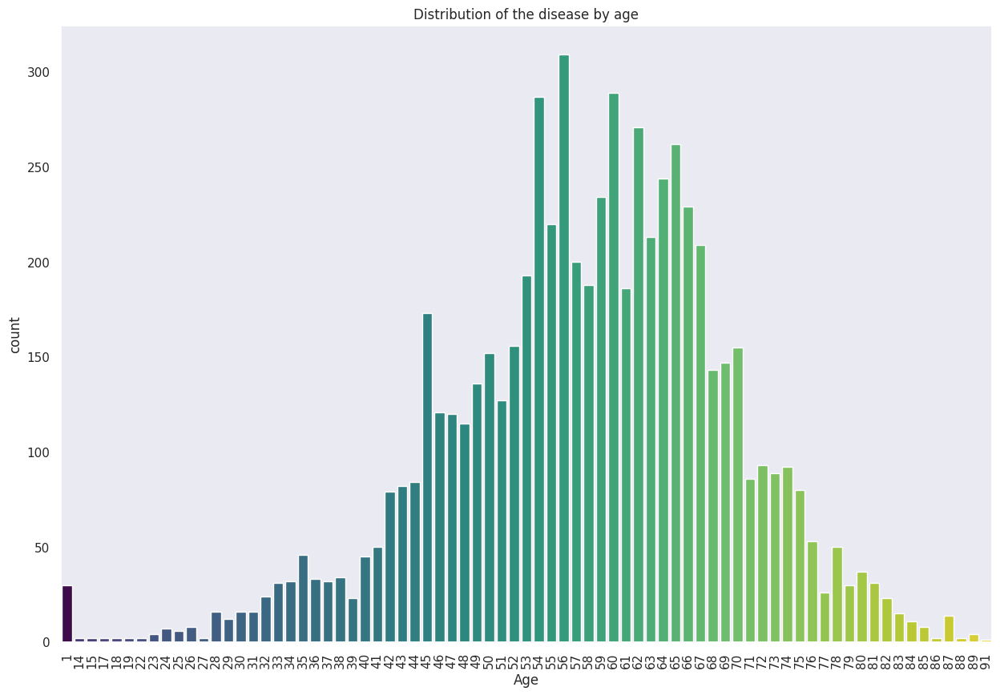

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from seaborn import axes_style

# Membaca dataset
odir__df = pd.read_csv(CSV_OUTPUT_PATH+'/odir_full.csv')

# Membuat count plot
with axes_style({'axes.grid': False}):
    fig, ax = plt.subplots(1, 1, figsize=(15, 10))

    # Perbaikan: Tambahkan hue='Age' dan legend=False
    sns.countplot(ax=ax, x='Age', data=odir__df, hue='Age', palette="viridis", legend=False)

    plt.xticks(rotation=90)
    ax.set_title('Distribution of the disease by age')

plt.show()


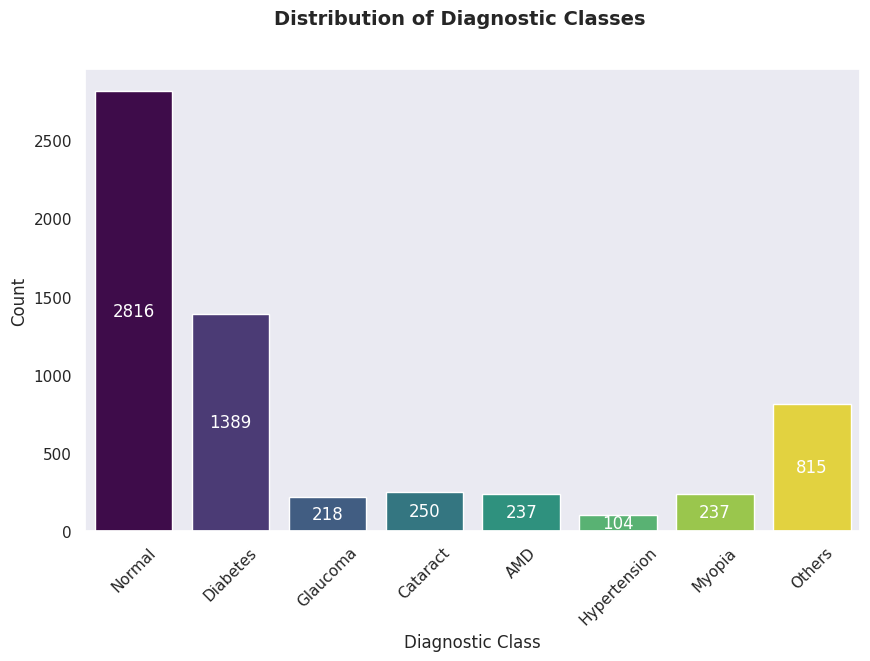

------------------------------------------------------------------------------------------------------------------


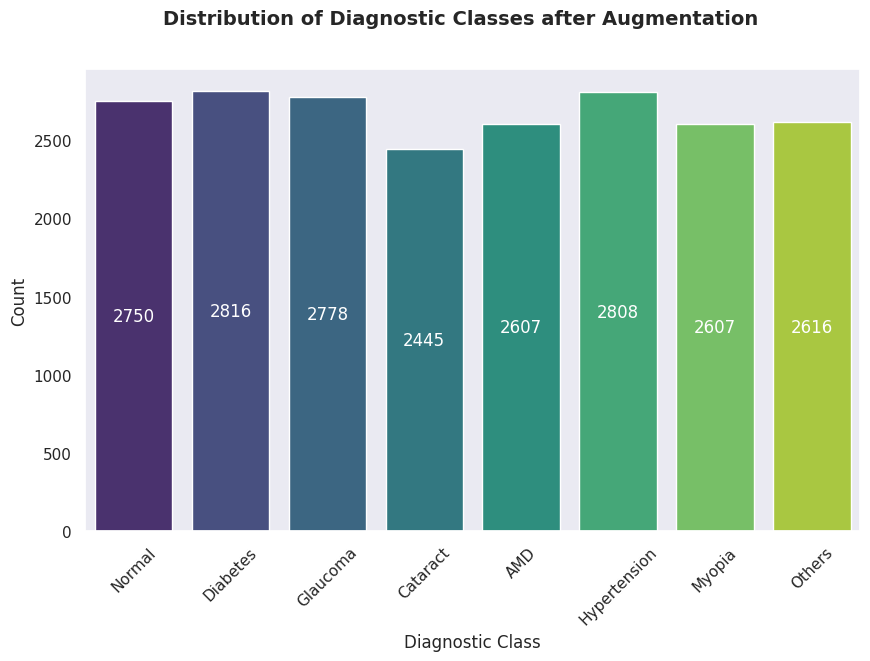

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from seaborn import axes_style

def count_plot(df, title):
    with axes_style({'axes.grid': False}):
        plt.figure(figsize=(10, 6))
        plt.suptitle(title, fontsize=14, fontweight='bold')

        # Membuat countplot
        ax = sns.countplot(x='Label', data=df, hue='Label', palette="viridis", legend=False)
        ax.set_xticks(range(len(DISEASE_CLASSES)))
        ax.set_xticklabels(DISEASE_CLASSES, rotation=45)
        ax.set_xlabel("Diagnostic Class", fontsize=12)
        ax.set_ylabel("Count", fontsize=12)

        # Menambahkan angka DI DALAM batang
        for p in ax.patches:
            ax.annotate(f'{int(p.get_height())}',  # Teks angka
                        (p.get_x() + p.get_width() / 2., p.get_height() * 0.5),  # Posisi dalam batang
                        ha='center', va='center', fontsize=12, color='white')

    plt.show()

# Sebelum augmentasi
count_plot(odir_classes_df, 'Distribution of Diagnostic Classes')
print('------------------------------------------------------------------------------------------------------------------')

# Setelah augmentasi
count_plot(odir_df_augmented.all_df, 'Distribution of Diagnostic Classes after Augmentation')

# Modeling Architecture

## Model based on VGG16


In [ ]:
from tensorflow import keras
from keras import backend as K
from keras.api.regularizers import l2
from keras.api.layers import GlobalAveragePooling2D, Dense, BatchNormalization, Activation, Dropout
import math
import os
import datetime

class VGG16Model:
    """
    Create and fit the model using VGG16 architecture
    """

    def __init__(self, data_generator, class_mode, name=''):
        self.data_generator = data_generator # An object that likely provides the training and validation data for the model
        self.num_classes = 8 # The number of classes the model needs to predict
        self.name = name # An optional string to give the model a specific name
        self.class_mode = class_mode # A string indicating the type of classification
        if self.class_mode != 'multiclass':
            raise Exception(f'Invalid input class_mode {class_mode}. Only multiclass is supported')
        self.input_shape = (self.data_generator.image_size[0], self.data_generator.image_size[1], 3)
        self.base_model, self.base_model_name = self._create_base_model(self.input_shape)
        self.model_last_path = ''

    # This method creates the base VGG16 model using pre-trained weights from ImageNet.
    def _create_base_model(self, input_shape):
        model = keras.applications.VGG16(
            weights='imagenet',
            # weights= None,
            include_top=False,
            input_shape=input_shape
        )
        model.trainable = False
        return model, 'VGG16'

    def create_model(self):
        base = self.base_model
        x = base.output
        x = keras.layers.GlobalAveragePooling2D()(x)
        x = keras.layers.BatchNormalization()(x)

        x = keras.layers.Dense(1024, activation='relu', kernel_regularizer=l2(5e-5))(x)
        x = keras.layers.BatchNormalization()(x)
        x = keras.layers.Dropout(0.4)(x)

        x = keras.layers.Dense(512, activation='relu', kernel_regularizer=l2(5e-5))(x)
        x = keras.layers.BatchNormalization()(x)
        x = keras.layers.Dropout(0.4)(x)

        activation = 'softmax'
        predictions = keras.layers.Dense(self.num_classes, activation=activation)(x)
        model = keras.Model(inputs=base.input, outputs=predictions)

        return model


    def setup_model(self, model, opt='adamW', layer_trainable_index=-1):
        if layer_trainable_index >= 0:
            for layer in model.layers[:layer_trainable_index]:
                layer.trainable = False
            for layer in model.layers[layer_trainable_index:]:
                layer.trainable = True

        loss = 'sparse_categorical_crossentropy'
        optimizer = keras.optimizers.AdamW(learning_rate=5e-5)

        model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])
        return model

    @staticmethod
    def load_model(model_keras_name):
        """
        Load a saved model from file.
        """
        keras_path = os.path.join(MODEL_OUTPUT_VGG_PATH, model_keras_name)
        model = keras.models.load_model(keras_path)
        return model


    def train(self, model, epochs):
        """
        Train the model using training and validation data generators.
        """
        checkpointer = keras.callbacks.ModelCheckpoint(
            filepath=os.path.join(MODEL_OUTPUT_VGG_PATH, 'vgg16_model_checkpoint_{epoch}.keras'),
            monitor='val_loss',
            save_best_only=True,
            save_weights_only=False,
            mode='min',
            verbose=1,
            save_freq='epoch'
        )

        early_stopping = keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=100,
            restore_best_weights=True
        )

        reduce_lr = keras.callbacks.ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=5,
            min_lr=1e-6,
            verbose=1
        )

        # ✅ Tambahkan semua callbacks ke dalam list
        callbacks = [checkpointer, early_stopping, reduce_lr]

        train_generator = self.data_generator.train_generator
        valid_generator = self.data_generator.valid_generator
        step_size_train = math.ceil(train_generator.n / train_generator.batch_size)
        step_size_valid = math.ceil(valid_generator.n / valid_generator.batch_size)

        training_history = model.fit(
            train_generator,
            steps_per_epoch=step_size_train,
            validation_data=valid_generator,
            validation_steps=step_size_valid,
            epochs=epochs,
            callbacks=callbacks  # ✅ Gunakan semua callbacks di sini
        )


        self.model_last_path = f'model_weights_{self.base_model_name}_{datetime.date.today()}_{self.name}.keras'

        model_save_path = os.path.join(MODEL_OUTPUT_VGG_PATH, self.model_last_path)
        print('Saving model at:', model_save_path)
        model.save(model_save_path)  # ✅ Simpan model setelah training selesai

        return training_history

    @staticmethod
    def summary(model):
        model.summary()

    @staticmethod
    def plot_model(to_file, model):
        keras.utils.plot_model(model, to_file, show_shapes=True, show_layer_names=True)

    @staticmethod
    def instanciate_and_setup_model(data_generator, class_mode, name, layer_trainable_index=-1, summary_model=True, print_model=True, clear_session=True):

        """
        Instanciate and setup the model.
        """
        if clear_session:
            K.clear_session()
        vgg_model = VGG16Model(data_generator, class_mode, name)
        model = vgg_model.create_model()
        vgg_model.setup_model(model, layer_trainable_index=layer_trainable_index)
        if summary_model:
            vgg_model.summary(model)
        if print_model:
            sub_model1 = keras.Model(inputs=model.input, outputs=model.layers[18].output)
            keras.utils.plot_model(
                sub_model1,
                to_file=os.path.join(MODEL_OUTPUT_VGG_PATH, "ODIR_model_vgg16(1).png"),
                show_shapes=True, show_layer_names=True, expand_nested=True, rankdir="TB", dpi=1000)

            sub_model2 = keras.Model(inputs=model.layers[19].input, outputs=model.output)
            keras.utils.plot_model(
                sub_model2,
                to_file=os.path.join(MODEL_OUTPUT_VGG_PATH, "ODIR_model_vgg16(2).png"),
                show_shapes=True, show_layer_names=True, expand_nested=True, rankdir="TB", dpi=1000)
        return vgg_model, model

## Model based on RESNET-50

In [ ]:
import tensorflow as tf
import keras
from keras import backend as K
from keras.api.regularizers import l2
from keras.api.layers import GlobalAveragePooling2D, Dense, BatchNormalization, Activation, Dropout
import math
import os
import datetime



class ResNet50Model:
    """
    Create and fit the model using VGG16 architecture
    """

    def __init__(self, data_generator, class_mode, name=''):
        self.data_generator = data_generator # An object that likely provides the training and validation data for the model.
        self.num_classes = 8 # The number of classes the model needs to predict
        self.name = name # An optional string to give the model a specific name.
        self.class_mode = class_mode # A string indicating the type of classification
        if self.class_mode != 'multiclass':
            raise Exception(f'Invalid input class_mode {class_mode}. Only multiclass is supported')
        self.input_shape = (self.data_generator.image_size[0], self.data_generator.image_size[1], 3)
        self.base_model, self.base_model_name = self._create_base_model(self.input_shape)
        self.model_last_path = ''



    # This method creates the base ResNet50 model using pre-trained weights from ImageNet.
    def _create_base_model(self, input_shape):
        model = keras.applications.ResNet50(
            weights='imagenet',
            # weights= None,
            include_top=False,
            input_shape=input_shape  # ✅ Gunakan input_shape dari parameter
        )
        model.trainable = False
        return model, 'ResNet50'


    def create_model(self):
        base = self.base_model
        x = base.output
        x = GlobalAveragePooling2D()(x)
        x = keras.layers.BatchNormalization()(x)
        x = Dropout(0.3)(x)

        # Fully Connected Layer 1
        x = Dense(256, activation='swish', kernel_regularizer=l2(1e-3))(x)
        x = keras.layers.BatchNormalization()(x)
        x = Dropout(0.35)(x)

        # Fully Connected Layer 2
        x = Dense(128, activation='swish', kernel_regularizer=l2(1e-3))(x)
        x = keras.layers.BatchNormalization()(x)
        x = Dropout(0.4)(x)

        # Fully Connected Layer 3
        x = Dense(64, activation='swish', kernel_regularizer=l2(1e-3))(x)
        x = keras.layers.BatchNormalization()(x)
        x = Dropout(0.4)(x)

        activation = 'softmax'
        predictions = keras.layers.Dense(self.num_classes, activation=activation)(x)
        model = keras.Model(inputs=base.input, outputs=predictions, kernel_regularizer=l2(1e-3))

        return model


    def setup_model(self, model, opt='adamW', layer_trainable_index=-1):
        if layer_trainable_index >= 0:
            for layer in model.layers[:layer_trainable_index]:
                layer.trainable = False
            for layer in model.layers[layer_trainable_index:]:
                layer.trainable = True

        loss = 'sparse_categorical_crossentropy'
        optimizer = keras.optimizers.AdamW(learning_rate=2.5e-4, weight_decay=1e-5)

        model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])
        return model

    @staticmethod
    def load_model(model_keras_name):
        """
        Load a saved model from file.
        """
        keras_path = os.path.join(MODEL_OUTPUT_RESNET_PATH, model_keras_name)
        model = keras.models.load_model(keras_path)
        return model


    def train(self, model, epochs):
        """
        Train the model using training and validation data generators.
        """
        checkpointer = keras.callbacks.ModelCheckpoint(
            filepath=os.path.join(MODEL_OUTPUT_RESNET_PATH, 'resnet50_model_checkpoint_{epoch}.keras'),
            monitor='val_loss',
            save_best_only=True,
            save_weights_only=False,
            mode='min',
            verbose=1,
            save_freq='epoch'
        )

        early_stopping = keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=100,
            restore_best_weights=True
        )

        reduce_lr = keras.callbacks.ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=5,
            min_lr=1e-6,
            verbose=1
        )

        # ✅ Tambahkan semua callbacks ke dalam list
        callbacks = [checkpointer, early_stopping, reduce_lr]

        train_generator = self.data_generator.train_generator
        valid_generator = self.data_generator.valid_generator
        step_size_train = math.ceil(train_generator.n / train_generator.batch_size)
        step_size_valid = math.ceil(valid_generator.n / valid_generator.batch_size)

        training_history = model.fit(
            train_generator,
            steps_per_epoch=step_size_train,
            validation_data=valid_generator,
            validation_steps=step_size_valid,
            epochs=epochs,
            callbacks=callbacks
        )


        self.model_last_path = f'model_weights_{self.base_model_name}_{datetime.date.today()}_{self.name}.keras'

        model_save_path = os.path.join(MODEL_OUTPUT_RESNET_PATH, self.model_last_path)
        print('Saving model at:', model_save_path)
        model.save(model_save_path)

        return training_history


    @staticmethod
    def summary(model):
        model.summary()

    @staticmethod
    def plot_model(to_file, model):
        keras.utils.plot_model(model, to_file, show_shapes=True, show_layer_names=True, expand_nested=True, rankdir="LR", dpi=1000)


    @staticmethod
    def instanciate_and_setup_model(data_generator, class_mode, name, layer_trainable_index=-1, summary_model=True, print_model=True, clear_session=True):
        """
        Instanciate and setup the model.
        """
        if clear_session:
            K.clear_session()
        resnet50_model = ResNet50Model(data_generator, class_mode, name)
        model = resnet50_model.create_model()
        resnet50_model.setup_model(model, layer_trainable_index=layer_trainable_index)
        if summary_model:
            resnet50_model.summary(model)
        if print_model:
            # **Bagian 1: Base Model (Layer 0 hingga 87)**
            sub_model1 = keras.Model(inputs=model.input, outputs=model.layers[87].output)
            keras.utils.plot_model(
                sub_model1,
                to_file=os.path.join(MODEL_OUTPUT_RESNET_PATH, "ODIR_model_resnet50(1).png"),
                show_shapes=True, show_layer_names=True, expand_nested=True, rankdir="LR", dpi=1000)

            # **Bagian 2: Base Model (Layer 88 hingga 174)**
            sub_model2 = keras.Model(inputs=model.layers[88].input, outputs=model.layers[174].output)
            keras.utils.plot_model(
                sub_model2,
                to_file=os.path.join(MODEL_OUTPUT_RESNET_PATH, "ODIR_model_resnet5(2).png"),
                show_shapes=True, show_layer_names=True, expand_nested=True, rankdir="LR", dpi=1000)

            # **Bagian 3: Fully Connected Layers (Layer 175 hingga 189)**
            sub_model3 = keras.Model(inputs=model.layers[175].input, outputs=model.output)
            keras.utils.plot_model(
                sub_model3,
                to_file=os.path.join(MODEL_OUTPUT_RESNET_PATH, "ODIR_model_resnet50(3).png"),
                show_shapes=True, show_layer_names=True, expand_nested=True, rankdir="TB", dpi=1000)

        return resnet50_model, model

## Model Evaluator

---



In [ ]:
class OdirModelEvaluator:

    def __init__(self, model, training, test_generator=None):
        self.training = training
        self.test_generator = test_generator

    """
    Accuracy, evaluation
    """
    def plot_history(self):
        """
        Plot training history
        """
        ## Trained model analysis and evaluation
        f, ax = plt.subplots(1,2, figsize=(12,3))
        ax[0].plot(self.training.history['loss'], label="Loss")
        ax[0].plot(self.training.history['val_loss'], label="Validation loss")
        ax[0].set_title('Model loss by epoch')
        ax[0].set_xlabel('Epoch')
        ax[0].set_ylabel('Loss')
        ax[0].legend()

        # Accuracy
        ax[1].plot(self.training.history['accuracy'], label="Accuracy")
        ax[1].plot(self.training.history['val_accuracy'], label="Validation accuracy")
        ax[1].set_title('Model accuracy by epoch')
        ax[1].set_xlabel('Epoch')
        ax[1].set_ylabel('Accuracy')
        ax[1].legend()
        plt.tight_layout()
        plt.show()


# Example of model training

Found 576 validated image filenames belonging to 8 classes.
Training data generated
Found 144 validated image filenames belonging to 8 classes.
Validation data generated
Found 80 validated image filenames belonging to 8 classes.
Test data generated
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.1097 - loss: 3.2715
Epoch 1: val_loss improved from inf to 2.95048, saving model to /content/drive/MyDrive/SKRIPSI/PROJECT/DATASET/model/VGG/vgg16_model_checkpoint_1.keras
29/29 ━━━━━━━━━━━━━━━━━━━━ 296s 10s/step - accuracy: 0.1110 - loss: 3.2656 - val_accuracy: 0.2014 - val_loss: 2.9505 - learning_rate: 5.0000e-05
Epoch 2/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step - accuracy: 0.2609 - loss: 2.5669
Epoch 2: val_loss improved from 2.95048 to 2.40670, saving model to /content/drive/MyDrive/SKRIPSI/PROJECT/DATASET/model/VGG/vgg16_model_checkpoint_2.keras
29/29 ━━━━━━━━━━━━━━━━━━━━ 9s 307ms/step - accuracy: 0.2615 - loss: 2.5648 - val_accuracy: 0.3333 - val_loss: 2.4067 - learning_rate: 5.0000e-05
Epoch 3/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - accuracy: 0.3548 - loss: 2.3065
Epoch 3: val_loss did not improve from 2.40670
29/29 ━━━━━━━━━━━━━━━━━━━━ 9s 293ms/step - accuracy: 0.3549 - loss: 2.3068 - val_accuracy: 0.3681 - 

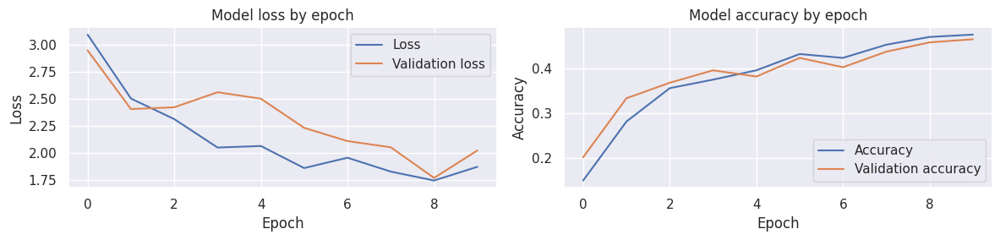

In [ ]:
# Creating the train and valid dataframes
odir_df_ox = OdirDataframe.create_multiclass_dataframe()
data_generator_ox = OdirDataGenerator.from_odir_dataframe(odir_df_ox, sample=100, batch_size=20)

# Instantiating the model
odir_vgg = VGG16Model(data_generator_ox, class_mode='multiclass', name='multiclass')
model_VGG16 = odir_vgg.create_model()
# odir_vgg.summary(model_VGG16)

# Training and evaluating the model
odir_vgg.setup_model(model_VGG16, layer_trainable_index=15, opt='adamW')
vgg_training = odir_vgg.train(model_VGG16, epochs=10)
vgg_evaluator_ = OdirModelEvaluator(model_VGG16, vgg_training)
vgg_evaluator_.plot_history()


Found 576 validated image filenames belonging to 8 classes.
Training data generated
Found 144 validated image filenames belonging to 8 classes.
Validation data generated
Found 80 validated image filenames belonging to 8 classes.
Test data generated
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 620ms/step - accuracy: 0.1372 - loss: 3.7069
Epoch 1: val_loss improved from inf to 2.80396, saving model to /content/drive/MyDrive/SKRIPSI/PROJECT/DATASET/model/RESNET/resnet50_model_checkpoint_1.keras
29/29 ━━━━━━━━━━━━━━━━━━━━ 73s 2s/step - accuracy: 0.1380 - loss: 3.7013 - val_accuracy: 0.2639 - val_loss: 2.8040 - learning_rate: 2.5000e-04
Epoch 2/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step - accuracy: 0.2227 - loss: 3.1146
Epoch 2: val_loss improved from 2.80396 to 2.57970, saving model to /content/drive/MyDrive/SKRIPSI/PROJECT/DATASET/model/RESNET/resnet50_model_checkpoint_2.keras
29/29 ━━━━━━━━━━━━━━━━━━━━ 10s 343ms/step - accuracy: 0.2236 - loss: 3.1124 - val_accuracy: 0.3819 - val_loss: 2.5797 - learning_rate: 2.5000e-04
Epoch 3/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - accuracy: 0.2818 - loss: 3.0008
Epoch 3: val_loss did not improve from 2.57970
29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 280ms/step - accuracy: 0.2825 - loss: 2.9975 - val_accur

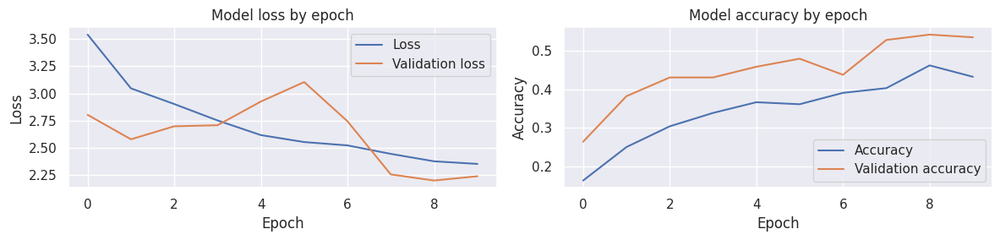

In [ ]:
# Creating the train and valid dataframes
odir_df_ex = OdirDataframe.create_multiclass_dataframe()
data_generator_ex = OdirDataGenerator.from_odir_dataframe(odir_df_ex, sample=100, batch_size=20)

# Instantiating the model
odir_resnet = ResNet50Model(data_generator_ex, class_mode='multiclass', name='multiclass')
model_RESNET50 = odir_resnet.create_model()
# odir_resnet.summary(model_RESNET50)

# Training and evaluating the model
odir_resnet.setup_model(model_RESNET50, opt='adamW', layer_trainable_index=140)
resnet_training = odir_resnet.train(model_RESNET50, epochs=10)
resnet_evaluator_ = OdirModelEvaluator(model_RESNET50, resnet_training)
resnet_evaluator_.plot_history()

Found 504 validated image filenames belonging to 7 classes.
Training data generated
Found 126 validated image filenames belonging to 7 classes.
Validation data generated
Found 70 validated image filenames belonging to 7 classes.
Test data generated


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12s/step - accuracy: 0.1496 - loss: 3.6327 
Epoch 1: val_loss improved from inf to 2.61706, saving model to /content/drive/MyDrive/SKRIPSI/PROJECT//model/RESNET/resnet50_model_checkpoint_1.keras
26/26 ━━━━━━━━━━━━━━━━━━━━ 458s 17s/step - accuracy: 0.1506 - loss: 3.6273 - val_accuracy: 0.3333 - val_loss: 2.6171 - learning_rate: 2.5000e-04
Epoch 2/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step - accuracy: 0.2595 - loss: 3.1392
Epoch 2: val_loss did not improve from 2.61706
26/26 ━━━━━━━━━━━━━━━━━━━━ 10s 375ms/step - accuracy: 0.2596 - loss: 3.1364 - val_accuracy: 0.3651 - val_loss: 2.6654 - learning_rate: 2.5000e-04
Epoch 3/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step - accuracy: 0.2993 - loss: 2.7313
Epoch 3: val_loss improved from 2.61706 to 2.28949, saving model to /content/drive/MyDrive/SKRIPSI/PROJECT//model/RESNET/resnet50_model_checkpoint_3.keras
26/26 ━━━━━━━━━━━━━━━━━━━━ 16s 458ms/step - accuracy: 0.3001 - loss: 2.7304 - val_accuracy: 0.4365 

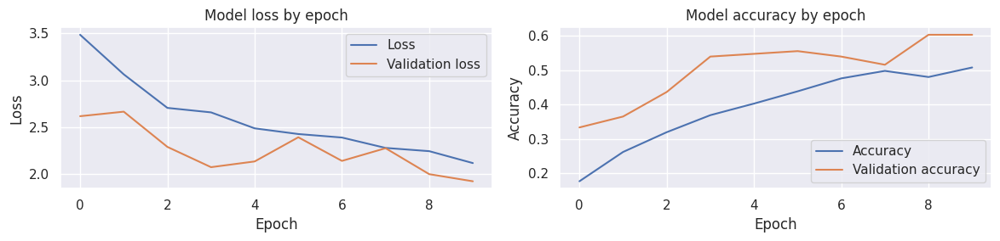

In [ ]:
# Creating the train and valid dataframes
odir_df_ex = OdirDataframe.create_multiclass_dataframe()
odir_df_ex.all_df = odir_df_ex.all_df[odir_df_ex.all_df['Label'] != '7']
data_generator_ex = OdirDataGenerator.from_odir_dataframe(odir_df_ex, sample=100, batch_size=20)

# Instantiating the model
odir_resnet = ResNet50Model(data_generator_ex, class_mode='multiclass', name='multiclass')
model_RESNET50 = odir_resnet.create_model()
# odir_resnet.summary(model_RESNET50)

# Training and evaluating the model
odir_resnet.setup_model(model_RESNET50, opt='adamW', layer_trainable_index=140)
resnet_training = odir_resnet.train(model_RESNET50, epochs=10)
resnet_evaluator_ = OdirModelEvaluator(model_RESNET50, resnet_training)
resnet_evaluator_.plot_history()

# Best Model Perform

Found 13666 validated image filenames belonging to 7 classes.
Training data generated
Found 3417 validated image filenames belonging to 7 classes.
Validation data generated
Found 1899 validated image filenames belonging to 7 classes.
Test data generated


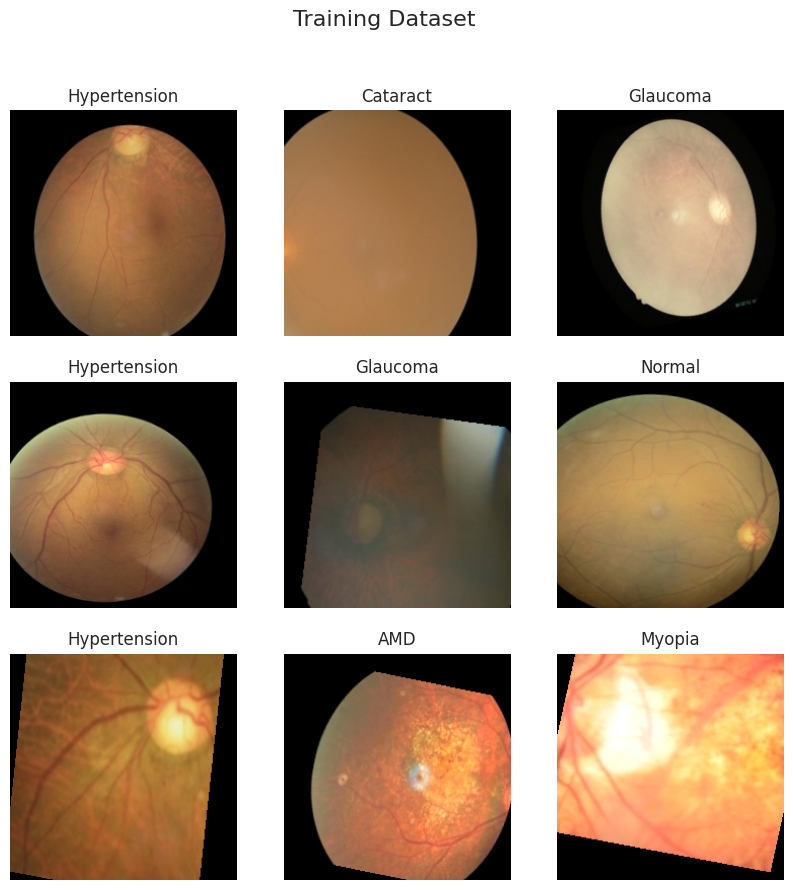

-------------------------------------------------------------------------------------------------------


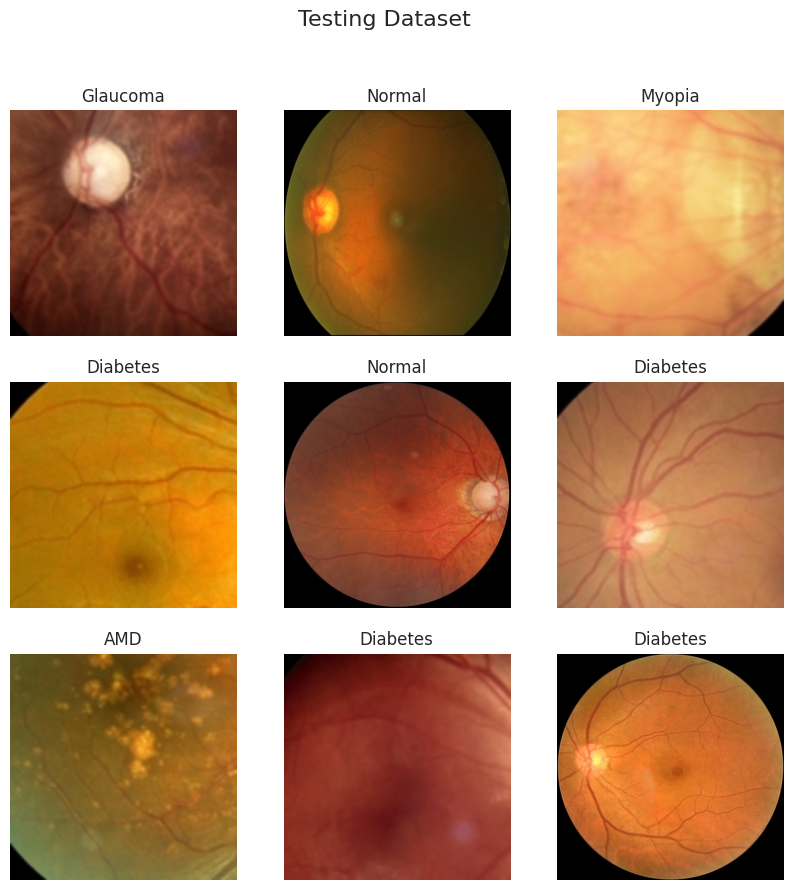

In [ ]:
from keras import backend as K
import numpy as np
import time
import pickle # Saving history


def create_data_generator(visualize_train=True, visualize_test=True):
  odir_df = OdirDataframe.create_multiclass_dataframe()
  odir_df.all_df = odir_df.all_df[odir_df.all_df['Label'] != '7']
  data_generator = OdirDataGenerator.from_odir_dataframe(odir_df, batch_size=128)

  # Visualize Data
  if visualize_train:
    data_generator.visualize()
  print('-------------------------------------------------------------------------------------------------------')
  if visualize_test:
    data_generator.visualize(data_test=True)

  return data_generator


data_generator_ex = create_data_generator(True, True)

In [ ]:
odir_resnet, model_ex = ResNet50Model.instanciate_and_setup_model(data_generator_ex, class_mode='multiclass', name='multiclass', layer_trainable_index=140)

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 24,163,847 (92.18 MB)

 Trainable params: 15,549,191 (59.32 MB)

 Non-trainable params: 8,614,656 (32.86 MB)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/60
107/107 ━━━━━━━━━━━━━━━━━━━━ 0s 39s/step - accuracy: 0.3545 - loss: 2.6729 
Epoch 1: val_loss improved from inf to 1.65817, saving model to /content/drive/MyDrive/SKRIPSI/PROJECT//model/RESNET/resnet50_model_checkpoint_1.keras
107/107 ━━━━━━━━━━━━━━━━━━━━ 5218s 48s/step - accuracy: 0.3556 - loss: 2.6690 - val_accuracy: 0.6766 - val_loss: 1.6582 - learning_rate: 2.5000e-04
Epoch 2/60
107/107 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6429 - loss: 1.6964
Epoch 2: val_loss improved from 1.65817 to 1.40840, saving model to /content/drive/MyDrive/SKRIPSI/PROJECT//model/RESNET/resnet50_model_checkpoint_2.keras
107/107 ━━━━━━━━━━━━━━━━━━━━ 190s 2s/step - accuracy: 0.6431 - loss: 1.6959 - val_accuracy: 0.7401 - val_loss: 1.4084 - learning_rate: 2.5000e-04
Epoch 3/60
107/107 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7131 - loss: 1.5023
Epoch 3: val_loss improved from 1.40840 to 1.27666, saving model to /content/drive/MyDrive/SKRIPSI/PROJECT//model/RESNET/resnet50_model_checkpo

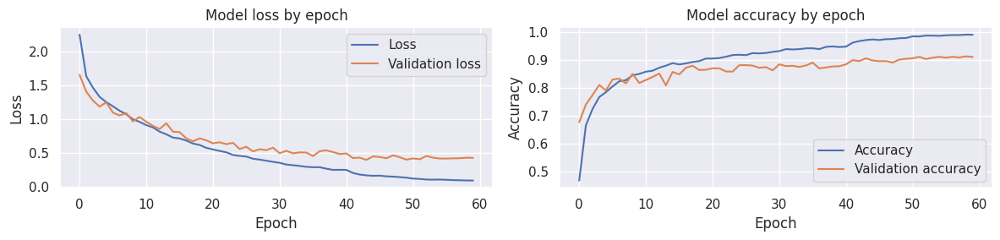

NameError: name 'training_history_ox' is not defined

In [ ]:
import numpy as np
import time
import pickle

EPOCHS = 60

training_history_ex = odir_resnet.train(model_ex, epochs=EPOCHS)

odir_evaluator_ex = OdirModelEvaluator(model_ex, training_history_ex)
odir_evaluator_ex.plot_history()

training_history_file_name = os.path.join(MODEL_OUTPUT_RESNET_PATH, f'{odir_resnet.model_last_path[:-6]}.npy')
np.save(training_history_file_name, training_history_ex.history)

training_history_load = np.load(training_history_file_name, allow_pickle=True).item()


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report,accuracy_score
from tqdm import tqdm

model_ft = ResNet50Model.load_model('model_weights_ResNet50_2025-06-30_multiclass.keras')

def model_report(test_generator, model):
  y_pred = []
  y_true = []
  loss_eval = []
  accuracy_eval = []
  len_gen = len(test_generator)
  for i in tqdm(range(len_gen)):
    X_test, y_test = next(test_generator)
    test_pred = model_ft.predict(X_test)
    list_eval = model_ft.evaluate(X_test, y_test)
    loss_eval.append(list_eval[0])
    accuracy_eval.append(list_eval[1])
    y_pred.append(test_pred.argmax(axis = 1))
    y_true.append(y_test)

  return y_true, y_pred, loss_eval, accuracy_eval

y_true, y_pred, loss_eval, accuracy_eval = model_report(data_generator_ex.test_generator, model_ft)
print('\n')
print('model loss function:\n', round(np.mean(loss_eval), 4))
print('model accuracy:\n', round(np.mean(accuracy_eval)*100,2), '%')

  0%|          | 0/15 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 89ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - accuracy: 0.9146 - loss: 0.4159


  7%|▋         | 1/15 [00:54<12:40, 54.32s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9021 - loss: 0.4009


 13%|█▎        | 2/15 [01:37<10:18, 47.56s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 0.9167 - loss: 0.3654


 20%|██        | 3/15 [02:22<09:21, 46.76s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 0.9042 - loss: 0.3781


 27%|██▋       | 4/15 [03:06<08:19, 45.45s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.9500 - loss: 0.2694


 33%|███▎      | 5/15 [03:45<07:11, 43.19s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.8479 - loss: 0.6045


 40%|████      | 6/15 [04:25<06:18, 42.06s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 0.9271 - loss: 0.3658


 47%|████▋     | 7/15 [05:05<05:30, 41.27s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.8990 - loss: 0.3781


 53%|█████▎    | 8/15 [05:46<04:49, 41.41s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 0.9594 - loss: 0.2152


 60%|██████    | 9/15 [06:27<04:07, 41.24s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.9198 - loss: 0.3019


 67%|██████▋   | 10/15 [07:08<03:25, 41.17s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9260 - loss: 0.3260


 73%|███████▎  | 11/15 [07:57<02:54, 43.54s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9448 - loss: 0.3496


 80%|████████  | 12/15 [08:38<02:08, 42.80s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9052 - loss: 0.4096


 87%|████████▋ | 13/15 [09:17<01:23, 41.67s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 641ms/step - accuracy: 0.9309 - loss: 0.3432


 93%|█████████▎| 14/15 [10:01<00:42, 42.39s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 0.8938 - loss: 0.3788


100%|██████████| 15/15 [10:03<00:00, 40.22s/it]



model loss function:
 0.3685
model accuracy:
 91.47 %


In [ ]:
y_pred_class = []
y_test_class = []
y_pred_f = []
y_true_f = []
for i in range(len(y_pred)):
  y_pred_f.extend(y_pred[i])
  y_true_f.extend(y_true[i])
  y_pred_class.extend([OdirDataGenerator.get_class_name(x) for x in y_pred[i]])
  y_test_class.extend([OdirDataGenerator.get_class_name(x) for x in y_true[i]])

print(classification_report(y_test_class, y_pred_class))

              precision    recall  f1-score   support

         AMD       0.92      0.97      0.94       261
    Cataract       1.00      0.98      0.99       275
    Diabetes       0.81      0.72      0.76       278
    Glaucoma       0.96      0.94      0.95       261
Hypertension       0.98      0.96      0.97       281
      Myopia       0.98      1.00      0.99       261
      Normal       0.76      0.85      0.81       282

    accuracy                           0.91      1899
   macro avg       0.92      0.92      0.92      1899
weighted avg       0.92      0.91      0.91      1899



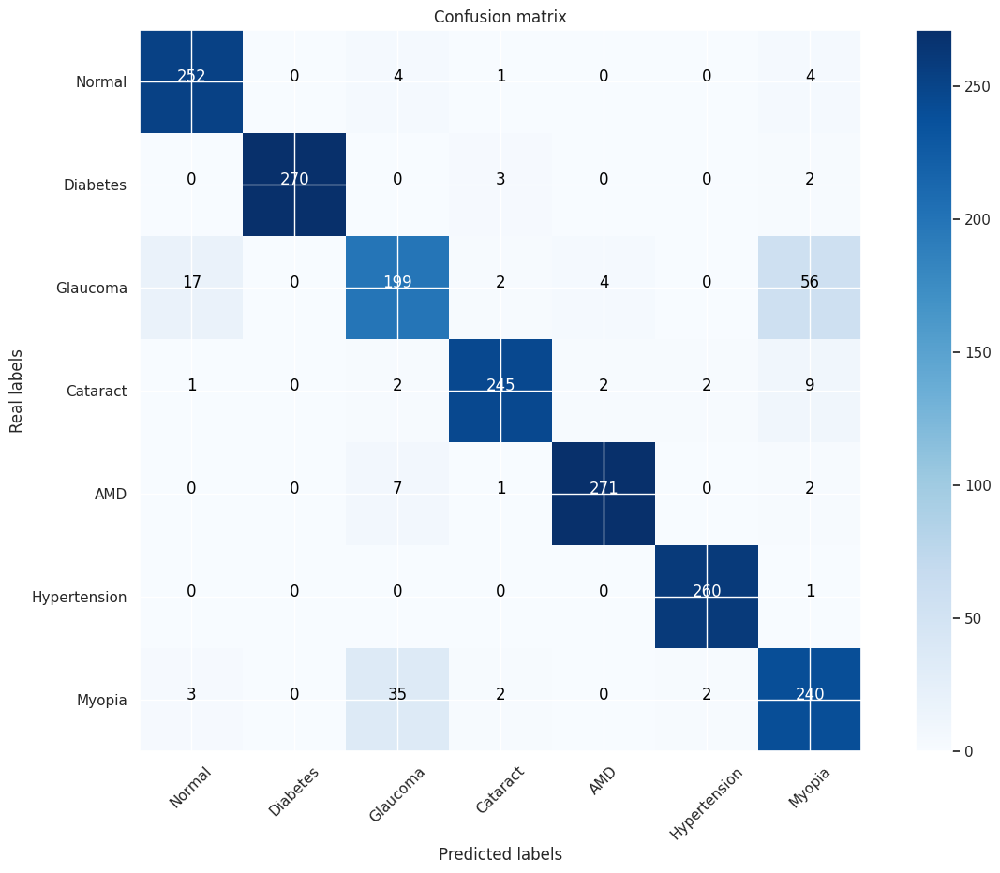

In [ ]:
import itertools
cnf_matrix = confusion_matrix(y_test_class, y_pred_class)
classes = ['Normal', 'Diabetes', 'Glaucoma', 'Cataract', 'AMD', 'Hypertension', 'Myopia']

plt.figure(figsize=(15, 10))

plt.imshow(cnf_matrix, interpolation='nearest',cmap='Blues')
plt.title("Confusion matrix")
plt.colorbar()
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)


for i, j in itertools.product(range(cnf_matrix.shape[0]), range(cnf_matrix.shape[1])):
    plt.text(j, i, cnf_matrix[i, j],
             horizontalalignment="center",
             color="white" if cnf_matrix[i, j] > ( cnf_matrix.max() / 2) else "black")

plt.ylabel('Real labels')
plt.xlabel('Predicted labels')
plt.show()

# Execution Model Visual Geometry Group(VGG-16)

## AUGMENTED VS NON-AUGMENTED

### AUGMENTED V2

Found 15427 validated image filenames belonging to 8 classes.
Training data generated
Found 3857 validated image filenames belonging to 8 classes.
Validation data generated
Found 2143 validated image filenames belonging to 8 classes.
Test data generated


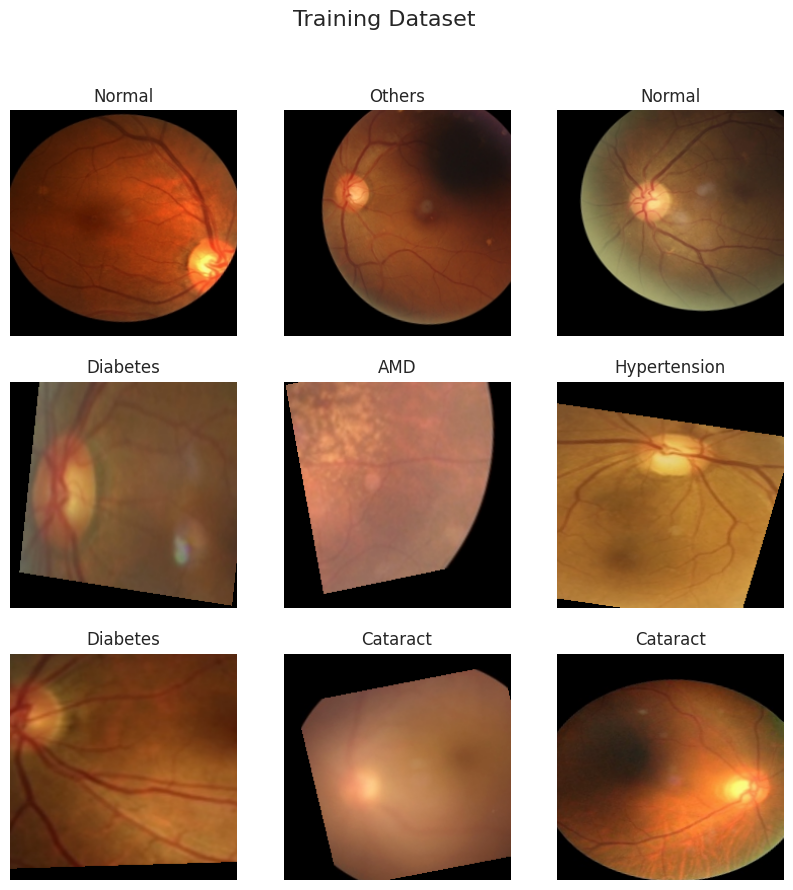

-------------------------------------------------------------------------------------------------------


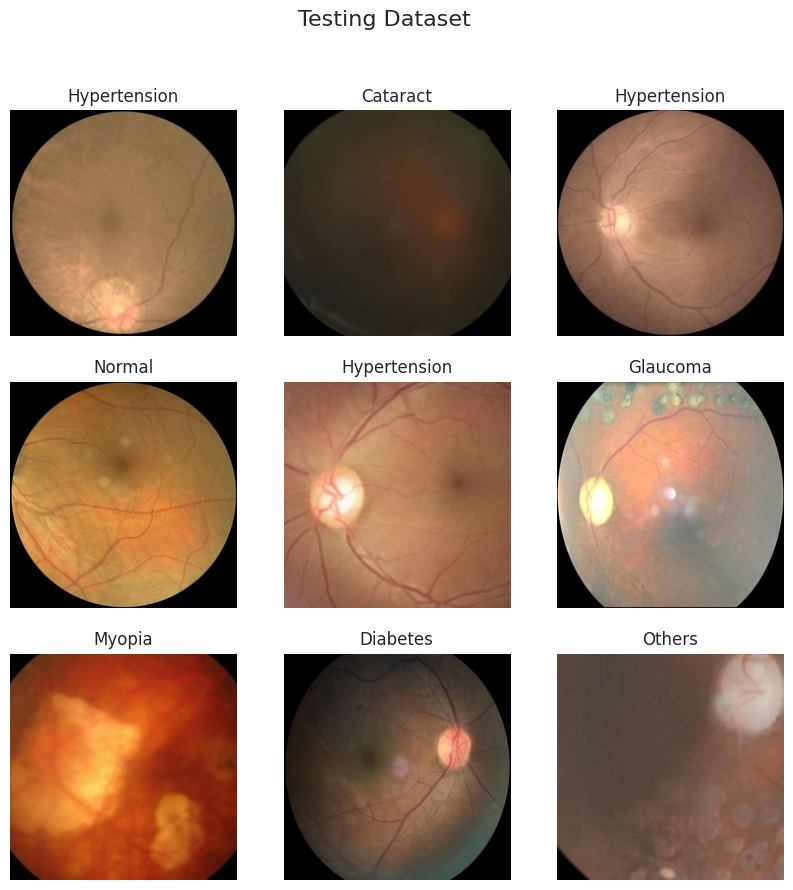

In [ ]:
from keras import backend as K
import numpy as np
import time
import pickle # Saving history

def create_data_generator(visualize_train=True, visualize_test=True):
  odir_df = OdirDataframe.create_multiclass_dataframe()
  data_generator = OdirDataGenerator.from_odir_dataframe(odir_df, batch_size=128)

  # Visualize Data
  if visualize_train:
    data_generator.visualize()
  print('-------------------------------------------------------------------------------------------------------')
  if visualize_test:
    data_generator.visualize(data_test=True)

  return data_generator


data_generator_ox = create_data_generator(True, True)

In [ ]:
odir_vgg, model_ox = VGG16Model.instanciate_and_setup_model(data_generator_ox, class_mode='multiclass', name='multiclass', layer_trainable_index=15)

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1024)           │       525,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 15,777,096 (60.18 MB)

 Trainable params: 8,137,736 (31.04 MB)

 Non-trainable params: 7,639,360 (29.14 MB)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/40
121/121 ━━━━━━━━━━━━━━━━━━━━ 0s 71s/step - accuracy: 0.3113 - loss: 2.3719  
Epoch 1: val_loss improved from inf to 1.41023, saving model to /content/drive/MyDrive/SKRIPSI/PROJECT//model/VGG/vgg16_model_checkpoint_1.keras
121/121 ━━━━━━━━━━━━━━━━━━━━ 10795s 89s/step - accuracy: 0.3121 - loss: 2.3690 - val_accuracy: 0.5608 - val_loss: 1.4102 - learning_rate: 5.0000e-05
Epoch 2/40
121/121 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5155 - loss: 1.5389
Epoch 2: val_loss improved from 1.41023 to 1.32753, saving model to /content/drive/MyDrive/SKRIPSI/PROJECT//model/VGG/vgg16_model_checkpoint_2.keras
121/121 ━━━━━━━━━━━━━━━━━━━━ 230s 2s/step - accuracy: 0.5156 - loss: 1.5385 - val_accuracy: 0.6114 - val_loss: 1.3275 - learning_rate: 5.0000e-05
Epoch 3/40
121/121 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5719 - loss: 1.3216
Epoch 3: val_loss improved from 1.32753 to 1.06354, saving model to /content/drive/MyDrive/SKRIPSI/PROJECT//model/VGG/vgg16_model_checkpoint_3.keras
121/

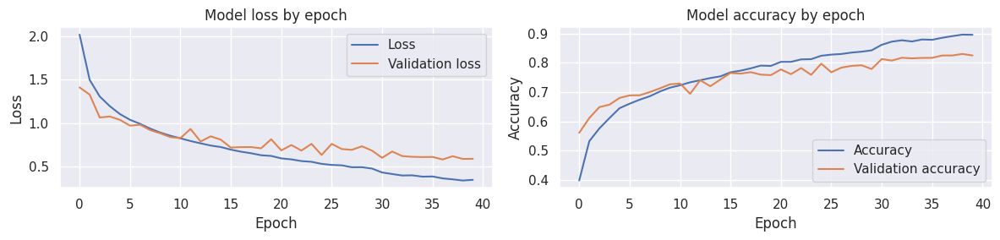

In [ ]:
EPOCHS = 40

training_history_ox = odir_vgg.train(model_ox, epochs=EPOCHS)
odir_evaluator_ox = OdirModelEvaluator(model_ox, training_history_ox)
odir_evaluator_ox.plot_history()

training_history_file_name = os.path.join(MODEL_OUTPUT_VGG_PATH, f'{odir_vgg.model_last_path[:-6]}.npy')
np.save(training_history_file_name, training_history_ox.history)
training_history_load = np.load(training_history_file_name, allow_pickle='TRUE').item()

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report,accuracy_score
from tqdm import tqdm

model_ft = VGG16Model.load_model('model_weights_VGG16_2025-07-02_multiclass.keras')

def model_report(test_generator, model):
  y_pred = []
  y_true = []
  loss_eval = []
  accuracy_eval = []
  len_gen = len(test_generator)
  for i in tqdm(range(len_gen)):
    X_test, y_test = next(test_generator)
    test_pred = model_ft.predict(X_test)
    list_eval = model_ft.evaluate(X_test, y_test)
    loss_eval.append(list_eval[0])
    accuracy_eval.append(list_eval[1])
    y_pred.append(test_pred.argmax(axis = 1))
    y_true.append(y_test)

  return y_true, y_pred, loss_eval, accuracy_eval

y_true, y_pred, loss_eval, accuracy_eval = model_report(data_generator_ox.test_generator, model_ft)
print('\n')
print('model loss function:\n', round(np.mean(loss_eval), 4))
print('model accuracy:\n', round(np.mean(accuracy_eval)*100,2), '%')

  0%|          | 0/17 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - accuracy: 0.8667 - loss: 0.5329


  6%|▌         | 1/17 [00:03<00:57,  3.60s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - accuracy: 0.9104 - loss: 0.4790


 12%|█▏        | 2/17 [00:05<00:40,  2.68s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - accuracy: 0.8260 - loss: 0.4925


 18%|█▊        | 3/17 [00:07<00:33,  2.41s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - accuracy: 0.7917 - loss: 0.7753


 24%|██▎       | 4/17 [00:09<00:29,  2.28s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - accuracy: 0.8562 - loss: 0.4929


 29%|██▉       | 5/17 [00:11<00:26,  2.19s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - accuracy: 0.7958 - loss: 0.6215


 35%|███▌      | 6/17 [00:13<00:23,  2.14s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - accuracy: 0.8562 - loss: 0.6778


 41%|████      | 7/17 [00:15<00:21,  2.12s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - accuracy: 0.8229 - loss: 0.4760


 47%|████▋     | 8/17 [00:18<00:18,  2.11s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - accuracy: 0.8375 - loss: 0.6102


 53%|█████▎    | 9/17 [00:20<00:16,  2.10s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - accuracy: 0.8667 - loss: 0.4340


 59%|█████▉    | 10/17 [00:22<00:14,  2.10s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - accuracy: 0.7344 - loss: 0.8175


 65%|██████▍   | 11/17 [00:24<00:12,  2.08s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - accuracy: 0.7958 - loss: 0.7297


 71%|███████   | 12/17 [00:26<00:10,  2.07s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - accuracy: 0.8344 - loss: 0.5465


 76%|███████▋  | 13/17 [00:28<00:08,  2.07s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - accuracy: 0.8760 - loss: 0.4396


 82%|████████▏ | 14/17 [00:30<00:06,  2.08s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - accuracy: 0.8823 - loss: 0.5127


 88%|████████▊ | 15/17 [00:32<00:04,  2.06s/it]

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 418ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 378ms/step - accuracy: 0.8154 - loss: 0.6076


 94%|█████████▍| 16/17 [00:35<00:02,  2.43s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - accuracy: 0.8667 - loss: 0.3715


100%|██████████| 17/17 [00:37<00:00,  2.22s/it]



model loss function:
 0.5442
model accuracy:
 83.95 %


In [ ]:
y_pred_class = []
y_test_class = []
y_pred_f = []
y_true_f = []
for i in range(len(y_pred)):
  y_pred_f.extend(y_pred[i])
  y_true_f.extend(y_true[i])
  y_pred_class.extend([OdirDataGenerator.get_class_name(x) for x in y_pred[i]])
  y_test_class.extend([OdirDataGenerator.get_class_name(x) for x in y_true[i]])

print(classification_report(y_test_class, y_pred_class))

              precision    recall  f1-score   support

         AMD       0.86      0.90      0.88       261
    Cataract       0.96      0.97      0.96       275
    Diabetes       0.71      0.66      0.68       278
    Glaucoma       0.87      0.93      0.90       261
Hypertension       0.87      0.97      0.92       281
      Myopia       0.97      0.98      0.98       261
      Normal       0.71      0.83      0.76       282
      Others       0.75      0.44      0.55       244

    accuracy                           0.84      2143
   macro avg       0.84      0.84      0.83      2143
weighted avg       0.84      0.84      0.83      2143



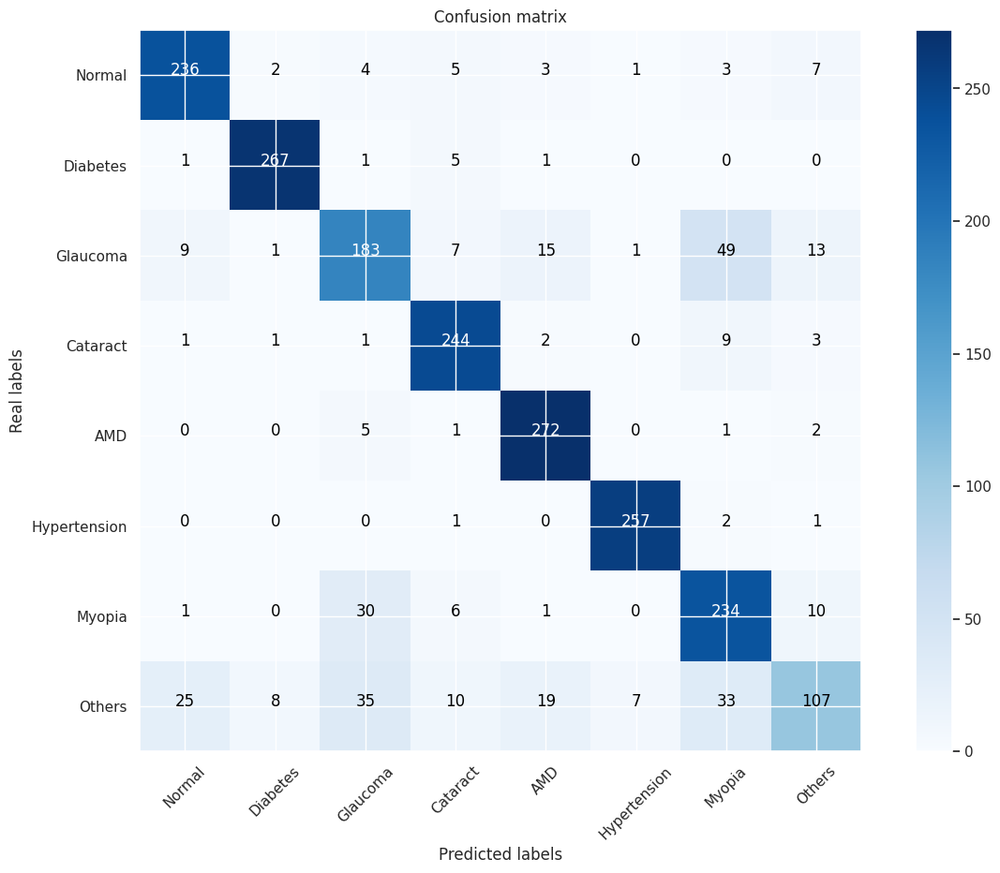

In [ ]:
import itertools
import matplotlib.pyplot as plt

cnf_matrix = confusion_matrix(y_test_class, y_pred_class)
classes = DISEASE_CLASSES

plt.figure(figsize=(15, 10))
plt.imshow(cnf_matrix, interpolation='nearest',cmap='Blues')
plt.title("Confusion matrix")
plt.colorbar()
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)


for i, j in itertools.product(range(cnf_matrix.shape[0]), range(cnf_matrix.shape[1])):
    plt.text(j, i, cnf_matrix[i, j],
             horizontalalignment="center",
             color="white" if cnf_matrix[i, j] > ( cnf_matrix.max() / 2) else "black")

plt.ylabel('Real labels')
plt.xlabel('Predicted labels')
plt.show()

### NON-AUGMENTED IMBALANCE

Found 4367 validated image filenames belonging to 8 classes.
Training data generated
Found 1092 validated image filenames belonging to 8 classes.
Validation data generated
Found 607 validated image filenames belonging to 8 classes.
Test data generated


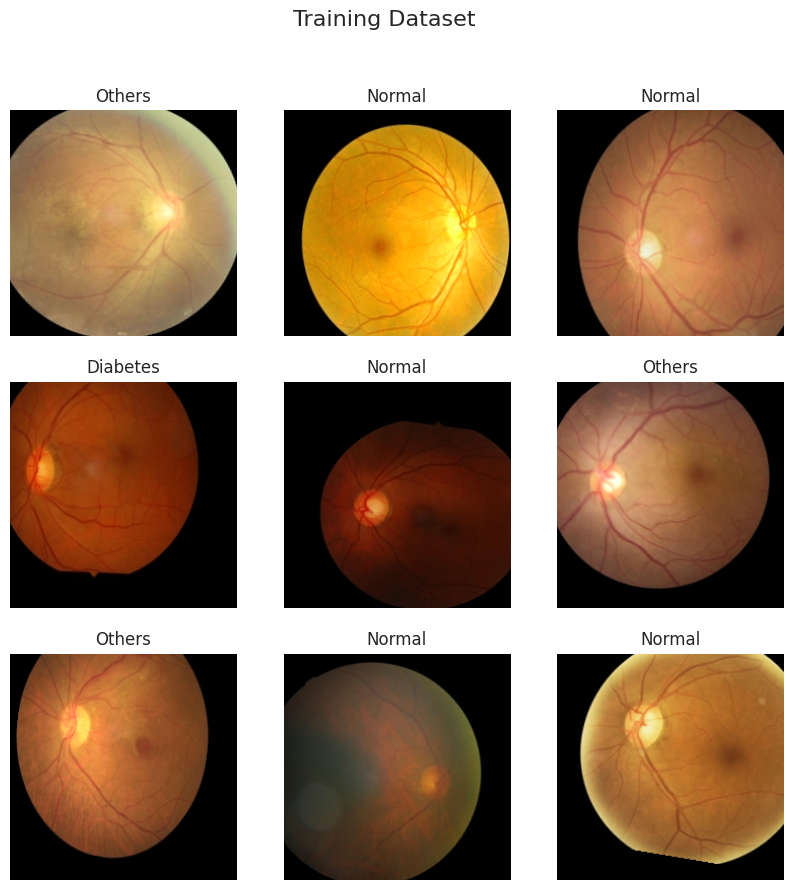

-------------------------------------------------------------------------------------------------------


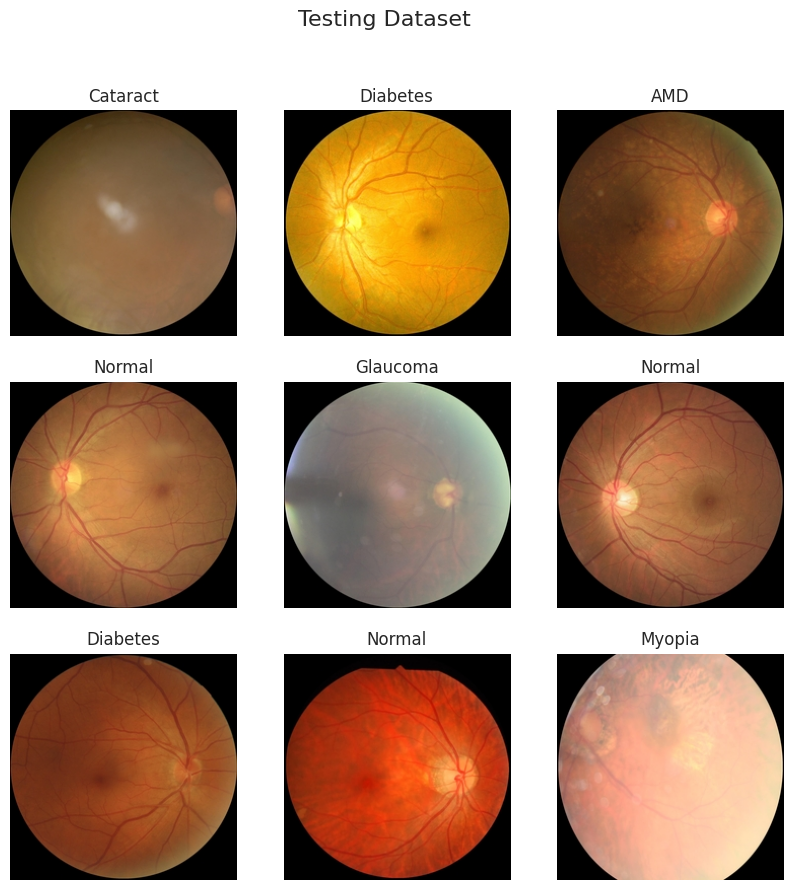

In [ ]:
def create_data_generator(visualize_train=True, visualize_test=True):
  odir_df_sample = OdirDataframe.create_multiclass_dataframe_()
  data_generator_sample = OdirDataGenerator.from_odir_dataframe(odir_df_sample, batch_size=20)

  # Visualize Data
  if visualize_train:
    data_generator_sample.visualize()
  print('-------------------------------------------------------------------------------------------------------')
  if visualize_test:
    data_generator_sample.visualize(data_test=True)

  return data_generator_sample


data_generator_ox_sample = create_data_generator(True, True)

In [ ]:
odir_vgg_sample, model_ox_sample = VGG16Model.instanciate_and_setup_model(data_generator_ox_sample, class_mode='multiclass', name='multiclass', layer_trainable_index=15)

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1024)           │       525,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 15,777,096 (60.18 MB)

 Trainable params: 8,137,736 (31.04 MB)

 Non-trainable params: 7,639,360 (29.14 MB)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/40
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 12s/step - accuracy: 0.1698 - loss: 3.0949 
Epoch 1: val_loss improved from inf to 1.86652, saving model to /content/drive/MyDrive/SKRIPSI/PROJECT//model/VGG/vgg16_model_checkpoint_1.keras
219/219 ━━━━━━━━━━━━━━━━━━━━ 3188s 15s/step - accuracy: 0.1700 - loss: 3.0938 - val_accuracy: 0.4295 - val_loss: 1.8665 - learning_rate: 5.0000e-05
Epoch 2/40
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step - accuracy: 0.3151 - loss: 2.3988
Epoch 2: val_loss improved from 1.86652 to 1.85063, saving model to /content/drive/MyDrive/SKRIPSI/PROJECT//model/VGG/vgg16_model_checkpoint_2.keras
219/219 ━━━━━━━━━━━━━━━━━━━━ 85s 389ms/step - accuracy: 0.3152 - loss: 2.3987 - val_accuracy: 0.4295 - val_loss: 1.8506 - learning_rate: 5.0000e-05
Epoch 3/40
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step - accuracy: 0.3947 - loss: 2.1204
Epoch 3: val_loss improved from 1.85063 to 1.71852, saving model to /content/drive/MyDrive/SKRIPSI/PROJECT//model/VGG/vgg16_model_checkpoint_3.kera

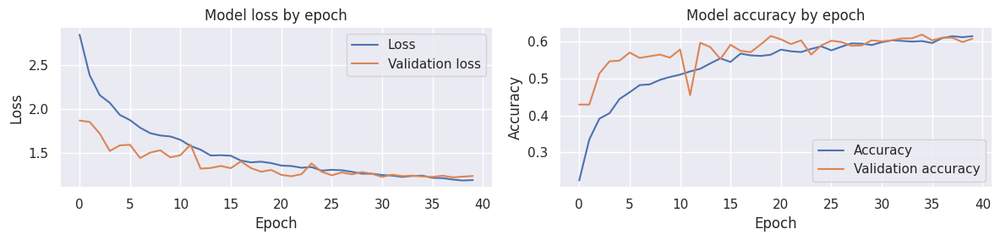

In [ ]:
EPOCHS = 40

training_history_ox_ = odir_vgg_sample.train(model_ox_sample, epochs=EPOCHS)
odir_evaluator_ox_ = OdirModelEvaluator(model_ox_sample, training_history_ox_)
odir_evaluator_ox_.plot_history()

training_history_file_name_ = os.path.join(MODEL_OUTPUT_VGG_PATH, f'{odir_vgg_sample.model_last_path[:-6]}.npy')
np.save(training_history_file_name_, training_history_ox_.history)
training_history_load = np.load(training_history_file_name_, allow_pickle='TRUE').item()

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report,accuracy_score
from tqdm import tqdm

model_ft_sample =  VGG16Model.load_model('model_weights_VGG16_2025-05-31_multiclass.keras')

def model_report(test_generator, model):
  y_pred = []
  y_true = []
  loss_eval = []
  accuracy_eval = []
  len_gen = len(test_generator)
  for i in tqdm(range(len_gen)):
    X_test, y_test = next(test_generator)
    test_pred = model_ft_sample.predict(X_test)
    list_eval = model_ft_sample.evaluate(X_test, y_test)
    loss_eval.append(list_eval[0])
    accuracy_eval.append(list_eval[1])
    y_pred.append(test_pred.argmax(axis = 1))
    y_true.append(y_test)

  return y_true, y_pred, loss_eval, accuracy_eval

y_true, y_pred, loss_eval, accuracy_eval = model_report(data_generator_ox_sample.test_generator, model_ft_sample)
print('model loss function:\n', round(np.mean(loss_eval), 4))
print('model accuracy:\n', round(np.mean(accuracy_eval)*100,2), '%')

  0%|          | 0/31 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 799ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.5000 - loss: 1.4540


  3%|▎         | 1/31 [00:05<02:30,  5.02s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - accuracy: 0.6500 - loss: 0.9674


  6%|▋         | 2/31 [00:06<01:25,  2.95s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - accuracy: 0.6000 - loss: 1.2188


 10%|▉         | 3/31 [00:10<01:34,  3.38s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - accuracy: 0.6500 - loss: 1.1632


 13%|█▎        | 4/31 [00:13<01:25,  3.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - accuracy: 0.6000 - loss: 1.4745


 16%|█▌        | 5/31 [00:16<01:20,  3.09s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - accuracy: 0.7500 - loss: 0.9312


 19%|█▉        | 6/31 [00:18<01:09,  2.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - accuracy: 0.5500 - loss: 1.2168


 23%|██▎       | 7/31 [00:21<01:11,  3.00s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - accuracy: 0.6500 - loss: 1.5531


 26%|██▌       | 8/31 [00:23<01:01,  2.68s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - accuracy: 0.7500 - loss: 0.9791


 29%|██▉       | 9/31 [00:26<00:57,  2.61s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - accuracy: 0.6500 - loss: 0.9368


 32%|███▏      | 10/31 [00:27<00:45,  2.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - accuracy: 0.5500 - loss: 1.1585


 35%|███▌      | 11/31 [00:30<00:50,  2.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - accuracy: 0.4500 - loss: 1.2161


 39%|███▊      | 12/31 [00:34<00:56,  2.96s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - accuracy: 0.7000 - loss: 1.0062


 42%|████▏     | 13/31 [00:36<00:47,  2.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.5500 - loss: 1.3956


 45%|████▌     | 14/31 [00:39<00:47,  2.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - accuracy: 0.5500 - loss: 1.4531


 48%|████▊     | 15/31 [00:42<00:43,  2.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.5500 - loss: 1.3040


 52%|█████▏    | 16/31 [00:45<00:42,  2.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - accuracy: 0.7000 - loss: 0.8464


 55%|█████▍    | 17/31 [00:48<00:38,  2.77s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - accuracy: 0.6500 - loss: 1.0265


 58%|█████▊    | 18/31 [00:51<00:37,  2.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - accuracy: 0.7500 - loss: 0.9675


 61%|██████▏   | 19/31 [00:53<00:32,  2.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - accuracy: 0.8000 - loss: 0.5931


 65%|██████▍   | 20/31 [00:55<00:28,  2.56s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.7000 - loss: 0.7184


 68%|██████▊   | 21/31 [00:58<00:26,  2.62s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - accuracy: 0.3500 - loss: 1.7254


 71%|███████   | 22/31 [01:02<00:27,  3.01s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - accuracy: 0.6500 - loss: 0.8398


 74%|███████▍  | 23/31 [01:04<00:22,  2.83s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step - accuracy: 0.7000 - loss: 1.2261


 77%|███████▋  | 24/31 [01:07<00:20,  2.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - accuracy: 0.5000 - loss: 1.5526


 81%|████████  | 25/31 [01:10<00:16,  2.75s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - accuracy: 0.5000 - loss: 1.2154


 84%|████████▍ | 26/31 [01:12<00:12,  2.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - accuracy: 0.6500 - loss: 1.0562


 87%|████████▋ | 27/31 [01:16<00:12,  3.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - accuracy: 0.7500 - loss: 0.7300


 90%|█████████ | 28/31 [01:19<00:08,  2.91s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - accuracy: 0.4500 - loss: 1.2994


 94%|█████████▎| 29/31 [01:22<00:06,  3.11s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 667ms/step - accuracy: 0.5714 - loss: 1.4355


 97%|█████████▋| 30/31 [01:28<00:03,  3.94s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - accuracy: 0.6500 - loss: 1.1637


100%|██████████| 31/31 [01:28<00:00,  2.87s/it]

model loss function:
 1.1556
model accuracy:
 61.52 %


In [ ]:
y_pred_class = []
y_test_class = []
y_pred_f = []
y_true_f = []
for i in range(len(y_pred)):
  y_pred_f.extend(y_pred[i])
  y_true_f.extend(y_true[i])
  y_pred_class.extend([OdirDataGenerator.get_class_name(x) for x in y_pred[i]])
  y_test_class.extend([OdirDataGenerator.get_class_name(x) for x in y_true[i]])

print(classification_report(y_test_class, y_pred_class))

              precision    recall  f1-score   support

         AMD       0.83      0.42      0.56        24
    Cataract       0.88      0.88      0.88        25
    Diabetes       0.62      0.47      0.53       139
    Glaucoma       0.30      0.14      0.19        22
Hypertension       0.00      0.00      0.00        10
      Myopia       0.72      0.75      0.73        24
      Normal       0.63      0.86      0.72       282
      Others       0.33      0.17      0.23        81

    accuracy                           0.62       607
   macro avg       0.54      0.46      0.48       607
weighted avg       0.59      0.62      0.58       607



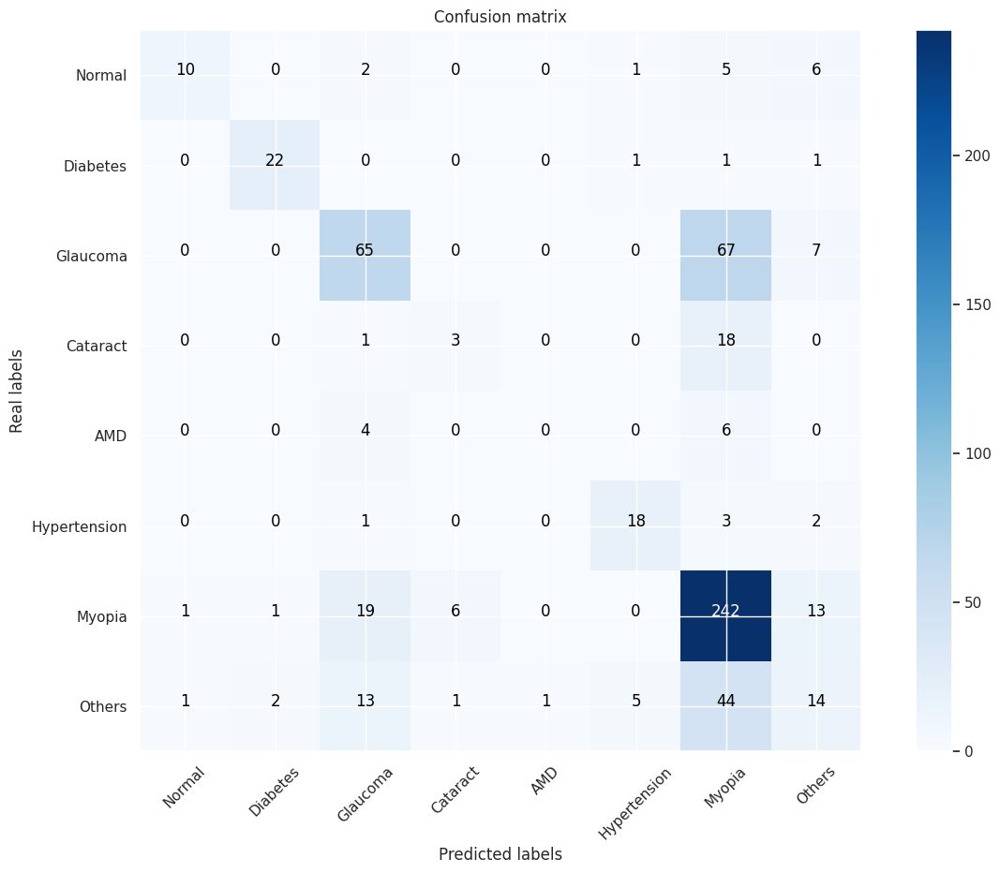

In [ ]:
import itertools
import matplotlib.pyplot as plt

cnf_matrix = confusion_matrix(y_test_class, y_pred_class)
classes = DISEASE_CLASSES

plt.figure(figsize=(15, 10))
plt.imshow(cnf_matrix, interpolation='nearest',cmap='Blues')
plt.title("Confusion matrix")
plt.colorbar()
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)


for i, j in itertools.product(range(cnf_matrix.shape[0]), range(cnf_matrix.shape[1])):
    plt.text(j, i, cnf_matrix[i, j],
             horizontalalignment="center",
             color="white" if cnf_matrix[i, j] > ( cnf_matrix.max() / 2) else "black")

plt.ylabel('Real labels')
plt.xlabel('Predicted labels')
plt.show()

### NON-AUGMENTED BALANCE

Found 598 validated image filenames belonging to 8 classes.
Training data generated
Found 150 validated image filenames belonging to 8 classes.
Validation data generated
Found 84 validated image filenames belonging to 8 classes.
Test data generated


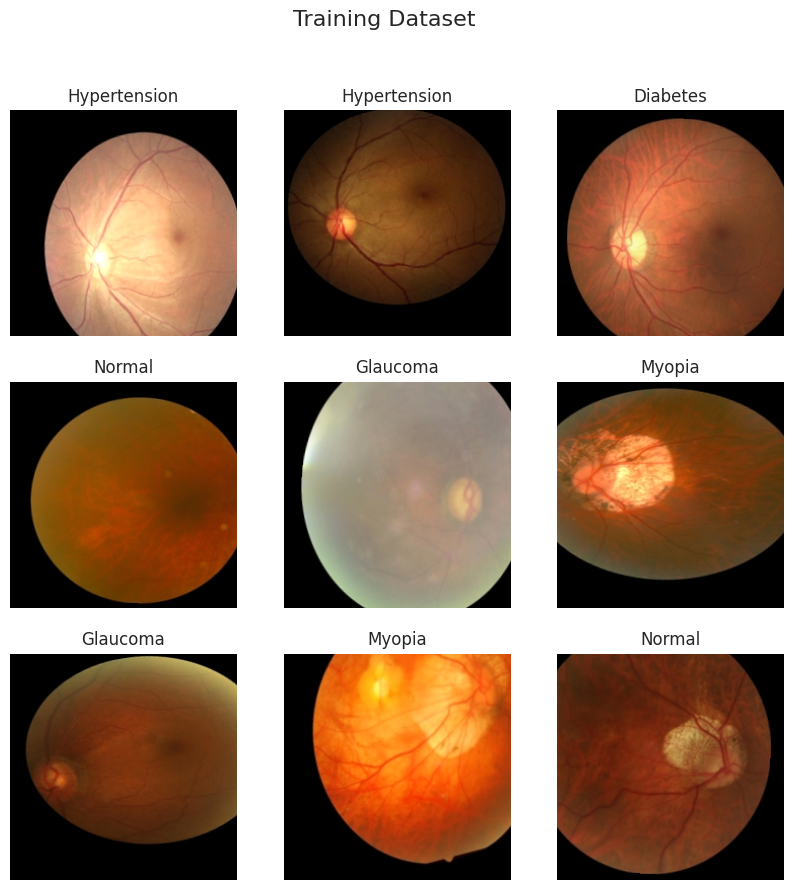

-------------------------------------------------------------------------------------------------------


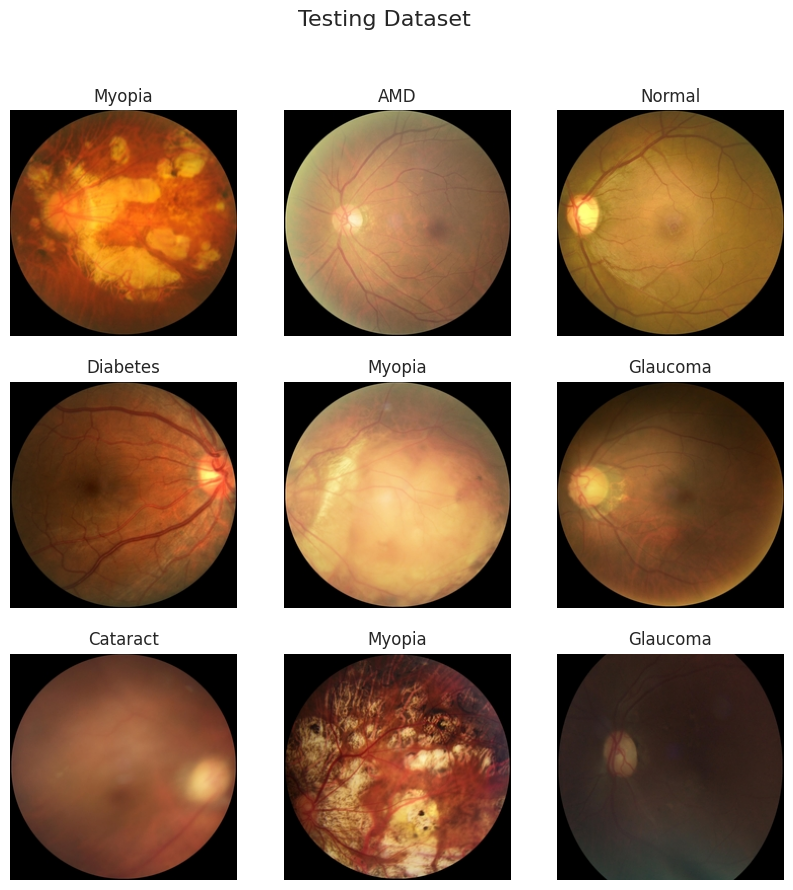

In [ ]:
def create_data_generator(visualize_train=True, visualize_test=True):
  odir_df_sample = OdirDataframe.create_multiclass_dataframe()
  data_generator_sample = OdirDataGenerator.from_odir_dataframe(odir_df_sample, sample=104, batch_size=20)

  # Visualize Data
  if visualize_train:
    data_generator_sample.visualize()
  print('-------------------------------------------------------------------------------------------------------')
  if visualize_test:
    data_generator_sample.visualize(data_test=True)

  return data_generator_sample


data_generator_ox_sample = create_data_generator(True, True)

In [ ]:
odir_vgg_sample, model_ox_sample = VGG16Model.instanciate_and_setup_model(data_generator_ox_sample, class_mode='multiclass', name='multiclass', layer_trainable_index=15)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1024)           │       525,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 15,777,096 (60.18 MB)

 Trainable params: 8,137,736 (31.04 MB)

 Non-trainable params: 7,639,360 (29.14 MB)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.1767 - loss: 3.0767
Epoch 1: val_loss improved from inf to 2.23447, saving model to /content/drive/MyDrive/SKRIPSI/PROJECT//model/VGG/vgg16_model_checkpoint_1.keras
30/30 ━━━━━━━━━━━━━━━━━━━━ 258s 8s/step - accuracy: 0.1787 - loss: 3.0661 - val_accuracy: 0.2800 - val_loss: 2.2345 - learning_rate: 5.0000e-05
Epoch 2/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step - accuracy: 0.2977 - loss: 2.2743
Epoch 2: val_loss improved from 2.23447 to 2.01509, saving model to /content/drive/MyDrive/SKRIPSI/PROJECT//model/VGG/vgg16_model_checkpoint_2.keras
30/30 ━━━━━━━━━━━━━━━━━━━━ 13s 419ms/step - accuracy: 0.2979 - loss: 2.2765 - val_accuracy: 0.2667 - val_loss: 2.0151 - learning_rate: 5.0000e-05
Epoch 3/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step - accuracy: 0.3152 - loss: 2.2152
Epoch 3: val_loss improved from 2.01509 to 1.84919, saving model to /content/drive/MyDrive/SKRIPSI/PROJECT//model/VGG/vgg16_model_checkpoint_3.keras
30/30 ━━━━━━

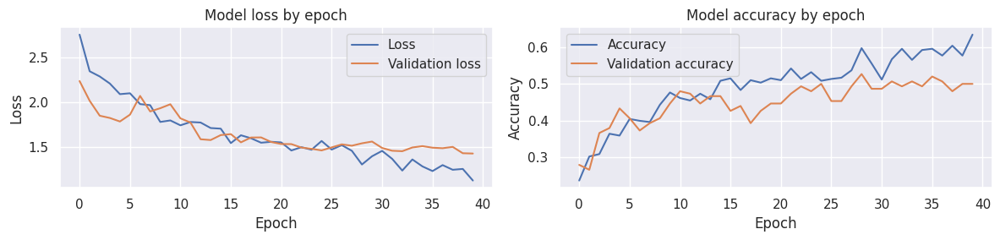

In [ ]:
EPOCHS = 40

training_history_ox_ = odir_vgg_sample.train(model_ox_sample, epochs=EPOCHS)
odir_evaluator_ox_ = OdirModelEvaluator(model_ox_sample, training_history_ox_)
odir_evaluator_ox_.plot_history()

training_history_file_name_ = os.path.join(MODEL_OUTPUT_VGG_PATH, f'{odir_vgg_sample.model_last_path[:-6]}.npy')
np.save(training_history_file_name_, training_history_ox_.history)
training_history_load = np.load(training_history_file_name_, allow_pickle='TRUE').item()

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report,accuracy_score
from tqdm import tqdm

model_ft_sample =  VGG16Model.load_model('model_weights_VGG16_2025-05-26_multiclass.keras')

def model_report(test_generator, model):
  y_pred = []
  y_true = []
  loss_eval = []
  accuracy_eval = []
  len_gen = len(test_generator)
  for i in tqdm(range(len_gen)):
    X_test, y_test = next(test_generator)
    test_pred = model_ft_sample.predict(X_test)
    list_eval = model_ft_sample.evaluate(X_test, y_test)
    loss_eval.append(list_eval[0])
    accuracy_eval.append(list_eval[1])
    y_pred.append(test_pred.argmax(axis = 1))
    y_true.append(y_test)

  return y_true, y_pred, loss_eval, accuracy_eval

y_true, y_pred, loss_eval, accuracy_eval = model_report(data_generator_ox_sample.test_generator, model_ft_sample)
print('model loss function:\n', round(np.mean(loss_eval), 4))
print('model accuracy:\n', round(np.mean(accuracy_eval)*100,2), '%')

  0%|          | 0/5 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 844ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.5500 - loss: 1.3900


 20%|██        | 1/5 [00:06<00:26,  6.54s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - accuracy: 0.2500 - loss: 2.0220


 40%|████      | 2/5 [00:11<00:15,  5.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - accuracy: 0.6500 - loss: 1.5765


 60%|██████    | 3/5 [00:15<00:10,  5.08s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 602ms/step - accuracy: 0.2500 - loss: 1.4999


 80%|████████  | 4/5 [00:19<00:04,  4.47s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - accuracy: 0.6000 - loss: 1.2020


100%|██████████| 5/5 [00:20<00:00,  4.01s/it]

model loss function:
 1.5381
model accuracy:
 46.0 %


In [ ]:
y_pred_class = []
y_test_class = []
y_pred_f = []
y_true_f = []
for i in range(len(y_pred)):
  y_pred_f.extend(y_pred[i])
  y_true_f.extend(y_true[i])
  y_pred_class.extend([OdirDataGenerator.get_class_name(x) for x in y_pred[i]])
  y_test_class.extend([OdirDataGenerator.get_class_name(x) for x in y_true[i]])

print(classification_report(y_test_class, y_pred_class))

              precision    recall  f1-score   support

         AMD       0.41      0.64      0.50        11
    Cataract       0.91      0.91      0.91        11
    Diabetes       0.17      0.10      0.12        10
    Glaucoma       0.73      0.73      0.73        11
Hypertension       0.40      0.40      0.40        10
      Myopia       0.82      0.82      0.82        11
      Normal       0.19      0.30      0.23        10
      Others       0.00      0.00      0.00        10

    accuracy                           0.50        84
   macro avg       0.45      0.49      0.46        84
weighted avg       0.47      0.50      0.48        84



# Execution Model Residual Networks(ResNets-50)

## AUGMENTED VS NON-AUGMENTED

### AUGMENTED V2

Found 15427 validated image filenames belonging to 8 classes.
Training data generated
Found 3857 validated image filenames belonging to 8 classes.
Validation data generated
Found 2143 validated image filenames belonging to 8 classes.
Test data generated


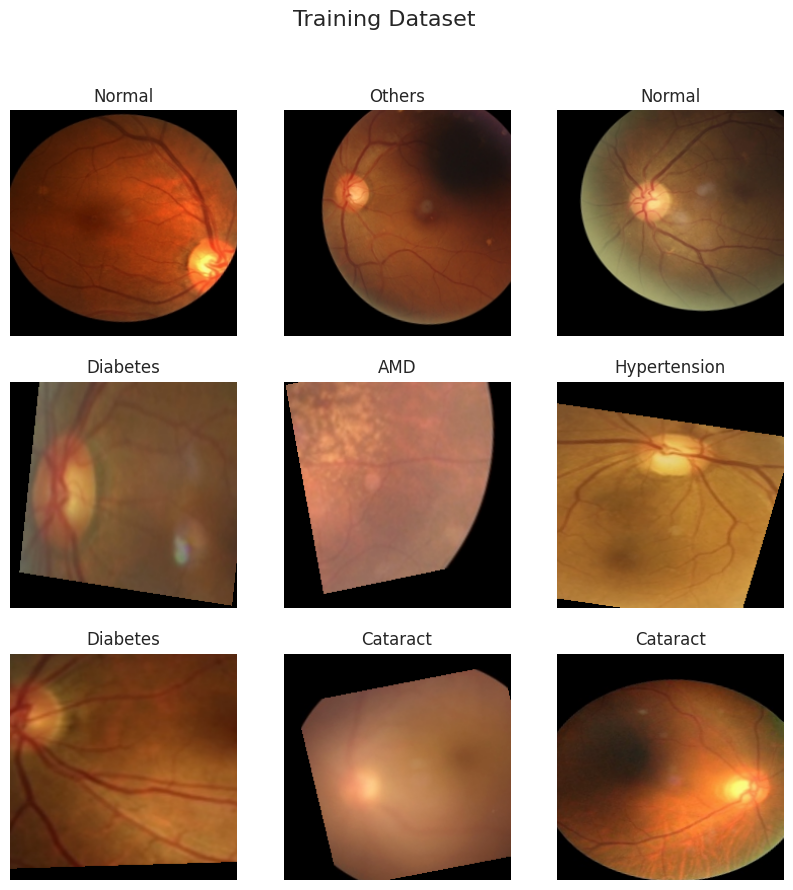

-------------------------------------------------------------------------------------------------------


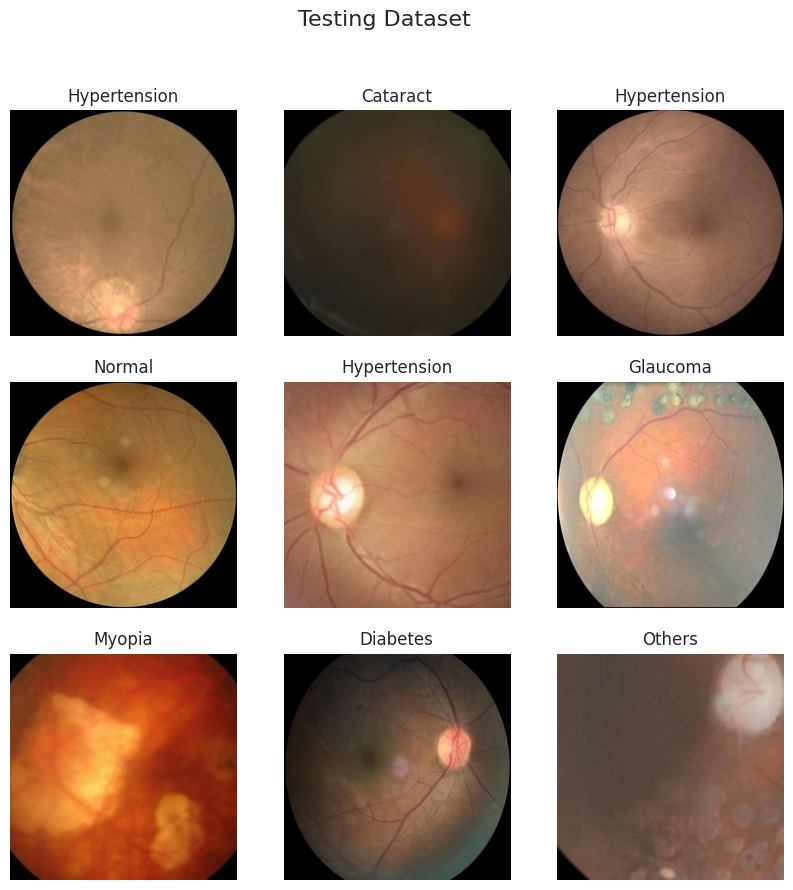

In [ ]:
from keras import backend as K
import numpy as np
import time
import pickle # Saving history


def create_data_generator(visualize_train=True, visualize_test=True):
  odir_df = OdirDataframe.create_multiclass_dataframe()
  data_generator = OdirDataGenerator.from_odir_dataframe(odir_df, batch_size=128)

  # Visualize Data
  if visualize_train:
    data_generator.visualize()
  print('-------------------------------------------------------------------------------------------------------')
  if visualize_test:
    data_generator.visualize(data_test=True)

  return data_generator


data_generator_ex = create_data_generator(True, True)

In [ ]:
odir_resnet, model_ex = ResNet50Model.instanciate_and_setup_model(data_generator_ex, class_mode='multiclass', name='multiclass', layer_trainable_index=140)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 24,163,912 (92.18 MB)

 Trainable params: 15,549,256 (59.32 MB)

 Non-trainable params: 8,614,656 (32.86 MB)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/60
121/121 ━━━━━━━━━━━━━━━━━━━━ 0s 79s/step - accuracy: 0.2998 - loss: 2.9882  
Epoch 1: val_loss improved from inf to 1.95415, saving model to /content/drive/MyDrive/SKRIPSI/PROJECT//model/RESNET/resnet50_model_checkpoint_1.keras
121/121 ━━━━━━━━━━━━━━━━━━━━ 11985s 99s/step - accuracy: 0.3006 - loss: 2.9848 - val_accuracy: 0.6101 - val_loss: 1.9541 - learning_rate: 2.5000e-04
Epoch 2/60
121/121 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5594 - loss: 1.9783
Epoch 2: val_loss improved from 1.95415 to 1.73972, saving model to /content/drive/MyDrive/SKRIPSI/PROJECT//model/RESNET/resnet50_model_checkpoint_2.keras
121/121 ━━━━━━━━━━━━━━━━━━━━ 217s 2s/step - accuracy: 0.5595 - loss: 1.9779 - val_accuracy: 0.6674 - val_loss: 1.7397 - learning_rate: 2.5000e-04
Epoch 3/60
121/121 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6168 - loss: 1.7736
Epoch 3: val_loss improved from 1.73972 to 1.61714, saving model to /content/drive/MyDrive/SKRIPSI/PROJECT//model/RESNET/resnet50_model_check

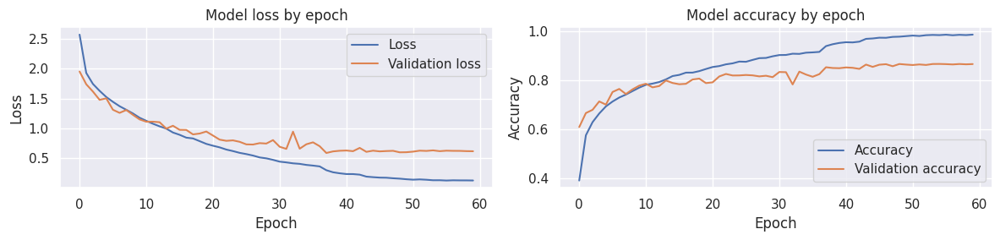

In [ ]:
import numpy as np
import time
import pickle

EPOCHS = 60

training_history_ex = odir_resnet.train(model_ex, epochs=EPOCHS)
odir_evaluator_ex = OdirModelEvaluator(model_ex, training_history_ex)
odir_evaluator_ex.plot_history()

training_history_file_name = os.path.join(MODEL_OUTPUT_RESNET_PATH, f'{odir_resnet.model_last_path[:-6]}.npy')
np.save(training_history_file_name, training_history_ex.history)
training_history_load = np.load(training_history_file_name, allow_pickle='TRUE').item()

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report,accuracy_score
from tqdm import tqdm

model_ft = ResNet50Model.load_model('model_weights_ResNet50_2025-07-02_multiclass.keras')

def model_report(test_generator, model):
  y_pred = []
  y_true = []
  loss_eval = []
  accuracy_eval = []
  len_gen = len(test_generator)
  for i in tqdm(range(len_gen)):
    X_test, y_test = next(test_generator)
    test_pred = model_ft.predict(X_test)
    list_eval = model_ft.evaluate(X_test, y_test)
    loss_eval.append(list_eval[0])
    accuracy_eval.append(list_eval[1])
    y_pred.append(test_pred.argmax(axis = 1))
    y_true.append(y_test)

  return y_true, y_pred, loss_eval, accuracy_eval

y_true, y_pred, loss_eval, accuracy_eval = model_report(data_generator_ex.test_generator, model_ft)

  0%|          | 0/17 [00:00<?, ?it/s]

4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 90ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 94ms/step - accuracy: 0.8052 - loss: 0.7303


  6%|▌         | 1/17 [00:09<02:33,  9.62s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.8896 - loss: 0.5146


 12%|█▏        | 2/17 [00:11<01:11,  4.79s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.8052 - loss: 0.7772


 18%|█▊        | 3/17 [00:12<00:45,  3.24s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.8292 - loss: 0.7001


 24%|██▎       | 4/17 [00:13<00:32,  2.50s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.8427 - loss: 0.6395


 29%|██▉       | 5/17 [00:15<00:25,  2.10s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.8531 - loss: 0.6171


 35%|███▌      | 6/17 [00:16<00:20,  1.86s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - accuracy: 0.8906 - loss: 0.5196


 41%|████      | 7/17 [00:18<00:17,  1.72s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.8615 - loss: 0.5521


 47%|████▋     | 8/17 [00:19<00:14,  1.63s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.8021 - loss: 0.7017


 53%|█████▎    | 9/17 [00:20<00:12,  1.55s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.9125 - loss: 0.3559


 59%|█████▉    | 10/17 [00:22<00:10,  1.50s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.7812 - loss: 0.9253


 65%|██████▍   | 11/17 [00:23<00:08,  1.46s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.8750 - loss: 0.5310


 71%|███████   | 12/17 [00:24<00:07,  1.44s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.7906 - loss: 0.8166


 76%|███████▋  | 13/17 [00:26<00:05,  1.43s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.8667 - loss: 0.4998


 82%|████████▏ | 14/17 [00:27<00:04,  1.41s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.8604 - loss: 0.5684


 88%|████████▊ | 15/17 [00:29<00:02,  1.42s/it]

3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 2s/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 836ms/step - accuracy: 0.7945 - loss: 0.7159


 94%|█████████▍| 16/17 [00:38<00:03,  3.84s/it]

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - accuracy: 0.8479 - loss: 0.4655


100%|██████████| 17/17 [00:40<00:00,  2.36s/it]


In [ ]:
print('model loss function:\n', round(np.mean(loss_eval), 4))
print('model accuracy:\n', round(np.mean(accuracy_eval)*100,2), '%')

model loss function:
 0.6014
model accuracy:
 84.9 %


In [ ]:
y_pred_class = []
y_test_class = []
y_pred_f = []
y_true_f = []
for i in range(len(y_pred)):
  y_pred_f.extend(y_pred[i])
  y_true_f.extend(y_true[i])
  y_pred_class.extend([OdirDataGenerator.get_class_name(x) for x in y_pred[i]])
  y_test_class.extend([OdirDataGenerator.get_class_name(x) for x in y_true[i]])

print(classification_report(y_test_class, y_pred_class))

              precision    recall  f1-score   support

         AMD       0.90      0.94      0.92       261
    Cataract       0.98      0.99      0.98       275
    Diabetes       0.71      0.62      0.66       278
    Glaucoma       0.91      0.91      0.91       261
Hypertension       0.89      0.98      0.94       281
      Myopia       0.97      0.99      0.98       261
      Normal       0.68      0.80      0.74       282
      Others       0.75      0.55      0.64       244

    accuracy                           0.85      2143
   macro avg       0.85      0.85      0.84      2143
weighted avg       0.85      0.85      0.85      2143



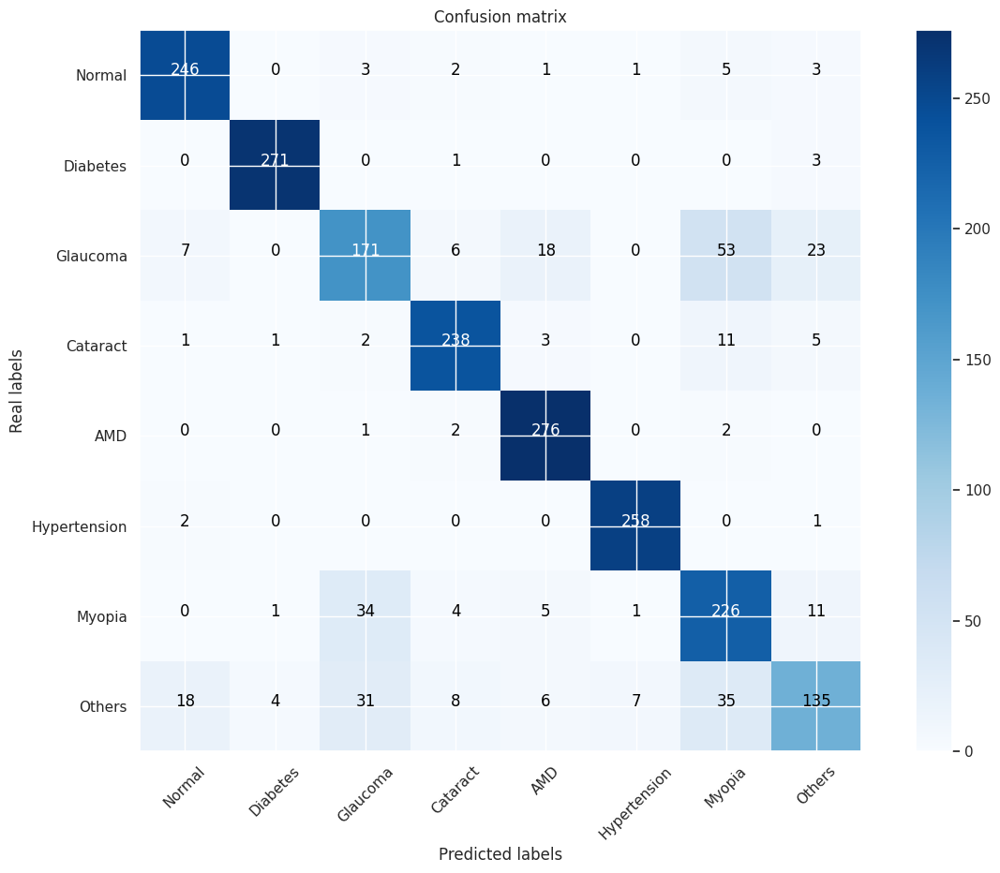

In [ ]:
import itertools
cnf_matrix = confusion_matrix(y_test_class, y_pred_class)
classes = DISEASE_CLASSES

plt.figure(figsize=(15, 10))

plt.imshow(cnf_matrix, interpolation='nearest',cmap='Blues')
plt.title("Confusion matrix")
plt.colorbar()
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)


for i, j in itertools.product(range(cnf_matrix.shape[0]), range(cnf_matrix.shape[1])):
    plt.text(j, i, cnf_matrix[i, j],
             horizontalalignment="center",
             color="white" if cnf_matrix[i, j] > ( cnf_matrix.max() / 2) else "black")

plt.ylabel('Real labels')
plt.xlabel('Predicted labels')
plt.show()

### NON-AUGMENTED IMBALANCE

Found 4367 validated image filenames belonging to 8 classes.
Training data generated
Found 1092 validated image filenames belonging to 8 classes.
Validation data generated
Found 607 validated image filenames belonging to 8 classes.
Test data generated


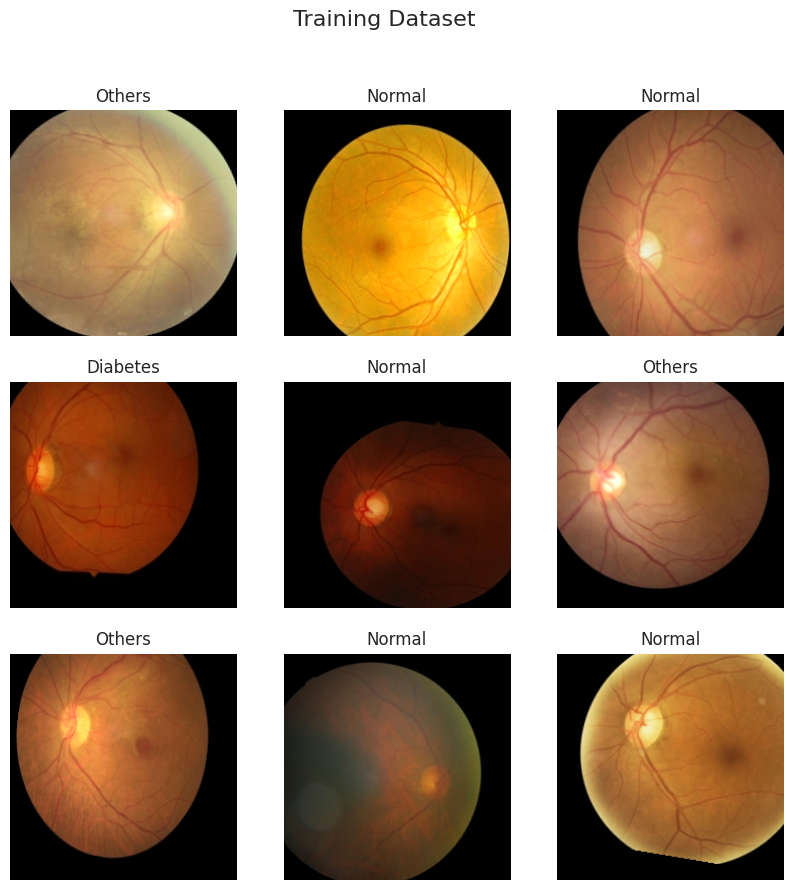

-------------------------------------------------------------------------------------------------------


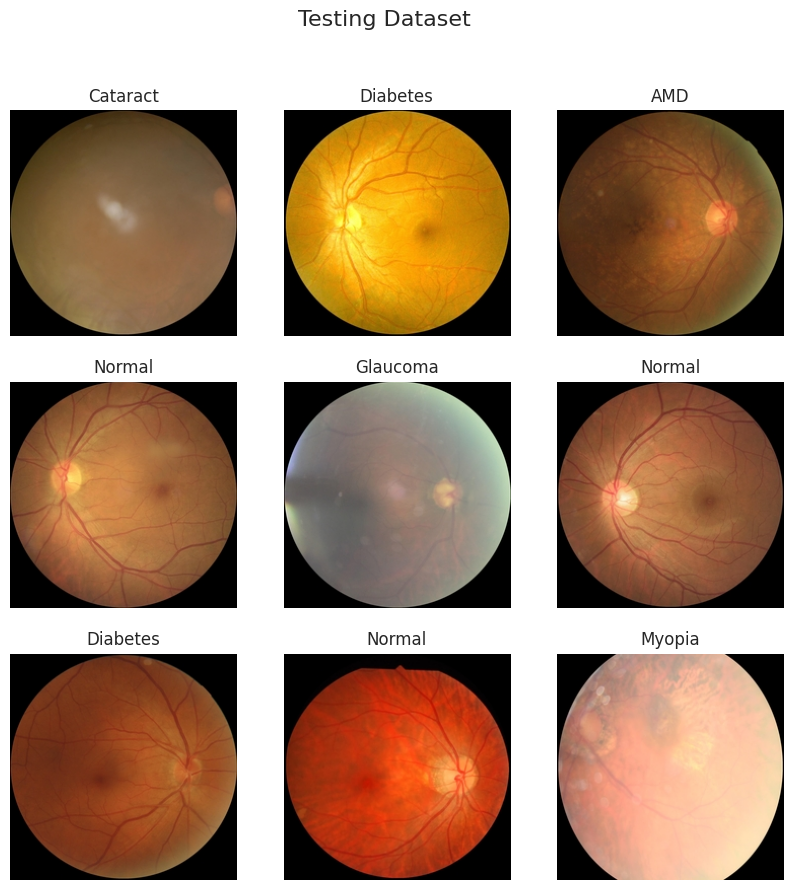

In [ ]:
from keras import backend as K
import numpy as np
import time
import pickle # Saving history

def create_data_generator(visualize_train=True, visualize_test=True):
  odir_df_sample = OdirDataframe.create_multiclass_dataframe()
  data_generator_sample = OdirDataGenerator.from_odir_dataframe(odir_df_sample, batch_size=20)

  # Visualize Data
  if visualize_train:
    data_generator_sample.visualize()
  print('-------------------------------------------------------------------------------------------------------')
  if visualize_test:
    data_generator_sample.visualize(data_test=True)

  return data_generator_sample


data_generator_ex_sample = create_data_generator(True, True)

In [ ]:
odir_resnet_sample, model_ex_sample = ResNet50Model.instanciate_and_setup_model(data_generator_ex_sample, class_mode='multiclass', name='multiclass', layer_trainable_index=140)

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 24,163,912 (92.18 MB)

 Trainable params: 15,549,256 (59.32 MB)

 Non-trainable params: 8,614,656 (32.86 MB)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step - accuracy: 0.1711 - loss: 3.4546
Epoch 1: val_loss improved from inf to 2.73059, saving model to /content/drive/MyDrive/SKRIPSI/PROJECT//model/RESNET/resnet50_model_checkpoint_1.keras
219/219 ━━━━━━━━━━━━━━━━━━━━ 134s 474ms/step - accuracy: 0.1713 - loss: 3.4538 - val_accuracy: 0.4212 - val_loss: 2.7306 - learning_rate: 2.5000e-04
Epoch 2/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step - accuracy: 0.3013 - loss: 2.8828
Epoch 2: val_loss did not improve from 2.73059
219/219 ━━━━━━━━━━━━━━━━━━━━ 107s 376ms/step - accuracy: 0.3013 - loss: 2.8825 - val_accuracy: 0.4487 - val_loss: 2.8158 - learning_rate: 2.5000e-04
Epoch 3/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step - accuracy: 0.3722 - loss: 2.6814
Epoch 3: val_loss improved from 2.73059 to 2.43725, saving model to /content/drive/MyDrive/SKRIPSI/PROJECT//model/RESNET/resnet50_model_checkpoint_3.keras
219/219 ━━━━━━━━━━━━━━━━━━━━ 85s 387ms/step - accuracy: 0.3723 - loss: 2.6811 - val_a

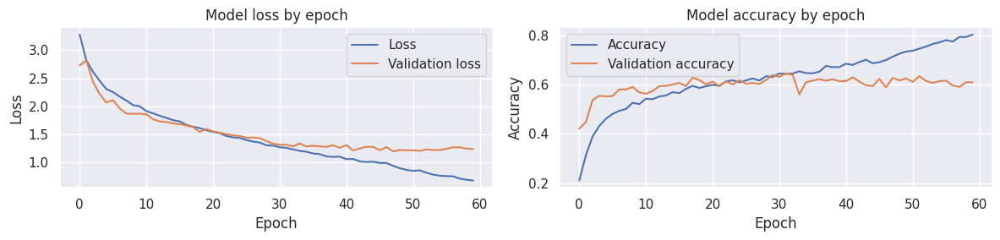

In [ ]:
EPOCHS = 60

training_history_ex_ = odir_resnet_sample.train(model_ex_sample, epochs=EPOCHS)
odir_evaluator_ex_ = OdirModelEvaluator(model_ex_sample, training_history_ex_)
odir_evaluator_ex_.plot_history()

training_history_file_name_ = os.path.join(MODEL_OUTPUT_RESNET_PATH, f'{odir_resnet_sample.model_last_path[:-6]}.npy')
np.save(training_history_file_name_, training_history_ox_.history)
training_history_load = np.load(training_history_file_name_, allow_pickle='TRUE').item()

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report,accuracy_score
from tqdm import tqdm

model_ft_sample = ResNet50Model.load_model('model_weights_ResNet50_2025-05-31_multiclass.keras')

def model_report(test_generator, model):
  y_pred = []
  y_true = []
  loss_eval = []
  accuracy_eval = []
  len_gen = len(test_generator)
  for i in tqdm(range(len_gen)):
    X_test, y_test = next(test_generator)
    test_pred = model_ft_sample.predict(X_test)
    list_eval = model_ft_sample.evaluate(X_test, y_test)
    loss_eval.append(list_eval[0])
    accuracy_eval.append(list_eval[1])
    y_pred.append(test_pred.argmax(axis = 1))
    y_true.append(y_test)

  return y_true, y_pred, loss_eval, accuracy_eval

y_true, y_pred, loss_eval, accuracy_eval = model_report(data_generator_ex_sample.test_generator, model_ft_sample)
print('\m')
print('model loss function:\n', round(np.mean(loss_eval), 4))
print('model accuracy:\n', round(np.mean(accuracy_eval)*100,2), '%')

  0%|          | 0/31 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step - accuracy: 0.5000 - loss: 1.8827


  3%|▎         | 1/31 [00:29<14:45, 29.53s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.8500 - loss: 0.8869


  6%|▋         | 2/31 [00:46<10:39, 22.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.6000 - loss: 1.2346


 10%|▉         | 3/31 [01:02<09:01, 19.34s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.7500 - loss: 0.9552


 13%|█▎        | 4/31 [01:16<07:47, 17.32s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - accuracy: 0.6000 - loss: 1.3972


 16%|█▌        | 5/31 [01:33<07:23, 17.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - accuracy: 0.7500 - loss: 1.1138


 19%|█▉        | 6/31 [01:47<06:44, 16.18s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - accuracy: 0.6000 - loss: 1.5421


 23%|██▎       | 7/31 [02:01<06:10, 15.42s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.6500 - loss: 1.2018


 26%|██▌       | 8/31 [02:18<06:03, 15.81s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.7000 - loss: 1.0701


 29%|██▉       | 9/31 [02:35<05:55, 16.16s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.7500 - loss: 0.8224


 32%|███▏      | 10/31 [02:49<05:28, 15.64s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - accuracy: 0.6500 - loss: 1.1400


 35%|███▌      | 11/31 [03:05<05:16, 15.84s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - accuracy: 0.5000 - loss: 1.1653


 39%|███▊      | 12/31 [03:22<05:02, 15.94s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.7000 - loss: 0.9686


 42%|████▏     | 13/31 [03:38<04:49, 16.10s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.6500 - loss: 1.1648


 45%|████▌     | 14/31 [03:54<04:31, 15.99s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.6000 - loss: 1.3396


 48%|████▊     | 15/31 [04:11<04:19, 16.20s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - accuracy: 0.6500 - loss: 1.2681


 52%|█████▏    | 16/31 [04:25<03:55, 15.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step - accuracy: 0.7500 - loss: 0.7666


 55%|█████▍    | 17/31 [04:40<03:35, 15.37s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - accuracy: 0.6000 - loss: 1.0679


 58%|█████▊    | 18/31 [04:56<03:23, 15.65s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.6500 - loss: 1.3569


 61%|██████▏   | 19/31 [05:12<03:10, 15.86s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 1.0000 - loss: 0.5099


 65%|██████▍   | 20/31 [05:27<02:50, 15.51s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.7000 - loss: 1.0315


 68%|██████▊   | 21/31 [05:39<02:24, 14.49s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.6000 - loss: 1.5853


 71%|███████   | 22/31 [05:51<02:03, 13.67s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.8500 - loss: 0.7628


 74%|███████▍  | 23/31 [06:05<01:51, 13.89s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.7000 - loss: 1.0691


 77%|███████▋  | 24/31 [06:19<01:37, 13.95s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.6000 - loss: 1.2510


 81%|████████  | 25/31 [06:34<01:24, 14.04s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.5000 - loss: 1.5066


 84%|████████▍ | 26/31 [06:48<01:10, 14.06s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - accuracy: 0.5000 - loss: 1.6950


 87%|████████▋ | 27/31 [07:04<00:59, 14.76s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.6500 - loss: 0.9692


 90%|█████████ | 28/31 [07:20<00:45, 15.19s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.4500 - loss: 1.2735


 94%|█████████▎| 29/31 [07:34<00:29, 14.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.4286 - loss: 1.3989


 97%|█████████▋| 30/31 [07:49<00:14, 14.92s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.7500 - loss: 1.0880


100%|██████████| 31/31 [08:01<00:00, 15.52s/it]

\m
model loss function:
 1.1769
model accuracy:
 65.25 %


In [ ]:
y_pred_class = []
y_test_class = []
y_pred_f = []
y_true_f = []
for i in range(len(y_pred)):
  y_pred_f.extend(y_pred[i])
  y_true_f.extend(y_true[i])
  y_pred_class.extend([OdirDataGenerator.get_class_name(x) for x in y_pred[i]])
  y_test_class.extend([OdirDataGenerator.get_class_name(x) for x in y_true[i]])

print(classification_report(y_test_class, y_pred_class))

              precision    recall  f1-score   support

         AMD       0.86      0.25      0.39        24
    Cataract       0.78      0.84      0.81        25
    Diabetes       0.69      0.49      0.57       139
    Glaucoma       0.47      0.41      0.44        22
Hypertension       0.50      0.20      0.29        10
      Myopia       0.86      0.79      0.83        24
      Normal       0.65      0.89      0.75       282
      Others       0.53      0.30      0.38        81

    accuracy                           0.66       607
   macro avg       0.67      0.52      0.56       607
weighted avg       0.66      0.66      0.63       607



### NON-AUGMENTED BALANCE

Found 598 validated image filenames belonging to 8 classes.
Training data generated
Found 150 validated image filenames belonging to 8 classes.
Validation data generated
Found 84 validated image filenames belonging to 8 classes.
Test data generated


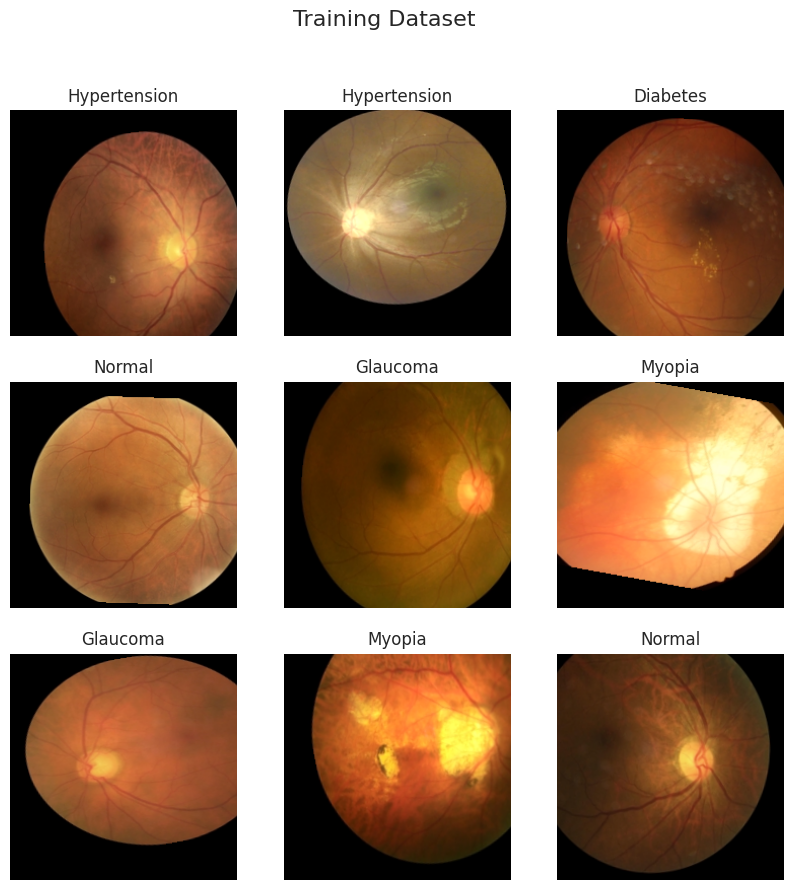

-------------------------------------------------------------------------------------------------------


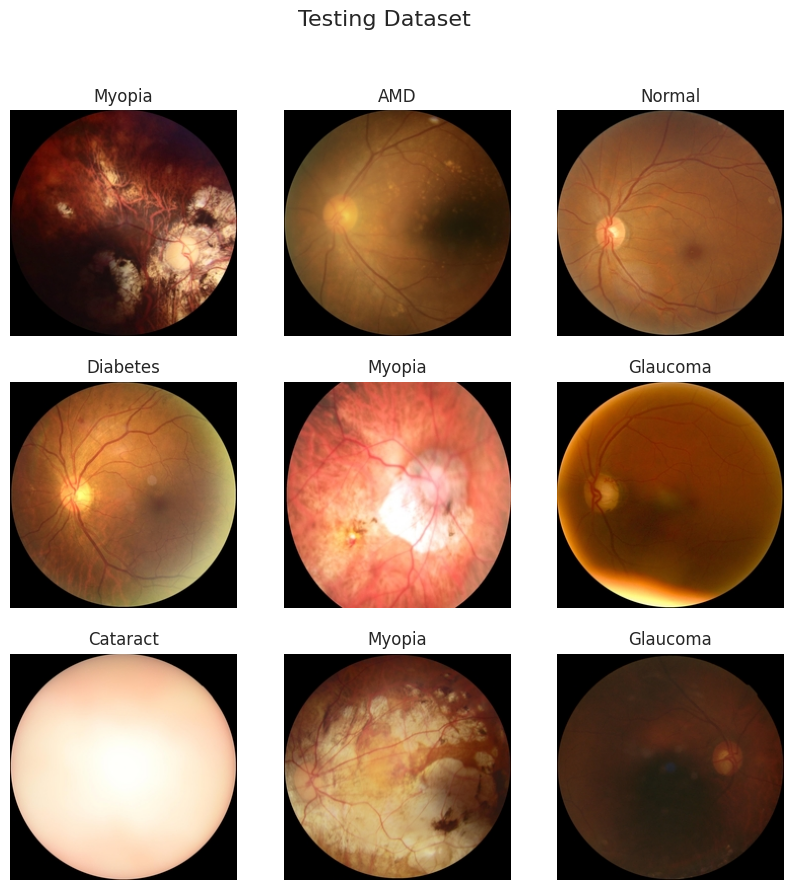

In [ ]:
from keras import backend as K
import numpy as np
import time
import pickle # Saving history

def create_data_generator(visualize_train=True, visualize_test=True):
  odir_df_sample = OdirDataframe.create_multiclass_dataframe()
  data_generator_sample = OdirDataGenerator.from_odir_dataframe(odir_df_sample, sample=104, batch_size=32)

  # Visualize Data
  if visualize_train:
    data_generator_sample.visualize()
  print('-------------------------------------------------------------------------------------------------------')
  if visualize_test:
    data_generator_sample.visualize(data_test=True)

  return data_generator_sample


data_generator_ex_sample = create_data_generator(True, True)

In [ ]:
odir_resnet_sample, model_ex_sample = ResNet50Model.instanciate_and_setup_model(data_generator_ex_sample, class_mode='multiclass', name='multiclass', layer_trainable_index=140)

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 24,163,912 (92.18 MB)

 Trainable params: 15,549,256 (59.32 MB)

 Non-trainable params: 8,614,656 (32.86 MB)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/60
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.1273 - loss: 3.9092
Epoch 1: val_loss improved from inf to 2.60805, saving model to /content/drive/MyDrive/SKRIPSI/PROJECT//model/RESNET/resnet50_model_checkpoint_1.keras
19/19 ━━━━━━━━━━━━━━━━━━━━ 216s 10s/step - accuracy: 0.1287 - loss: 3.8967 - val_accuracy: 0.2400 - val_loss: 2.6081 - learning_rate: 2.5000e-04
Epoch 2/60
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 578ms/step - accuracy: 0.2385 - loss: 3.1189
Epoch 2: val_loss improved from 2.60805 to 2.41993, saving model to /content/drive/MyDrive/SKRIPSI/PROJECT//model/RESNET/resnet50_model_checkpoint_2.keras
19/19 ━━━━━━━━━━━━━━━━━━━━ 13s 705ms/step - accuracy: 0.2389 - loss: 3.1162 - val_accuracy: 0.3600 - val_loss: 2.4199 - learning_rate: 2.5000e-04
Epoch 3/60
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 538ms/step - accuracy: 0.3321 - loss: 2.7637
Epoch 3: val_loss improved from 2.41993 to 2.32317, saving model to /content/drive/MyDrive/SKRIPSI/PROJECT//model/RESNET/resnet50_model_checkpoint_3

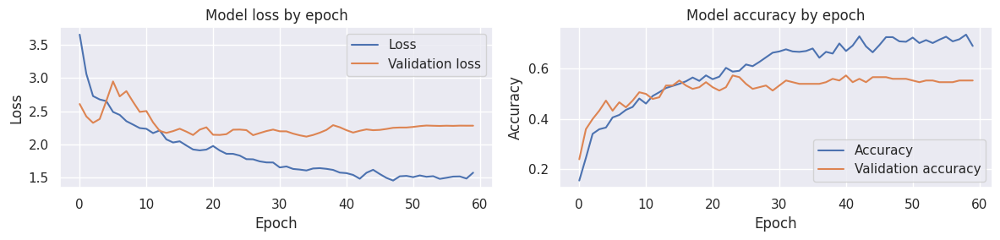

In [ ]:
EPOCHS = 60

training_history_ex_ = odir_resnet_sample.train(model_ex_sample, epochs=EPOCHS)
odir_evaluator_ex_ = OdirModelEvaluator(model_ex_sample, training_history_ex_)
odir_evaluator_ex_.plot_history()

training_history_file_name_ = os.path.join(MODEL_OUTPUT_RESNET_PATH, f'{odir_resnet_sample.model_last_path[:-6]}.npy')
np.save(training_history_file_name_, training_history_ox_.history)
training_history_load = np.load(training_history_file_name_, allow_pickle='TRUE').item()

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report,accuracy_score
from tqdm import tqdm

model_ft_sample = ResNet50Model.load_model('model_weights_ResNet50_2025-05-26_multiclass.keras')

def model_report(test_generator, model):
  y_pred = []
  y_true = []
  loss_eval = []
  accuracy_eval = []
  len_gen = len(test_generator)
  for i in tqdm(range(len_gen)):
    X_test, y_test = next(test_generator)
    test_pred = model_ft_sample.predict(X_test)
    list_eval = model_ft_sample.evaluate(X_test, y_test)
    loss_eval.append(list_eval[0])
    accuracy_eval.append(list_eval[1])
    y_pred.append(test_pred.argmax(axis = 1))
    y_true.append(y_test)

  return y_true, y_pred, loss_eval, accuracy_eval

y_true, y_pred, loss_eval, accuracy_eval = model_report(data_generator_ex_sample.test_generator, model_ft_sample)
print('model loss function:\n', round(np.mean(loss_eval), 4))
print('model accuracy:\n', round(np.mean(accuracy_eval)*100,2), '%')

  0%|          | 0/3 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 42s 42s/step - accuracy: 0.5000 - loss: 1.9646


 33%|███▎      | 1/3 [00:56<01:53, 56.71s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - accuracy: 0.6250 - loss: 1.7282


 67%|██████▋   | 2/3 [01:03<00:27, 27.28s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - accuracy: 0.6562 - loss: 2.1041


100%|██████████| 3/3 [01:08<00:00, 22.93s/it]

model loss function:
 1.9323
model accuracy:
 59.38 %


In [ ]:
y_pred_class = []
y_test_class = []
y_pred_f = []
y_true_f = []
for i in range(len(y_pred)):
  y_pred_f.extend(y_pred[i])
  y_true_f.extend(y_true[i])
  y_pred_class.extend([OdirDataGenerator.get_class_name(x) for x in y_pred[i]])
  y_test_class.extend([OdirDataGenerator.get_class_name(x) for x in y_true[i]])

print(classification_report(y_test_class, y_pred_class))

              precision    recall  f1-score   support

         AMD       0.73      0.73      0.73        11
    Cataract       0.90      0.82      0.86        11
    Diabetes       0.35      0.70      0.47        10
    Glaucoma       0.73      0.73      0.73        11
Hypertension       0.47      0.70      0.56        10
      Myopia       1.00      0.91      0.95        11
      Normal       0.33      0.10      0.15        10
      Others       0.25      0.10      0.14        10

    accuracy                           0.61        84
   macro avg       0.59      0.60      0.57        84
weighted avg       0.61      0.61      0.58        84

